In [1]:
from import_RNA import *

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


In [2]:
import itertools

In [3]:
import warnings

warnings.filterwarnings('ignore')

In [4]:
#
path_dbs = 'Final_Gene_Lists/'
csms = list(pd.read_csv(path_dbs+'csm_final.csv')['gene'])
ics = list(pd.read_csv(path_dbs+'ion_final.csv')['gene'])
nps = list(pd.read_csv(path_dbs+'Neuropeptides.csv', header=None, names=['Genes'])['Genes'])
ntr = list(pd.read_csv(path_dbs+'ntr_final.csv')['gene'])
gpcrs = list(pd.read_excel('MouseHumanRatGPCRs.xlsx')['Gene Symbol (Mouse)'].values)

L23_genes = pd.read_excel('L23_56.xlsx', index_col=0)
L23_genes = list(L23_genes.index)+['Tnc']

tfs = pd.read_table('TFs_mm.txt', header=0)
tfs = list(tfs['Bcl6b'].values)+['Bcl6b']

house = list(pd.read_table('Bulk Cluster Ubiquitous.txt',).transpose()[0:3000].index)

# V1 tDE

In [4]:
P14_V1 = sc.read_h5ad('P14_glut_02112021.h5ad')
P21_V1 = sc.read_h5ad('/P21_glut_12012020.h5ad')

In [5]:
P14_V1.X = P14_V1.raw.X
P21_V1.X = P21_V1.raw.X

In [6]:
gluta_v1 = P14_V1.concatenate(P21_V1)

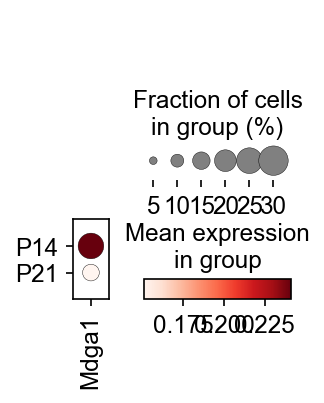

In [7]:
sc.pl.dotplot(gluta_v1, var_names='Mdga1', groupby='Age')

In [8]:
gluta_v1.X

<37199x30869 sparse matrix of type '<class 'numpy.float32'>'
	with 112703744 stored elements in Compressed Sparse Row format>

In [18]:
gluta = sc.read_h5ad('h5ads_cmprsd/gluta_P12+P22_DEready.h5ad')
gluta = gluta[gluta.obs.Sample!='S3']

In [19]:
sub_age = []
for i in range(gluta_v1.shape[0]):
    sub_age.append(gluta_v1.obs['Subclass'][i]+'_'+gluta_v1.obs['Age'][i])
    
gluta_v1.obs['Subclass_age'] = pd.Categorical(sub_age)

NameError: name 'gluta_v1' is not defined

In [ ]:
gluta_v1 = sc.read_h5ad('h5ads_cmprsd/gluta_v1_P14+P21_DEready.h5ad')

In [ ]:
sn.boxenplot(data=gluta_v1.obs, x='sample', y='n_genes',)
plt.xticks(rotation=90)
plt.show()
sn.boxenplot(data=gluta_v1.obs, x='sample', y='n_counts')
plt.xticks(rotation=90)

In [136]:
gluta_v1.obs['sample'].value_counts()

P14_1a    6174
P14_1b    6172
P14_2a    4516
P14_2b    4358
P21_1b    3591
P21_1a    3403
Name: sample, dtype: int64

pts_thresh can be same as for S1 analysis b/c n_counts and n_genes for V1 data is same as S1. We just need to remove samples P21_2a and P21_2b

In [137]:
gluta_v1 = gluta_v1[gluta_v1.obs['sample']!='P21_2a']
gluta_v1 = gluta_v1[gluta_v1.obs['sample']!='P21_2b']

In [138]:
gluta_v1.obs['Age'].value_counts()

P14    21220
P21     6994
Name: Age, dtype: int64

In [139]:
gluta_v1 = gluta_v1[:, list(set(gluta.var_names).intersection(set(gluta_v1.var_names)))]

gluta_v1 = gluta_v1[:,~gluta_v1.var_names.str.startswith('Rp')].copy()
gluta_v1 = gluta_v1[:,~gluta_v1.var_names.str.startswith('mt')].copy()
gluta_v1 = gluta_v1[:,~gluta_v1.var_names.str.startswith('Gm')].copy()
gluta_v1 = gluta_v1[:,~gluta_v1.var_names.str.startswith('AC')].copy()

In [140]:
gluta_v1.shape

(28214, 16563)

above only changes .X but not .raw.X

In [141]:
gluta_v1.raw.X.shape, gluta_v1.X

((28214, 30869),
 <28214x16563 sparse matrix of type '<class 'numpy.float32'>'
 	with 91252249 stored elements in Compressed Sparse Row format>)

In [142]:
gluta_v1.raw = gluta_v1

In [143]:
gluta_v1.write_h5ad('h5ads_cmprsd/gluta_v1_P14+P21_DEready.h5ad')

In [144]:
gluta_v1.raw.X.shape, gluta_v1.X

((28214, 16563),
 <28214x16563 sparse matrix of type '<class 'numpy.float32'>'
 	with 91252249 stored elements in Compressed Sparse Row format>)

Prep gaba object now

In [40]:
P14_V1g = sc.read_h5ad('P14_gaba_March.h5ad')
P21_V1g = sc.read_h5ad('P21_gaba_March.h5ad')

In [42]:
del P14_V1, P21_V1

In [46]:
P14_V1g.X = P14_V1g.raw.X
P21_V1g.X = P21_V1g.raw.X

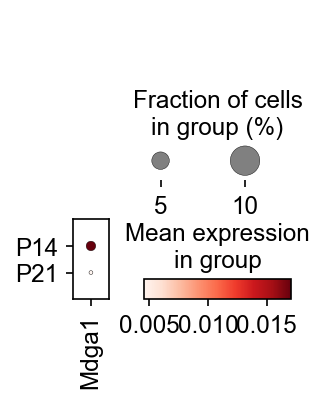

In [47]:
gaba_v1 = P14_V1g.concatenate(P21_V1g)

sc.pl.dotplot(gaba_v1, var_names='Mdga1', groupby='Age')

In [48]:
gaba_v1.X

<5240x30869 sparse matrix of type '<class 'numpy.float32'>'
	with 15079707 stored elements in Compressed Sparse Row format>

In [15]:
gaba = sc.read_h5ad('h5ads_cmprsd/gaba_P12+P22_DEready.h5ad')
gaba = gaba[gaba.obs.Sample!='S3']

In [127]:
sub_age = []
for i in range(gaba_v1.shape[0]):
    sub_age.append(gaba_v1.obs['Subclass'][i]+'_'+gaba_v1.obs['Age'][i])
    
gaba_v1.obs['Subclass_age'] = pd.Categorical(sub_age)

In [128]:
gaba_v1.write_h5ad('h5ads_cmprsd/gaba_v1_P14+P21_DEready.h5ad')

In [127]:
gaba_v1 = sc.read_h5ad('h5ads_cmprsd/gaba_v1_P14+P21_DEready.h5ad')

In [128]:
gaba_v1 = gaba_v1[:,~gaba_v1.var_names.str.startswith('Rp')].copy()
gaba_v1 = gaba_v1[:,~gaba_v1.var_names.str.startswith('mt')].copy()
gaba_v1 = gaba_v1[:,~gaba_v1.var_names.str.startswith('Gm')].copy()
gaba_v1 = gaba_v1[:,~gaba_v1.var_names.str.startswith('AC')].copy()
#subset to genes shared with V1
gaba_v1 = gaba_v1[:, list(set(gaba.var_names).intersection(set(gaba_v1.var_names)))].copy()

above only changes .X but not .raw.X

In [129]:
gaba_v1.raw.X.shape, gaba_v1.X

((3946, 16563),
 <3946x16563 sparse matrix of type '<class 'numpy.float32'>'
 	with 12198942 stored elements in Compressed Sparse Row format>)

In [130]:
gaba_v1.raw = gaba_v1

In [131]:
gaba_v1 = gaba_v1[gaba_v1.obs['sample']!='P21_2a']
gaba_v1 = gaba_v1[gaba_v1.obs['sample']!='P21_2b']


gaba_v1.obs['Age'].value_counts()

P14    2844
P21    1102
Name: Age, dtype: int64

In [132]:
gaba_v1.write_h5ad('h5ads_cmprsd/gaba_v1_P14+P21_DEready.h5ad')

In [145]:
gaba_v1.raw.X.shape, gaba_v1.X

((3946, 16563),
 <3946x16563 sparse matrix of type '<class 'numpy.float32'>'
 	with 12198942 stored elements in Compressed Sparse Row format>)

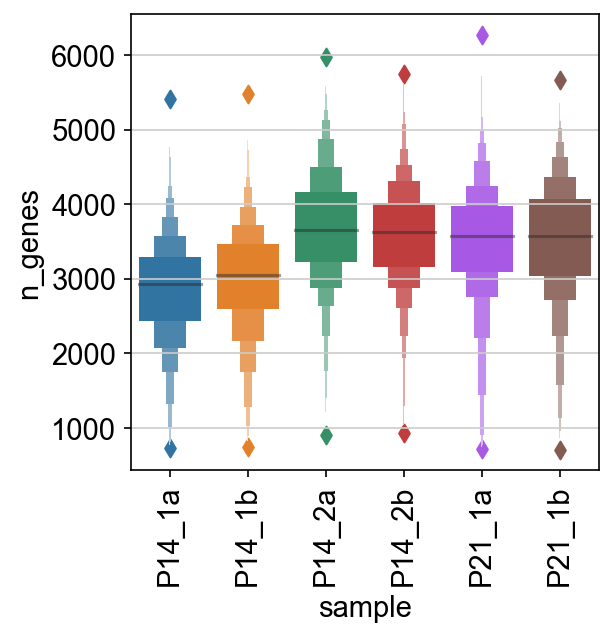

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text major ticklabel objects>)

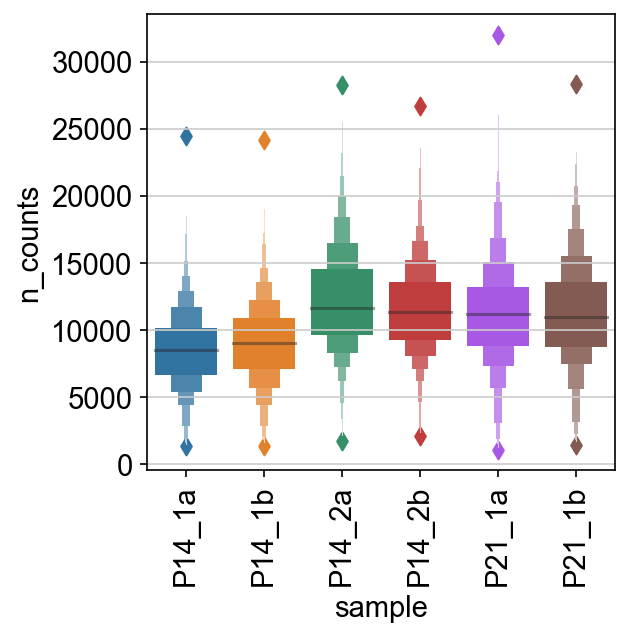

In [133]:
sn.boxenplot(data=gaba_v1.obs, x='sample', y='n_genes',)
plt.xticks(rotation=90)
plt.show()
sn.boxenplot(data=gaba_v1.obs, x='sample', y='n_counts')
plt.xticks(rotation=90)

In [146]:
len(set(gaba.var_names).intersection(set(gaba_v1.var_names)))

16563

In [5]:
gaba_v1 = sc.read_h5ad('h5ads_cmprsd/gaba_v1_P14+P21_DEready.h5ad')
gluta_v1 = sc.read_h5ad('h5ads_cmprsd/gluta_v1_P14+P21_DEready.h5ad')


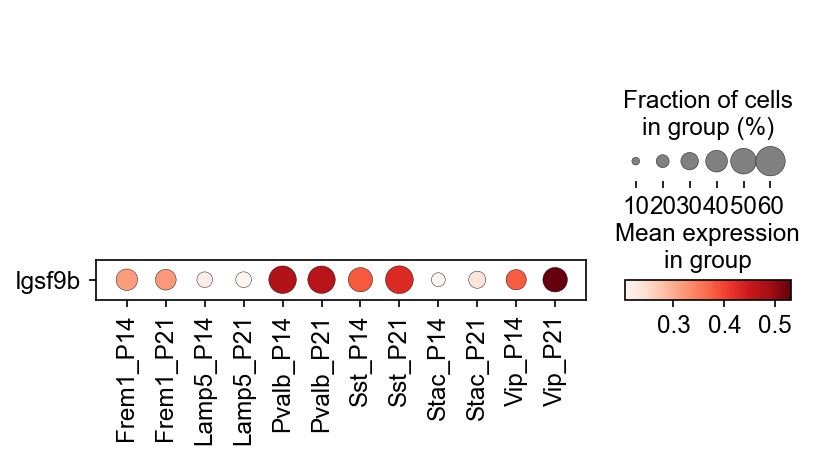

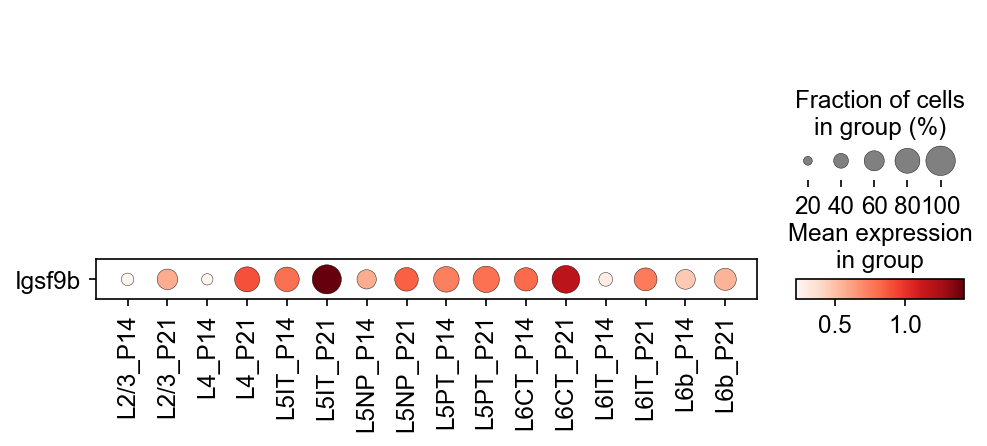

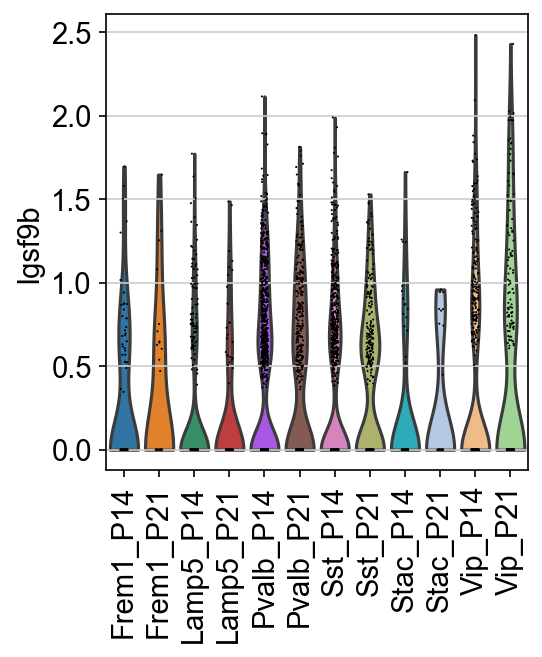

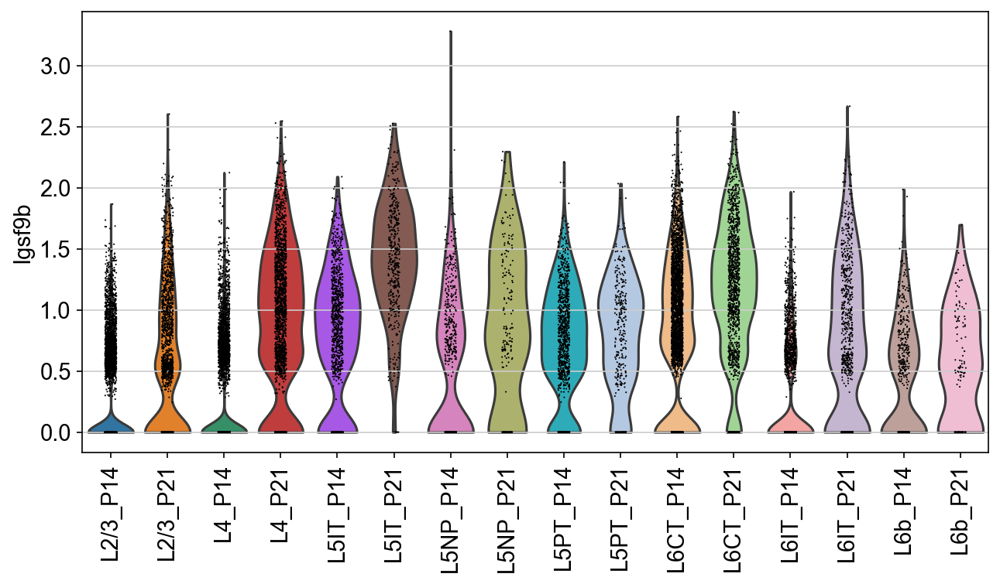

In [7]:
sc.pl.dotplot(gaba_v1, var_names=['Igsf9b'],
                     groupby='Subclass_age',swap_axes=True)
sc.pl.dotplot(gluta_v1, var_names=['Igsf9b'],
                     groupby='Subclass_age',swap_axes=True)

sc.pl.violin(gaba_v1, keys=['Igsf9b'],
                     groupby='Subclass_age', rotation=90,)
fig,axs = plt.subplots(figsize=(10,5))
sc.pl.violin(gluta_v1, keys=['Igsf9b'],
                     groupby='Subclass_age', rotation=90, ax=axs, show=False)

In [21]:
gluta_v1_dict_P14 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:
    df = DE(gluta_v1[gluta_v1.obs['Subclass']==i,:], obs_id='Age', 
                               obs_id_test='P14', ref='rest', pts_thresh=0.4, lf_thresh=1)
    #df = df[df['LF']<4]
    gluta_v1_dict_P14[i+'_P14'] = df[df['p_adj']<0.05]
    #gluta_v1_dict_P14[i+'_P14'] = df

del df
gluta_v1_dict_P21 = dict()
for i in ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',]:

    df = DE(gluta_v1[gluta_v1.obs['Subclass']==i,:], obs_id='Age', 
                              obs_id_test='P21', ref='rest', pts_thresh=0.4, lf_thresh=1)
    
    #df = df[df['LF']<4]
    gluta_v1_dict_P21[i+'_P21'] = df[df['p_adj']<0.05]
    #gluta_v1_dict_P21[i+'_P21'] = df

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
41 51
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
281 283
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
105 197


In [22]:
gaba_v1_dict_P14 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    df = DE(gaba_v1[gaba_v1.obs['Subclass']==i,:], obs_id='Age', 
                               obs_id_test='P14', ref='rest', pts_thresh=0.4, lf_thresh=1)
    #df = df[df['LF']<4]
    gaba_v1_dict_P14[i+'_P14'] = df[df['p_adj']<0.05]
    #gaba_v1_dict_P14[i+'_P14'] = df

del df
gaba_v1_dict_P21 = dict()
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:

    df = DE(gaba_v1[gaba_v1.obs['Subclass']==i,:], obs_id='Age', 
                              obs_id_test='P21', ref='rest', pts_thresh=0.4, lf_thresh=1)
    
    #df = df[df['LF']<4]
    gaba_v1_dict_P21[i+'_P21'] = df[df['p_adj']<0.05]
    #gaba_v1_dict_P21[i+'_P21'] = df

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
40 42
111 120
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
138 152
238 386


In [23]:
def three_cdfs(dict_in,cond):  
    fig, axs = plt.subplots(1,3, figsize=(12,4))
    dict_in_sizes = []
    for i in dict_in.keys():
        dict_in_sizes.append(dict_in[i].shape[0])
        sn.kdeplot(dict_in[i][cond], label=i, cumulative=True, ax=axs[0])   
    axs[0].legend()
    axs[0].set_xlabel('Fraction of cells exp in '+cond)


    for i in dict_in.keys():
        sn.kdeplot(dict_in[i]['LF'], label=i, cumulative=True, ax=axs[1]) 
    axs[1].legend()
    axs[1].set_xlabel('log2FC in '+cond)


    for i in dict_in.keys():
        sn.kdeplot(dict_in[i]['p_adj'], label=i, cumulative=True, ax=axs[2])
    axs[2].legend()
    axs[2].set_xlabel('p_adj in '+cond)

    plt.tight_layout()

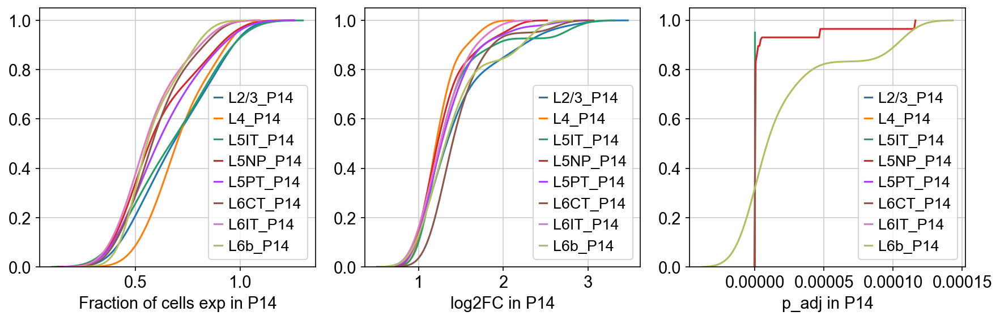

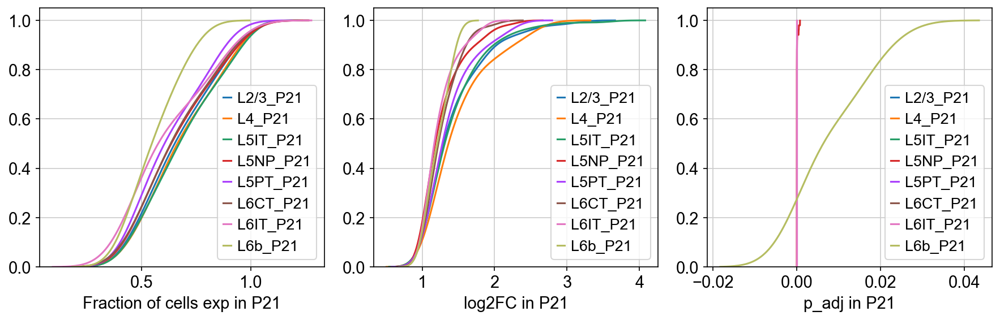

In [24]:
three_cdfs(dict_in=gluta_v1_dict_P14, cond='P14')
three_cdfs(dict_in=gluta_v1_dict_P21, cond='P21')

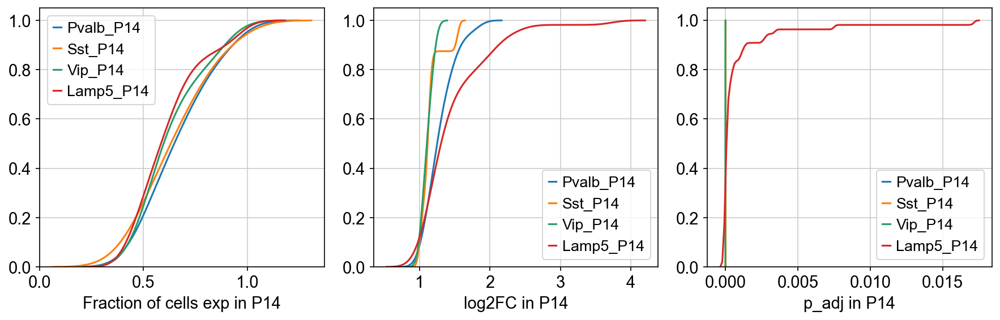

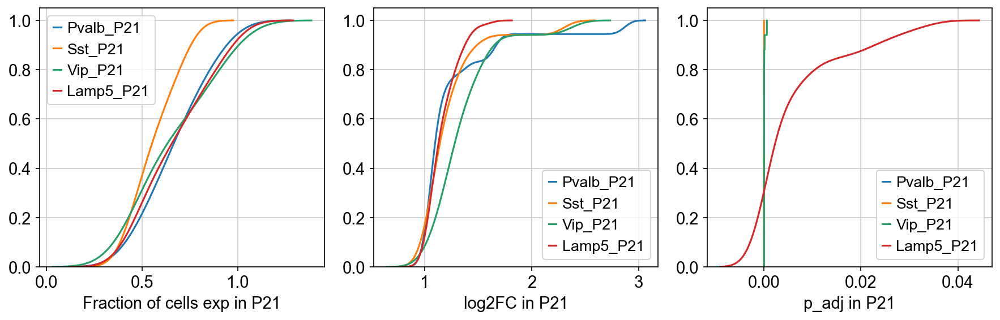

In [25]:
three_cdfs(dict_in=gaba_v1_dict_P14, cond='P14')
three_cdfs(dict_in=gaba_v1_dict_P21, cond='P21')

In [26]:
import upsetplot
#from upsetplot import query, UpSet
from upsetplot import UpSet

In [27]:
from upsetplot import UpSet

In [28]:
glugab14 = gluta_v1_dict_P14
glugab14.update(gaba_v1_dict_P14)

Text(0.5, 0.98, 'P14>P21 V1')

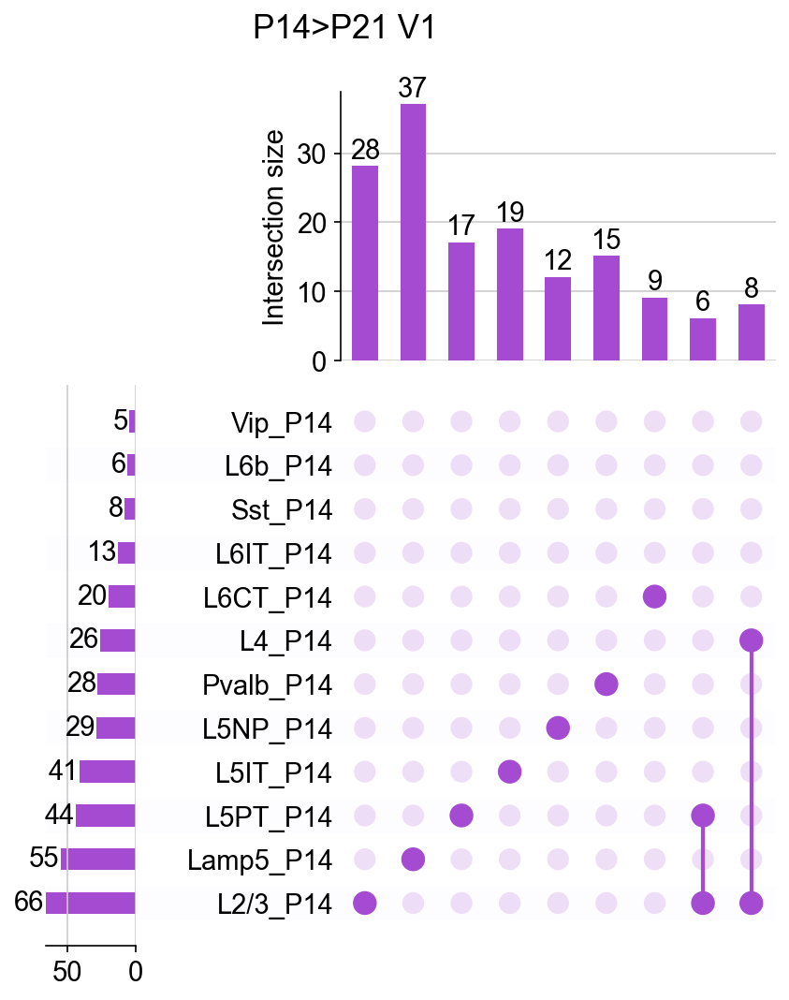

In [155]:
contents=dict()
for i in glugab14:
    contents[i]=list(glugab14[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True,min_subset_size=4
               , facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('P14>P21 V1')

(0.0, 225.0)

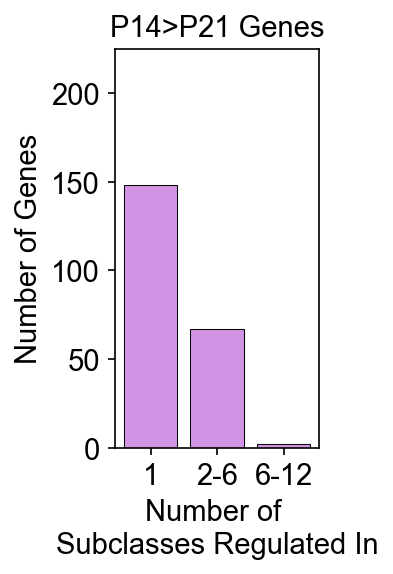

In [156]:
singular = []
medium = []
shared = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true in ((2,3,4,5,6,))):
        medium.append(gene_name)
    else:
        shared.append(gene_name)

plt.figure(figsize=(1.75,3.5))
plt.bar(['1',
        '2-6', '6-12', ], [len(singular),len(medium), len(shared), ],
       color='#D294E5', linewidth=0.5, edgecolor='black')
plt.ylabel('Number of Genes')
plt.title('P14>P21 Genes')
plt.xlabel('Number of \nSubclasses Regulated In')
plt.grid(False)
plt.ylim([0,225])
#plt.savefig('figures/P12>P22_barplot.pdf', bbox_inches='tight')

In [157]:
[len(singular),len(medium), len(shared), ],

([148, 67, 2],)

In [158]:
gaba.shape[1], gaba_v1.shape[1]

(21258, 16563)

In [30]:
glugab21 = gluta_v1_dict_P21
glugab21.update(gaba_v1_dict_P21)

Text(0.5, 0.98, 'P14<P21 V1')

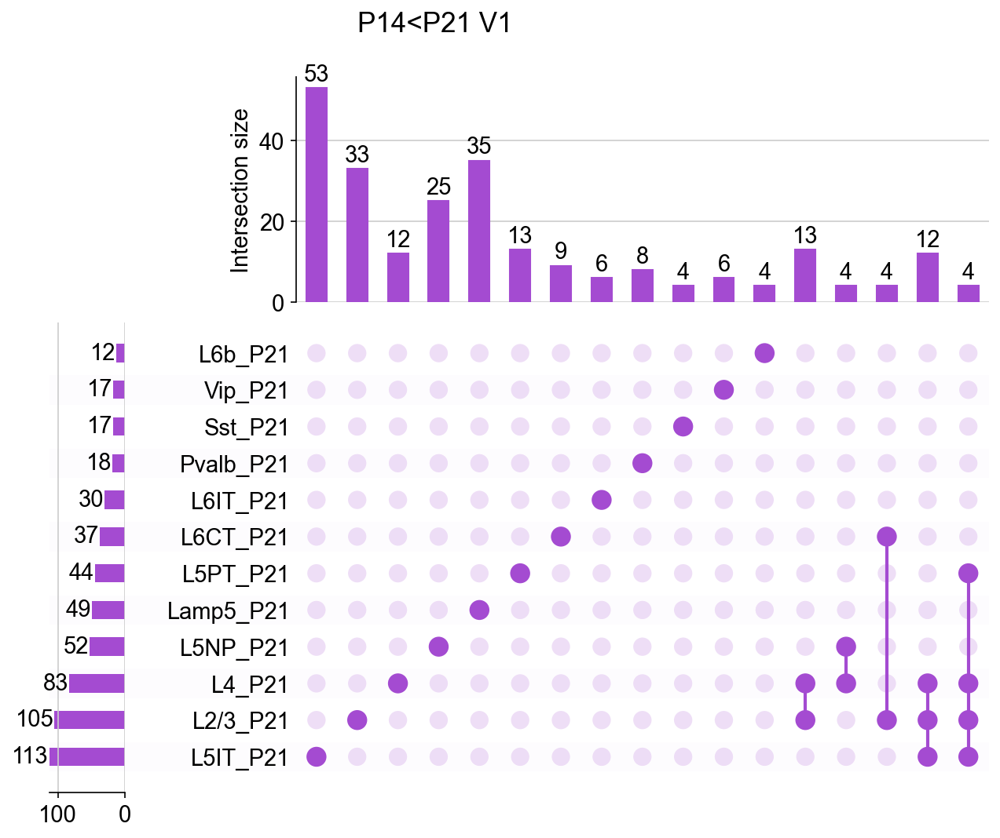

In [31]:
contents=dict()
for i in gluta_v1_dict_P21:
    contents[i]=list(gluta_v1_dict_P21[i].index)
a = upsetplot.from_contents(contents)
upsetplot.plot(a, sort_by='degree', show_counts=True,min_subset_size=4
               , facecolor='#A44BD1', 
               shading_color=0.01,)
plt.suptitle('P14<P21 V1')

(0.0, 225.0)

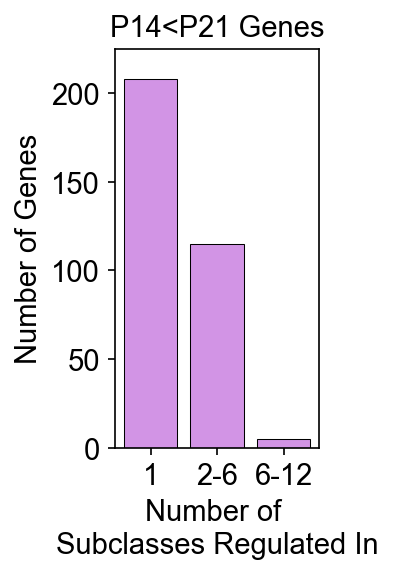

In [161]:
singular = []
medium = []
shared = []
for i in range(a.shape[0]):
    bool_array = a.iloc[i,:].name #bool for each subclass a gene is DE in. True
    gene_name = a.iloc[i,:].values[0]
    num_true = bool_array.count(True)
    if (num_true==1):
        singular.append(gene_name)
    elif (num_true in ((2,3,4,5,6,))):
        medium.append(gene_name)
    else:
        shared.append(gene_name)

plt.figure(figsize=(1.75,3.5))
plt.bar(['1',
        '2-6', '6-12', ], [len(singular),len(medium), len(shared), ],
       color='#D294E5', linewidth=0.5, edgecolor='black')
plt.ylabel('Number of Genes')
plt.title('P14<P21 Genes')
plt.xlabel('Number of \nSubclasses Regulated In')
plt.grid(False)
plt.ylim([0,225])
#plt.savefig('figures/P12>P22_barplot.pdf', bbox_inches='tight')

In [162]:
[len(singular),len(medium), len(shared), ],

([208, 115, 5],)

In [33]:
with open('Figure2_dfs/V1comp_glugab14.pkl', 'wb') as file:
    pickle.dump(glugab14, file)


with open('Figure2_dfs/V1comp_glugab21.pkl', 'wb') as file:
    pickle.dump(glugab21, file)


## Output tables

In [4]:
with open('Figure2_dfs/V1comp_glugab14.pkl', 'rb') as file:
    glugab14 = pickle.load(file)

with open('Figure2_dfs/V1comp_glugab21.pkl', 'rb') as file:
    glugab21 = pickle.load(file)

In [7]:
import pandas as pd
import re

def sanitize_sheet_name(sheet_name):
    # Replace invalid characters with an underscore or another character of your choice
    sanitized_name = re.sub(r'[\\/*?:\[\]]', '_', sheet_name)
    # Optionally, limit the length of the sheet name to 31 characters
    return sanitized_name[:31]

file_path = 'Tables/TableS4.xlsx'

with pd.ExcelWriter(file_path, engine='xlsxwriter') as writer:
    for sheet_name, df in glugab14.items():
        sanitized_name = sanitize_sheet_name(sheet_name+'>P21')
        df.columns = ["Percent Cells Expressing", 'log2fold-change'] + df.columns.tolist()[2:]
        df.to_excel(writer, sheet_name=sanitized_name, index=True)
    for sheet_name, df in glugab21.items():
        # Sanitize the sheet name before writing
        sanitized_name = sanitize_sheet_name(sheet_name+'>P14')
        # Change the first column name to "Percent Cells Expressing"
        df.columns = ["Percent Cells Expressing", 'log2fold-change'] + df.columns.tolist()[2:]
        # Write the DataFrame to the corresponding sheet
        df.to_excel(writer, sheet_name=sanitized_name, index=True)

## V1 - S1 intersection

### HGT

For HGT, need to multiply the p-value by the number of subclasses as a Bonferroni correction for multiple testing.

In [123]:
with open('Figure2_dfs/V1comp_glugab14.pkl', 'rb') as file:
    glugab14 = pickle.load(file)

with open('Figure2_dfs/V1comp_glugab21.pkl', 'rb') as file:
    glugab21 = pickle.load(file)

In [124]:
with open('Figure2_dfs/Fig2_glugab12.pkl', 'rb') as file:
    glugab12 = pickle.load(file)

with open('Figure2_dfs/Fig2_glugab22.pkl', 'rb') as file:
    glugab22 = pickle.load(file)

In [125]:
L23_inter = list(set(glugab14['L2/3_P14'].index).intersection(set(glugab12['L2/3_P12'].index)))

In [126]:
len(L23_inter)

39

In [127]:
import scipy.stats as stats

def hypergeometric_test(set_a, set_b, universal_set):
    N = len(universal_set)  # Size of the universal set: all downreg genes in all subclasses
    K = len(set_a)  # Size of set A
    n = len(set_b)  # Size of set B
    k = len(set_a.intersection(set_b))  # Size of the intersection of A and B

    p_value = stats.hypergeom.sf(k-1, N, K, n)
    return p_value

In [128]:
def run_HGT(dict_v1, dict_s1, subclass):
    univ = []
    for i in dict_v1:
        univ = univ + list(dict_v1[i].index)
    for i in dict_s1:
        univ = univ + list(dict_s1[i].index)

    set_a = set(dict_v1[subclass+'_'+list(dict_v1.keys())[0].split('_')[1]].index)
    set_b = set(dict_s1[subclass+'_'+list(dict_s1.keys())[0].split('_')[1]].index)
    universal_set = set(univ)
    #universal_set = set(list(dict_v1['L2/3_P14'].index)+list(dict_s1['L2/3_P12'].index))

    p_value = hypergeometric_test(set_a, set_b, universal_set)
    p_value_corr = p_value*len(dict_v1)
    #print(subclass,f"P-value: {p_value_corr}")
    return p_value_corr


In [129]:
def run_HGT_matx(dict_v1, dict_s1, subclass):
    #always the same univ background set
    univ = []
    for i in dict_v1:
        univ = univ + list(dict_v1[i].index)
    for i in dict_s1:
        univ = univ + list(dict_s1[i].index)
    
    pval_vec = []
    for s in  ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',
         'Pvalb', 'Sst', 'Vip','Lamp5',]:
        
        set_a = set(dict_v1[subclass+'_'+list(dict_v1.keys())[0].split('_')[1]].index)
        set_b = set(dict_s1[s+'_'+list(dict_s1.keys())[0].split('_')[1]].index)
        universal_set = set(univ)
        #universal_set = set(list(dict_v1['L2/3_P14'].index)+list(dict_s1['L2/3_P12'].index))

        p_value = hypergeometric_test(set_a, set_b, universal_set)
        p_value_corr = p_value*len(dict_v1)
        pval_vec.append(p_value_corr)
    return pval_vec


In [131]:
subs = ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',
         'Pvalb', 'Sst', 'Vip','Lamp5',]
pvals_down = []
for i in subs:
    
    pvals_down.append(run_HGT(glugab14, glugab12, i))

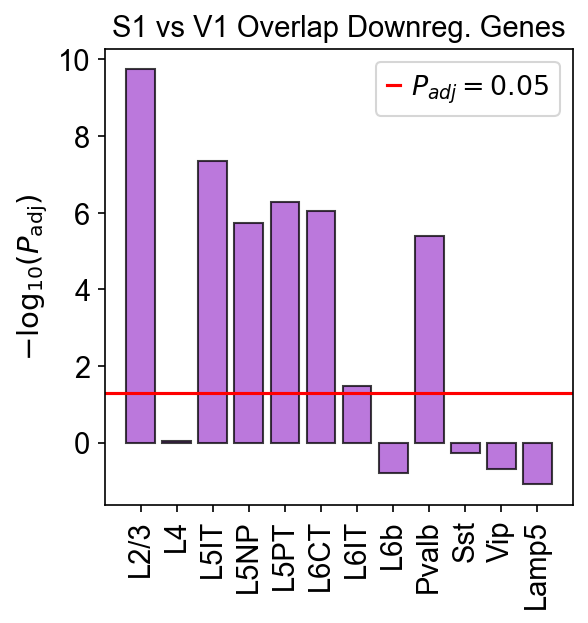

In [132]:
plt.bar(subs, -np.log10(pvals_down), color='#A44BD1',alpha=0.75, edgecolor='black')
plt.axhline(-np.log10(0.05), color='red', label=r'$P_{adj}=0.05$')
plt.grid(False)
plt.xticks(rotation=90)
plt.ylabel(r'$-\log_{10}(P_{\mathrm{adj}})$')
plt.title('S1 vs V1 Overlap Downreg. Genes')
plt.legend()
plt.show()

In [133]:
pvals_up = []
for i in subs:
    pvals_up.append(run_HGT(glugab21, glugab22, i))

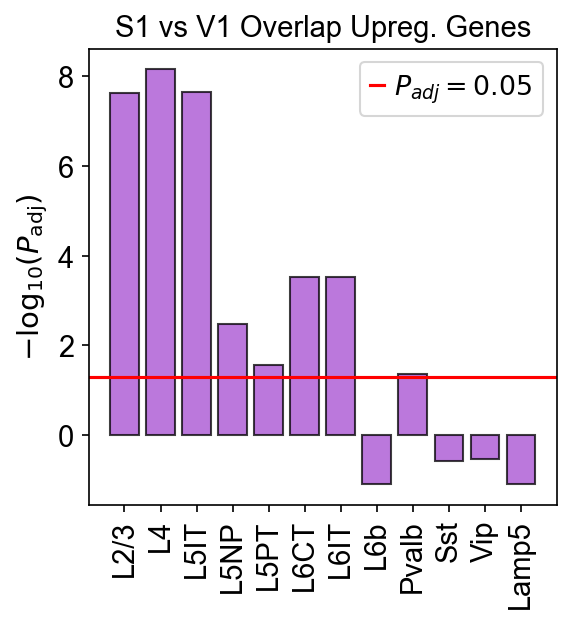

In [134]:
plt.bar(subs, -np.log10(pvals_up), color='#A44BD1',alpha=0.75, edgecolor='black')
plt.axhline(-np.log10(0.05), color='red', label=r'$P_{adj}=0.05$')
plt.grid(False)
plt.xticks(rotation=90)
plt.ylabel(r'$-\log_{10}(P_{\mathrm{adj}})$')
plt.title('S1 vs V1 Overlap Upreg. Genes')
plt.legend()
plt.show()

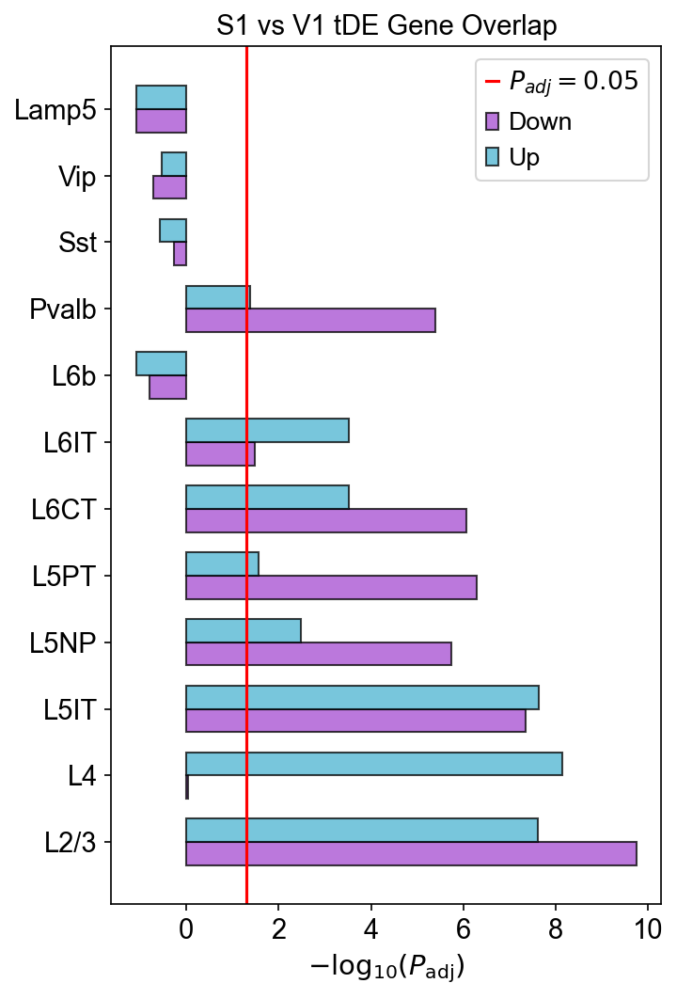

In [135]:
# Define bar width
bar_height = 0.35

# Create positions for the bars
r1 = np.arange(len(subs))
r2 = [x + bar_height for x in r1]

plt.figure(figsize=(5,8))
plt.barh(r1, -np.log10(pvals_down), color='#A44BD1', alpha=0.75, edgecolor='black', height=bar_height, label='Down')
plt.barh(r2, -np.log10(pvals_up), color='#4BB3D1', alpha=0.75, edgecolor='black', height=bar_height, label='Up')

plt.axvline(-np.log10(0.05), color='red', label=r'$P_{adj}=0.05$')

plt.xlabel(r'$-\log_{10}(P_{\mathrm{adj}})$')
plt.title('S1 vs V1 tDE Gene Overlap')

plt.yticks([r + bar_height / 2 for r in range(len(subs))], subs)

plt.legend()
plt.grid(False)
plt.show()


In [136]:
def jaccard_index(set_a, set_b):
    intersection = len(set_a.intersection(set_b))
    union = len(set_a.union(set_b))
    return intersection / union

index = jaccard_index(set(glugab14['L2/3_P14'].index), set(glugab12['L2/3_P12'].index))
print(f"Jaccard Index: {index}")


Jaccard Index: 0.3391304347826087


In [137]:
#inter, in A but not B, in B but not A
len(set_a.intersection(set_b)), len(set_a.difference(set_b)), len(set_b.intersection(set_a))

NameError: name 'set_a' is not defined

In [138]:
set(glugab14['L4_P14'].index)

{'Ankfn1',
 'Cdh20',
 'Cmss1',
 'Cntn6',
 'Cntnap5b',
 'Cpne4',
 'Egfem1',
 'Gpc6',
 'Hs3st5',
 'Lrrtm4',
 'Nav1',
 'Nkain3',
 'Pdzrn4',
 'Pitpnc1',
 'Plppr1',
 'Prkcg',
 'Rasgef1b',
 'Ryr3',
 'Samd5',
 'Sema6a',
 'Sh3rf3',
 'Tenm1',
 'Tiam2',
 'Trpm3',
 'Ttc28',
 'Wwc1'}

In [139]:
set(glugab12['L4_P12'].index)

{'4930509J09Rik',
 '4930590L20Rik',
 '5330434G04Rik',
 'Agpat4',
 'Arhgdig',
 'Atp5e',
 'Atp5g1',
 'Atp5j2',
 'Atp5k',
 'Atp5l',
 'Atp5md',
 'Atp5mpl',
 'Atpif1',
 'Camkv',
 'Cdh13',
 'Cox5b',
 'Cox6a1',
 'Cox6b1',
 'Cox6c',
 'Cox7a2',
 'Cox7c',
 'Cox8a',
 'Dbi',
 'Dner',
 'Dok5',
 'Egfem1',
 'Elob',
 'Fabp5',
 'Fau',
 'Fstl5',
 'Fxyd7',
 'Gap43',
 'Gpc5',
 'Gpc6',
 'Hsbp1',
 'Lrrtm4',
 'Ly6h',
 'Mgat4c',
 'Mgst3',
 'Mif',
 'Nav1',
 'Ndufa1',
 'Ndufa2',
 'Ndufa3',
 'Ndufa4',
 'Ndufa5',
 'Ndufa7',
 'Ndufb1-ps',
 'Ndufb2',
 'Ndufc1',
 'Pdzrn4',
 'Plppr1',
 'Ryr3',
 'Sh3d19',
 'Tmsb10',
 'Ttc28',
 'Tuba1a',
 'Tubb2a',
 'Tubb5',
 'Ubl5',
 'Uqcr10',
 'Uqcr11',
 'Uqcrb',
 'Uqcrq',
 'Ybx1'}

In [140]:
set(glugab14['L4_P14'].index).intersection(set(glugab12['L4_P12'].index))

{'Egfem1', 'Gpc6', 'Lrrtm4', 'Nav1', 'Pdzrn4', 'Plppr1', 'Ryr3', 'Ttc28'}

In [141]:
subs = ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',
         'Pvalb', 'Sst', 'Vip','Lamp5',]
matx_down = []
for i in subs:
    
    matx_down.append(run_HGT_matx(glugab14, glugab12, i))

In [142]:
-np.log10(0.05)

1.3010299956639813

In [163]:
-np.log10(1)

-0.0

In [158]:
down_df = pd.DataFrame(np.vstack(-np.log10(matx_down)), index=subs, columns=subs)

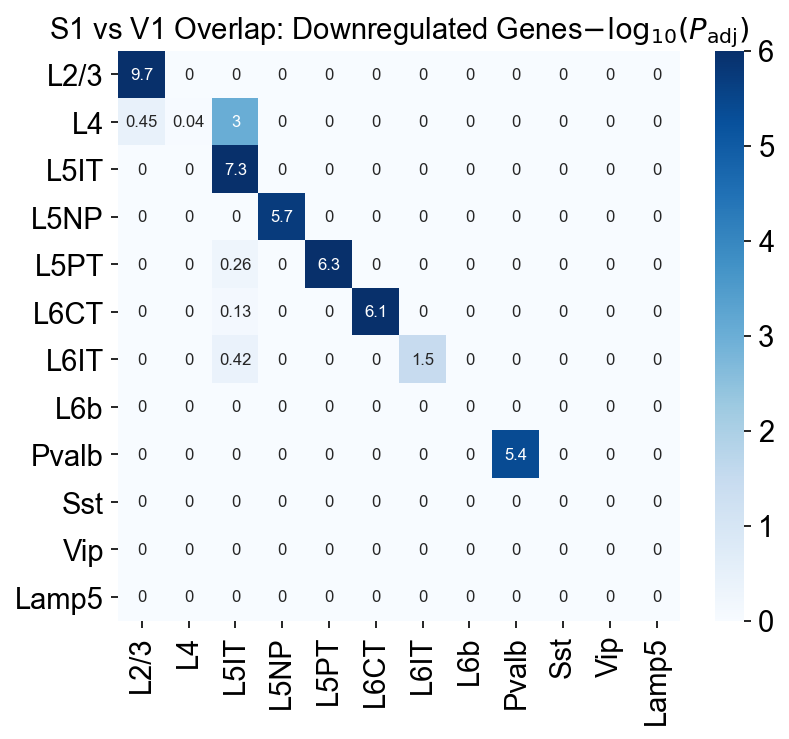

In [177]:
plt.figure(figsize=(6,5))
sn.heatmap(np.round(down_df,2).clip(lower=0),
          vmin=0,vmax=6, cmap='Blues', xticklabels=True,
          annot=True, annot_kws={'fontsize':8},)
plt.title('S1 vs V1 Overlap: Downregulated Genes'+r'$-\log_{10}(P_{\mathrm{adj}})$')
plt.savefig('figures/Fig5A_down.pdf')

In [173]:
subs = ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',
         'Pvalb', 'Sst', 'Vip','Lamp5',]
matx_up = []
for i in subs:
    
    matx_up.append(run_HGT_matx(glugab21, glugab22, i))

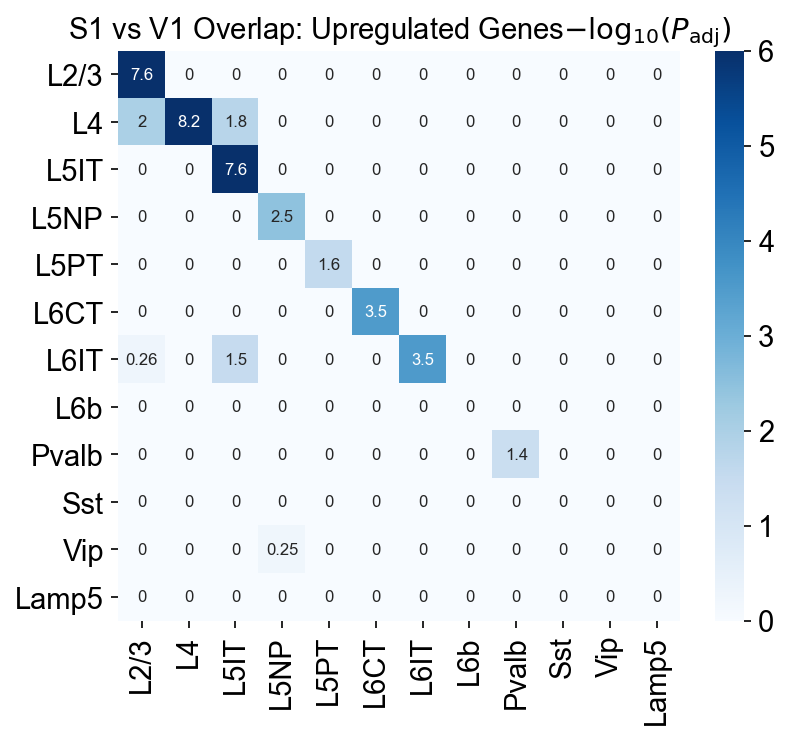

In [178]:
up_df = pd.DataFrame(np.vstack(-np.log10(matx_up)), index=subs, columns=subs)

plt.figure(figsize=(6,5))
sn.heatmap(np.round(up_df,2).clip(lower=0),
          vmin=0,vmax=6, cmap='Blues', xticklabels=True,
          annot=True, annot_kws={'fontsize':8},)
plt.title('S1 vs V1 Overlap: Upregulated Genes'+r'$-\log_{10}(P_{\mathrm{adj}})$')
plt.savefig('figures/Fig5A_up.pdf')

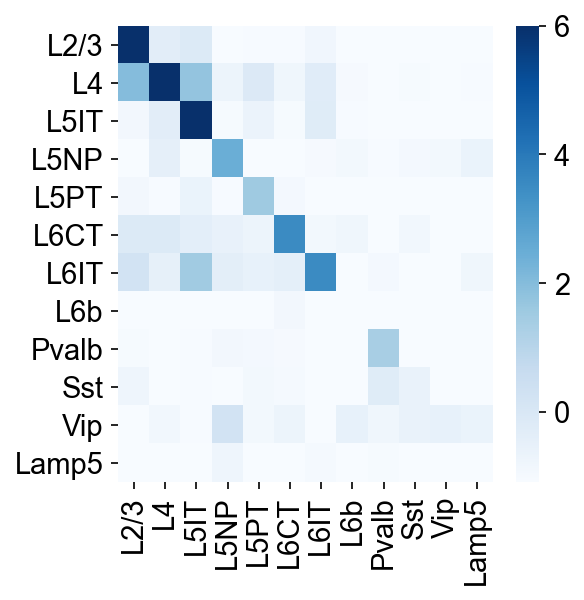

In [68]:
sn.heatmap(pd.DataFrame(np.vstack(-np.log10(matx_up)), index=subs, columns=subs),
          vmax=6, cmap='Blues', xticklabels=True)

### Expression visualization

In [179]:
gluta = sc.read_h5ad('h5ads_cmprsd/gluta_P12+P22_DEready.h5ad')
gluta = gluta[gluta.obs.Sample!='S3']

gluta_v1 = sc.read_h5ad('h5ads_cmprsd/gluta_v1_P14+P21_DEready.h5ad')

In [180]:
gluta.obs['Age'] = gluta.obs['batch']

In [181]:
gluta_both = gluta.concatenate(gluta_v1, batch_categories=['S1', 'V1'], batch_key='Cortex')

In [182]:
age_cort = []
for i in range(gluta_both.shape[0]):
    age_cort.append(gluta_both.obs['Age'][i]+'_'+gluta_both.obs['Cortex'][i])
gluta_both.obs['Age_Ctx'] = pd.Categorical(age_cort)

In [183]:
def get_shared(dict_s1, dict_v1, subclass):
    s1_age = list(dict_s1.keys())[0].split('_')[1]
    v1_age = list(dict_v1.keys())[0].split('_')[1]
    shared_set = set(dict_s1[subclass+'_'+s1_age].index).intersection(dict_v1[subclass+'_'+v1_age].index)
    return list(shared_set)

In [184]:
def arrange_genedbs(gene_list):
    gene_arr = []
    for i in [csms, tfs, ics, ntr, nps, gpcrs]:
        gene_db = list(set(i).intersection(set(gene_list)))
        print(gene_db)
        gene_arr = gene_arr + gene_db
    diff = list(set(gene_list).difference(set(gene_arr)))
    return gene_arr+diff

In [185]:
def s1v1only(dict_s1, dict_v1, subclass, ctx):
    s1_age = list(dict_s1.keys())[0].split('_')[1]
    v1_age = list(dict_v1.keys())[0].split('_')[1]
    diff_s1 = set(dict_s1[subclass+'_'+s1_age].index).difference(dict_v1[subclass+'_'+v1_age].index)
    diff_v1 = set(dict_v1[subclass+'_'+v1_age].index).difference(dict_s1[subclass+'_'+s1_age].index)
    
    if(ctx=='S1'):
        return list(diff_s1)
    elif(ctx=='V1'):
        return list(diff_v1)

In [221]:
def LF_hmap(input_dict, hmap_cols, gene_list):

    out_dict = {}
    for g in gene_list:
        out_dict[g] = []
        for i in input_dict:
            df = input_dict[i]

            if(g in df.index):
                out_dict[g].append(input_dict[i].loc[g]['LF'])
            else:
                out_dict[g].append(0)
                
    
    out_df = pd.DataFrame(data=out_dict).transpose()
    out_df.columns = list(input_dict.keys())

    df_plt = pd.DataFrame(out_df.to_numpy(), index=gene_list, 
                 columns=hmap_cols)
    return df_plt

In [215]:
def remove_duplicates(input_list):
    seen = set()
    return [x for x in input_list if not (x in seen or seen.add(x))]

['Cdh13', 'Cntn5', 'Tenm1', 'Mdga1', 'Ephb2']
['Rfx3']
['Ryr3']
['Grip1', 'Gabrg3']
[]
[]


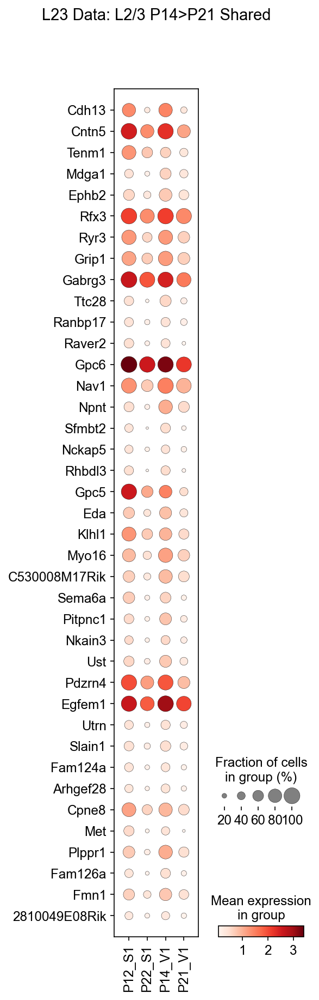

['Scn1b', 'Epha10']
['Cpeb1', 'Dnajc21', 'Tsnax', 'Atf6', 'Zbtb16', 'Smad3']
['Kctd8', 'Scn1b']
[]
[]
[]


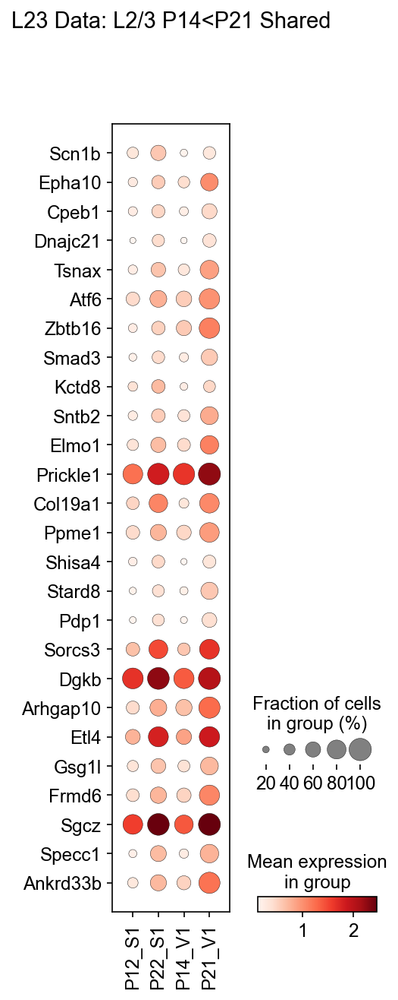

In [236]:
L23_shared = get_shared(glugab12, glugab14, subclass='L2/3')
gene_arr = remove_duplicates(arrange_genedbs(L23_shared))
sc.pl.dotplot(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=gene_arr,
                     groupby='Age_Ctx', 
                     swap_axes=True, categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14>P21 Shared',  save='V1-S1_shared_downreg.pdf')

L23_shared = get_shared(glugab22, glugab21, subclass='L2/3')
gene_arr = remove_duplicates(arrange_genedbs(L23_shared))
sc.pl.dotplot(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=gene_arr,
                     groupby='Age_Ctx', 
                     swap_axes=True, categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14<P21 Shared', save='V1-S1_shared_upreg.pdf')

['Cdh13', 'Cntn5', 'Tenm1', 'Mdga1', 'Ephb2']
['Rfx3']
['Ryr3']
['Grip1', 'Gabrg3']
[]
[]


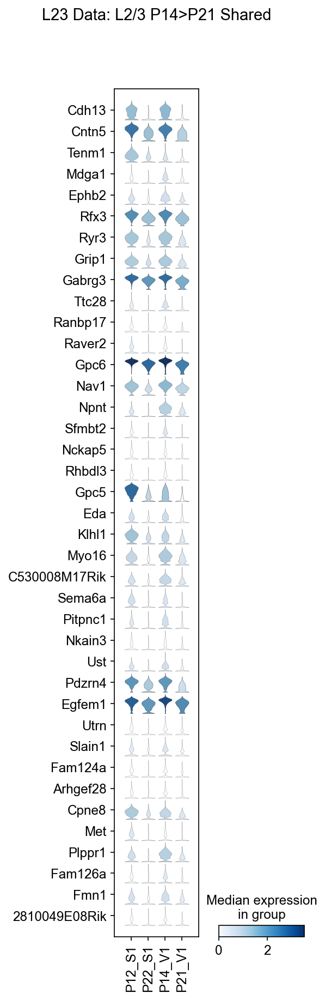

['Scn1b', 'Epha10']
['Cpeb1', 'Dnajc21', 'Tsnax', 'Atf6', 'Zbtb16', 'Smad3']
['Kctd8', 'Scn1b']
[]
[]
[]


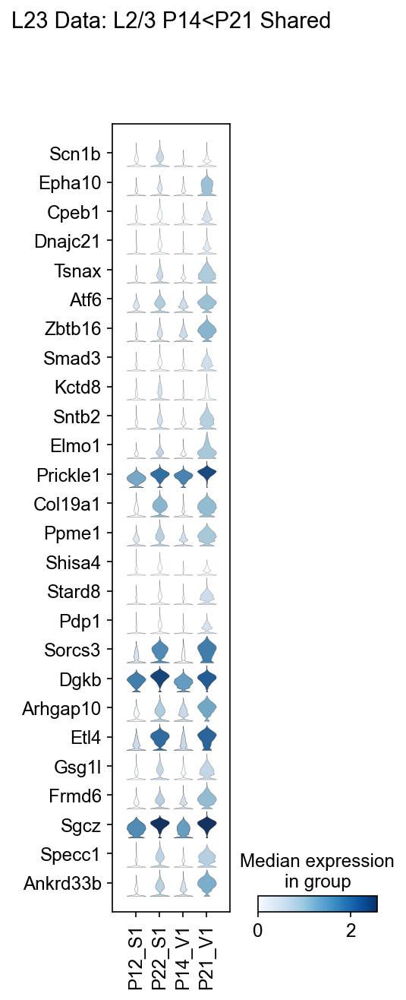

In [218]:
L23_shared = get_shared(glugab12, glugab14, subclass='L2/3')
gene_arr = remove_duplicates(arrange_genedbs(L23_shared))
sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=gene_arr,
                     groupby='Age_Ctx', 
                     swap_axes=True, categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14>P21 Shared',  save='V1-S1_shared_downreg.pdf')

L23_shared = get_shared(glugab22, glugab21, subclass='L2/3')
gene_arr = remove_duplicates(arrange_genedbs(L23_shared))
sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=gene_arr,
                     groupby='Age_Ctx', 
                     swap_axes=True, categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14<P21 Shared', save='V1-S1_shared_upreg.pdf')

In [219]:
in_dic = {'L2/3_P22':glugab22['L2/3_P22'], 
          'L2/3_P21':glugab21['L2/3_P21']}

In [222]:
df_plt = LF_hmap(input_dict=in_dic, hmap_cols=['S1','V1'], gene_list=(gene_arr))

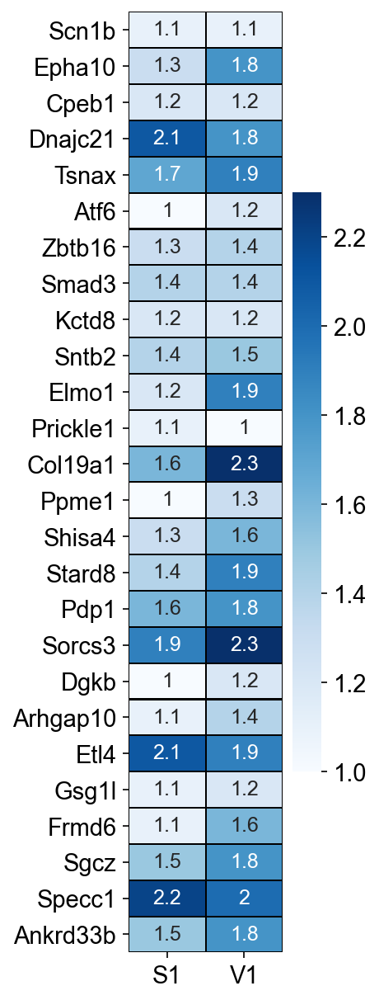

In [228]:
plt.figure(figsize=(2,10))
sn.heatmap(np.round(df_plt, 1), xticklabels=True, yticklabels=True, cmap='Blues', 
           linewidths=0.5, vmin=0,linecolor='black', annot=True, annot_kws={'fontsize':12})


In [231]:
L23_shared = get_shared(glugab12, glugab14, subclass='L2/3')
gene_arr = remove_duplicates(arrange_genedbs(L23_shared))

['Cdh13', 'Cntn5', 'Tenm1', 'Mdga1', 'Ephb2']
['Rfx3']
['Ryr3']
['Grip1', 'Gabrg3']
[]
[]


In [233]:
len(gene_arr)

39

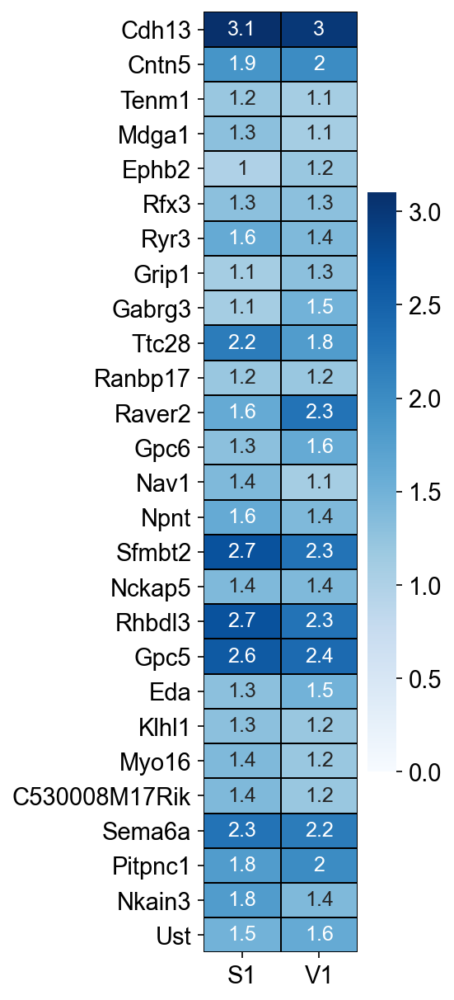

In [235]:
in_dic = {'L2/3_P12':glugab12['L2/3_P12'], 
          'L2/3_P14':glugab14['L2/3_P14']}

df_plt = LF_hmap(input_dict=in_dic, hmap_cols=['S1','V1'], gene_list=gene_arr[0:27])

plt.figure(figsize=(2,10))
sn.heatmap(np.round(df_plt, 1), xticklabels=True, yticklabels=True, cmap='Blues', 
           linewidths=0.5, vmin=0,linecolor='black', annot=True, annot_kws={'fontsize':12})


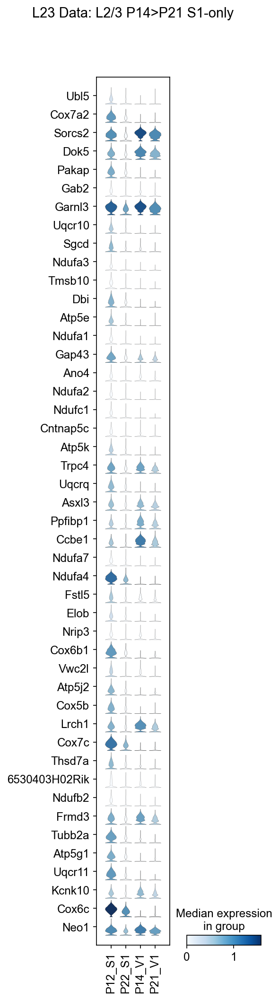

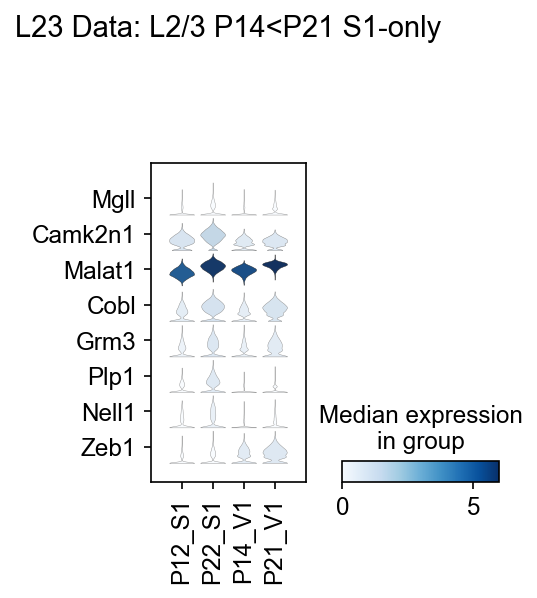

In [249]:
sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=list(set(s1v1only(glugab12, glugab14, 'L2/3', 'S1')).intersection(set(gluta_both.var_names))),
                     groupby='Age_Ctx', 
                     swap_axes=True,categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14>P21 S1-only')

sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=list(set(s1v1only(glugab22, glugab21, 'L2/3', 'S1')).intersection(set(gluta_both.var_names))),
                     groupby='Age_Ctx', 
                     swap_axes=True,categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14<P21 S1-only')

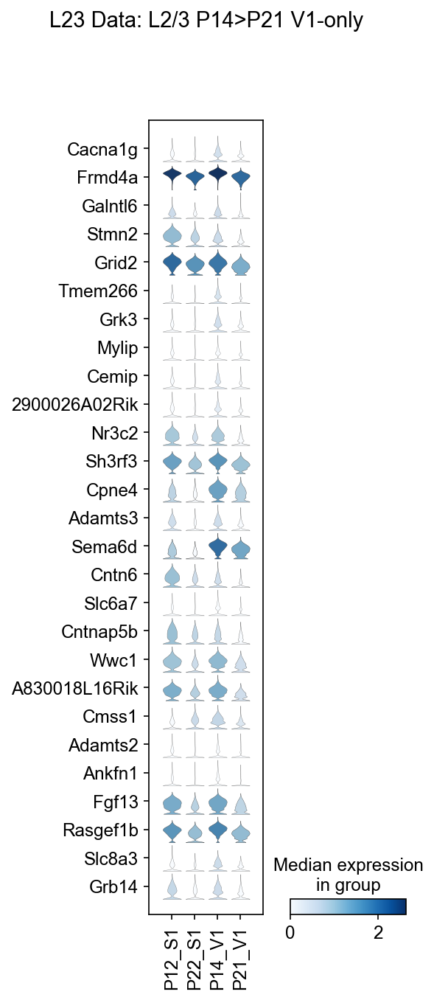

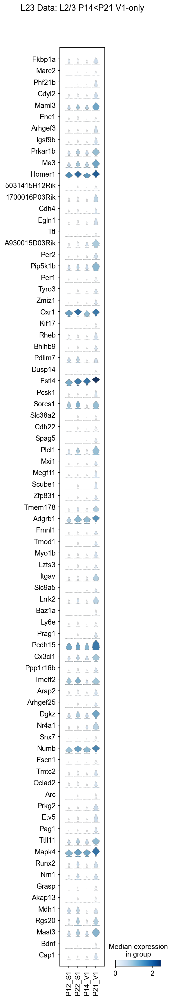

In [250]:
sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=list(set(s1v1only(glugab12, glugab14, 'L2/3', 'V1')).intersection(set(gluta_both.var_names))),
                     groupby='Age_Ctx', 
                     swap_axes=True,categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14>P21 V1-only')

sc.pl.stacked_violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], 
                     var_names=list(set(s1v1only(glugab22, glugab21, 'L2/3', 'V1')).intersection(set(gluta_both.var_names))),
                     groupby='Age_Ctx', 
                     swap_axes=True,categories_order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],
                    title='L23 Data: L2/3 P14<P21 V1-only')

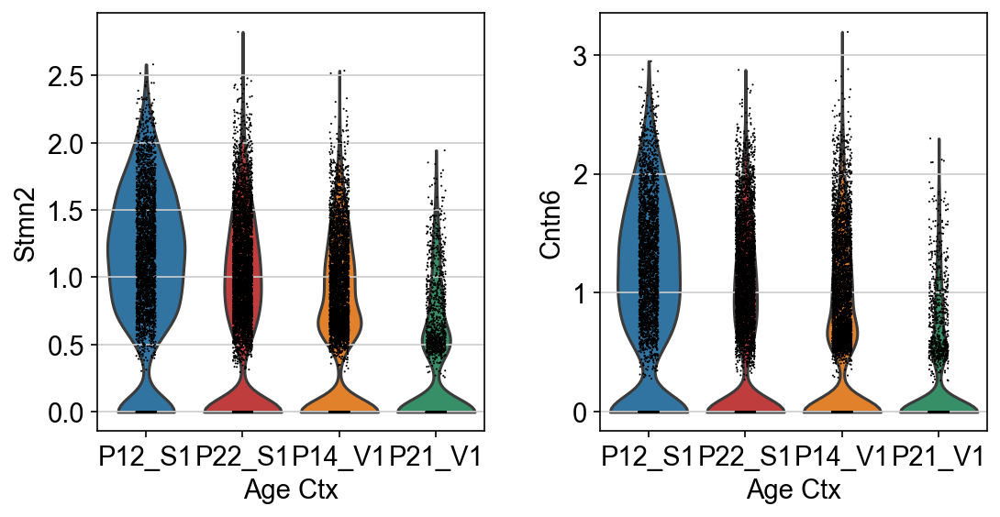

In [241]:
sc.pl.violin(gluta_both[gluta_both.obs['Subclass']=='L2/3',:], keys=['Stmn2', 'Cntn6'],groupby='Age_Ctx', order=['P12_S1', 'P22_S1', 'P14_V1', 'P21_V1'],)

## GO

In [229]:
import textwrap


In [230]:
#prep
import goatools
from genes_ncbi_mus_musculus_proteincoding import GENEID2NT as GeneID2nt_mus

from goatools.base import download_go_basic_obo
from goatools.base import download_ncbi_associations
from goatools.obo_parser import GODag
from goatools.anno.genetogo_reader import Gene2GoReader
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

#run one time to initialize
obo_fname = download_go_basic_obo()
fin_gene2go = download_ncbi_associations()
obodag = GODag("go-basic.obo")

#run one time to initialize
mapper = {}

for key in GeneID2nt_mus:
    mapper[GeneID2nt_mus[key].Symbol] = GeneID2nt_mus[key].GeneID
    
inv_map = {v: k for k, v in mapper.items()}

#run one time to initialize

# Read NCBI's gene2go. Store annotations in a list of namedtuples
objanno = Gene2GoReader(fin_gene2go, taxids=[10090])
# Get namespace2association where:
#    namespace is:
#        BP: biological_process               
#        MF: molecular_function
#        CC: cellular_component
#    assocation is a dict:
#        key: NCBI GeneID
#        value: A set of GO IDs associated with that gene
ns2assoc = objanno.get_ns2assc()

#run one time to initialize
goeaobj = GOEnrichmentStudyNS(
        GeneID2nt_mus.keys(), # List of mouse protein-coding genes
        ns2assoc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['fdr_bh']) # defult multipletest correction method

#run one time to initialize
GO_items = []
temp = goeaobj.ns2objgoea['BP'].assoc
for item in temp:
    GO_items += temp[item]

temp = goeaobj.ns2objgoea['CC'].assoc
for item in temp:
    GO_items += temp[item]

temp = goeaobj.ns2objgoea['MF'].assoc
for item in temp:
    GO_items += temp[item]


#pass list of gene symbols
def go_it(test_genes):
    print(f'input genes: {len(test_genes)}')
    
    mapped_genes = []
    for gene in test_genes:
        try:
            mapped_genes.append(mapper[gene])
        except:
            pass
    print(f'mapped genes: {len(mapped_genes)}')
    
    goea_results_all = goeaobj.run_study(mapped_genes)
    goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
    GO = pd.DataFrame(list(map(lambda x: [x.GO, x.goterm.name, x.goterm.namespace, x.p_uncorrected, x.p_fdr_bh,\
                   x.ratio_in_study[0], x.ratio_in_study[1], GO_items.count(x.GO), list(map(lambda y: inv_map[y], x.study_items)),\
                   ], goea_results_sig)), columns = ['GO', 'term', 'class', 'p', 'p_corr', 'n_genes',\
                                                    'n_study', 'n_go', 'study_genes'])

    GO = GO[GO.n_genes > 1]
    return GO


## run on gluta

  EXISTS: go-basic.obo
  EXISTS: gene2go
go-basic.obo: fmt(1.2) rel(2024-03-28) 45,727 Terms
HMS:0:04:00.911180 443,417 annotations, 29,876 genes, 18,998 GOs, 1 taxids READ: gene2go 

Load BP Ontology Enrichment Analysis ...
 69% 17,956 of 26,205 population items found in association

Load CC Ontology Enrichment Analysis ...
 72% 18,888 of 26,205 population items found in association

Load MF Ontology Enrichment Analysis ...
 66% 17,252 of 26,205 population items found in association


In [323]:
def get_GO_df(subclass):
    dfs = [go_it(get_shared(glugab12, glugab14, subclass=subclass)), go_it(get_shared(glugab22, glugab21, subclass=subclass)),
          go_it(s1v1only(glugab12, glugab14, subclass=subclass, ctx='S1')), go_it(s1v1only(glugab22, glugab21, subclass=subclass, ctx='S1')),
          go_it(s1v1only(glugab12, glugab14, subclass=subclass, ctx='V1')), go_it(s1v1only(glugab22, glugab21, subclass=subclass, ctx='V1'))]

    df1s = []
    for df1 in dfs:
        df1['per'] = df1.n_genes/df1.n_go
        df1['log10(p_adj)'] = -1*np.log10(df1['p_corr'])
        df1 = df1.sort_values(by='log10(p_adj)', ascending=False)
        df1s.append(df1)
        
    return df1s

In [383]:
def plt_GO(df1s, subclass):
    titles = ['Shared '+ subclass+ ' Downreg. Genes', 'Shared '+ subclass+ ' Upreg. Genes',
         'S1-only '+ subclass+ ' Downreg. Genes', 'S1-only '+ subclass+ ' Upreg. Genes',
         'V1-only '+ subclass+ ' Downreg. Genes', 'V1-only '+ subclass+ ' Upreg. Genes']
    fig, axs = plt.subplots(1,len(titles), figsize=(40,8))
    t = 0
    for df1 in df1s:
        if(len(df1)==0):
            
            row = dict(zip(['GO', 'term', 'class', 'p', 'p_corr', 'n_genes', 'n_study', 'n_go',
       'study_genes', 'per', 'log10(p_adj)'], ['None', 'None','None', 0,0, 0, 0, 0,list([]), 0,0]))            
            df1 = df1.append(row, ignore_index=True)
            sn.barplot(data = df1, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black', ax=axs[t])
            axs[t].set_yticklabels([textwrap.fill(term, 25) for term in df1['term']], fontsize=10)
            axs[t].set_title(titles[t])
        else:
            sn.barplot(data = df1, x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black', ax=axs[t])
            axs[t].set_yticklabels([textwrap.fill(term, 25) for term in df1['term']], fontsize=10)
            axs[t].set_title(titles[t])
        t = t + 1
    #plt.subplots_adjust(wspace=0.7)
    plt.tight_layout()
    if (subclass=='L2/3'):
        plt.savefig('figures/'+'L23'+'V1-S1_GO.pdf')
    else: plt.savefig('figures/'+subclass+'V1-S1_GO.pdf')

In [384]:
subs = ['L2/3', 'L4', 'L5IT', 'L5NP', 'L5PT', 'L6CT', 'L6IT', 'L6b',
         'Pvalb', 'Sst', 'Vip','Lamp5',]
df_dict = {}
for i in subs:
    df_dict[i] = get_GO_df(i)

input genes: 39
mapped genes: 36

Runing BP Ontology Analysis: current study set of 36 IDs.
 89%     32 of     36 study items found in association
100%     36 of     36 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     290 terms are associated with     32 of     36 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       7 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 36 IDs.
 92%     33 of     36 study items found in association
100%     36 of     36 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
      97 terms are associated with

   1,821 terms are associated with 18,888 of 26,205 population items
      72 terms are associated with     23 of     27 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 27 IDs.
 81%     22 of     27 study items found in association
100%     27 of     27 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
      86 terms are associated with     22 of     27 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   4,615 terms are associated with 17,249 of 26,205 population items
      83 terms are associated with     33 of     45 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
input genes: 16
mapped genes: 16

Runing BP Ontology Analysis: current study set of 16 IDs.
 88%     14 of     16 study items found in association
100%     16 of     16 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     132 terms are associated with     14 of     16 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items ass

  12,451 terms are associated with 17,956 of 26,205 population items
     202 terms are associated with     31 of     34 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 34 IDs.
 97%     33 of     34 study items found in association
100%     34 of     34 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
      93 terms are associated with     33 of     34 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   1,821 terms are associated with 18,888 of 26,205 population items
     170 terms are associated with     73 of     77 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      49 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 77 IDs.
 94%     72 of     77 study items found in association
100%     77 of     77 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
     216 terms are associated with     72 of     77 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   4,615 terms are associated with 17,249 of 26,205 population items
      41 terms are associated with      8 of      9 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
input genes: 10
mapped genes: 10

Runing BP Ontology Analysis: current study set of 10 IDs.
 80%      8 of     10 study items found in association
100%     10 of     10 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
      32 terms are associated with      8 of     10 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items ass

  12,451 terms are associated with 17,956 of 26,205 population items
     436 terms are associated with     41 of     44 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 44 IDs.
100%     44 of     44 study items found in association
100%     44 of     44 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     107 terms are associated with     44 of     44 study items
  METHOD fdr_bh:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): statsmodels fdr_bh
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   1,821 terms are associated with 18,888 of 26,205 population items
      45 terms are associated with     11 of     12 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 12 IDs.
 92%     11 of     12 study items found in association
100%     12 of     12 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
      32 terms are associated with     11 of     12 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   4,615 terms are associated with 17,249 of 26,205 population items
      21 terms are associated with      5 of      6 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
input genes: 26
mapped genes: 24

Runing BP Ontology Analysis: current study set of 24 IDs.
 88%     21 of     24 study items found in association
100%     24 of     24 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     309 terms are associated with     21 of     24 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items ass

  12,451 terms are associated with 17,956 of 26,205 population items
      29 terms are associated with      3 of      3 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 3 IDs.
100%      3 of      3 study items found in association
100%      3 of      3 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
      25 terms are associated with      3 of      3 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (pu

   1,821 terms are associated with 18,888 of 26,205 population items
      96 terms are associated with     35 of     35 study items
  METHOD fdr_bh:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): statsmodels fdr_bh
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 35 IDs.
 69%     24 of     35 study items found in association
100%     35 of     35 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
      77 terms are associated with     24 of     35 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   4,615 terms are associated with 17,249 of 26,205 population items
      63 terms are associated with     15 of     15 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
input genes: 4
mapped genes: 4

Runing BP Ontology Analysis: current study set of 4 IDs.
100%      4 of      4 study items found in association
100%      4 of      4 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
      31 terms are associated with      4 of      4 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associ

  12,451 terms are associated with 17,956 of 26,205 population items
     103 terms are associated with     10 of     12 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 12 IDs.
 92%     11 of     12 study items found in association
100%     12 of     12 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
      52 terms are associated with     11 of     12 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

   1,821 terms are associated with 18,888 of 26,205 population items
      26 terms are associated with      6 of      7 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 7 IDs.
 86%      6 of      7 study items found in association
100%      7 of      7 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
      46 terms are associated with      6 of      7 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (pu

   4,615 terms are associated with 17,249 of 26,205 population items
       5 terms are associated with      1 of      1 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
input genes: 36
mapped genes: 29

Runing BP Ontology Analysis: current study set of 29 IDs.
 93%     27 of     29 study items found in association
100%     29 of     29 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     345 terms are associated with     27 of     29 study items
  METHOD fdr_bh:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): statsmodels fdr_bh
      11 study items associated with significant GO IDs (enriched)
       0 study items ass

  12,451 terms are associated with 17,956 of 26,205 population items
      15 terms are associated with      1 of      1 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 1 IDs.
100%      1 of      1 study items found in association
100%      1 of      1 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
       3 terms are associated with      1 of      1 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (pu

   1,821 terms are associated with 18,888 of 26,205 population items
     121 terms are associated with     46 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       6 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 48 IDs.
 90%     43 of     48 study items found in association
100%     48 of     48 study items found in population(26205)
Calculating 4,615 uncorrected p-values using fisher_scipy_stats
   4,615 terms are associated with 17,249 of 26,205 population items
     160 terms are associated with     43 of     48 study items
  METHOD fdr_bh:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): statsmodels fdr_bh
       2 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (p

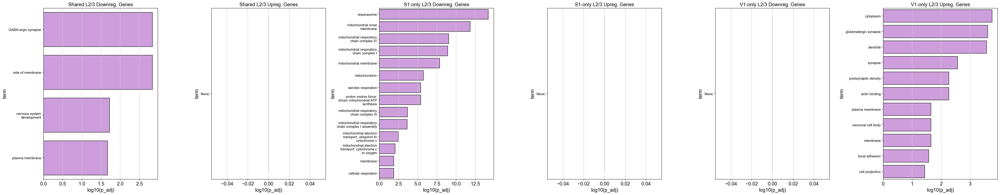

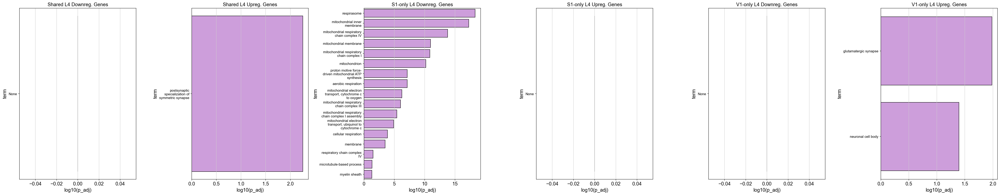

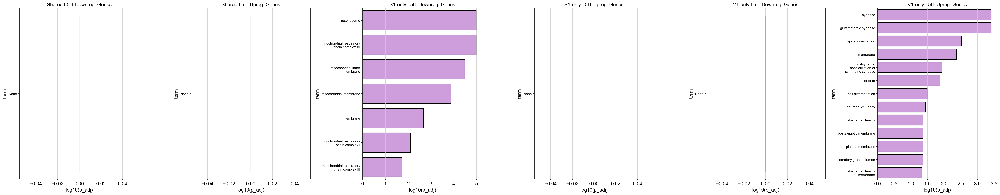

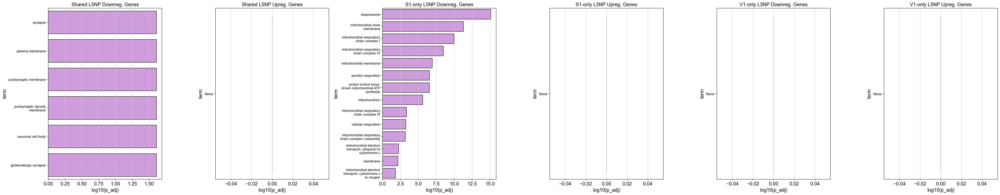

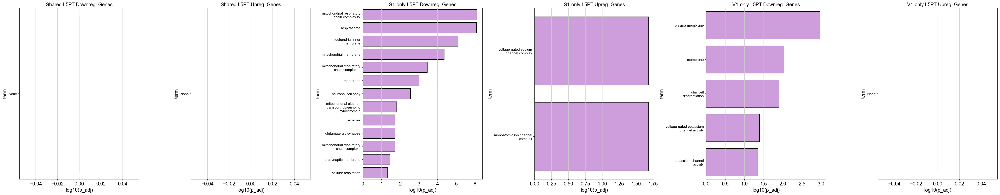

...

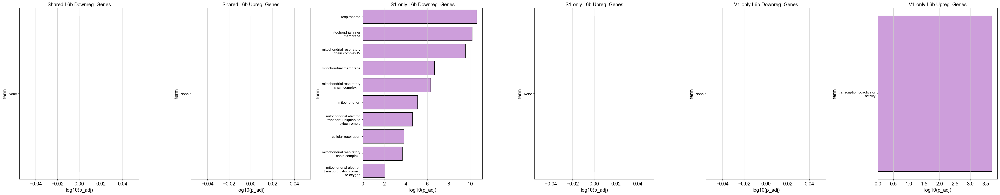

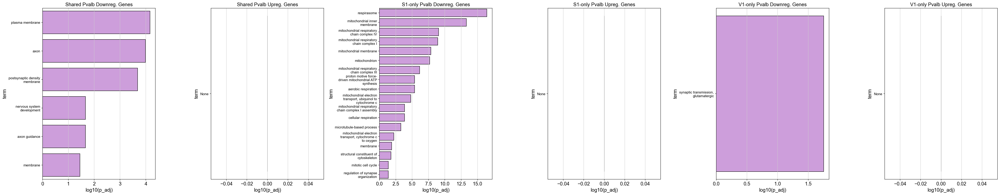

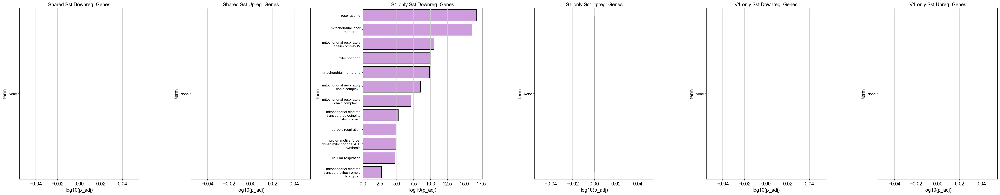

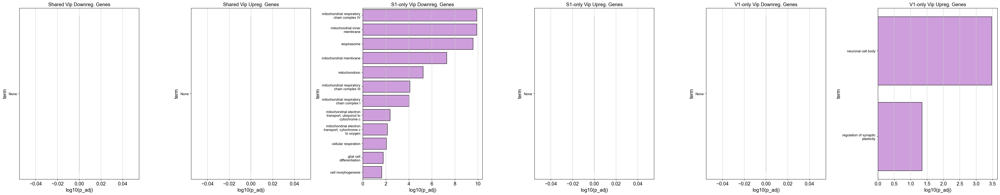

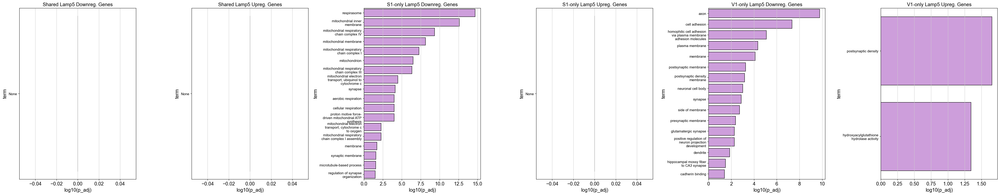

In [385]:
for i in df_dict:
    plt_GO(df_dict[i], i)

In [242]:
s1_down = []
for i in glugab12:
    s1_down = s1_down + list(glugab12[i].index)
    
v1_down = []
for i in glugab14:
    v1_down = v1_down + list(glugab14[i].index)

In [249]:
s1_up = []
for i in glugab22:
    s1_up = s1_up + list(glugab22[i].index)
    
v1_up = []
for i in glugab21:
    v1_up = v1_up + list(glugab21[i].index)

In [255]:
down_GO = go_it(list(set(s1_down).intersection(set(v1_down))))

down_GO['per'] = down_GO.n_genes/down_GO.n_go
down_GO['log10(p_adj)'] = -1*np.log10(down_GO['p_corr'])

input genes: 124
mapped genes: 116

Runing BP Ontology Analysis: current study set of 116 IDs.
 93%    108 of    116 study items found in association
100%    116 of    116 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     778 terms are associated with    108 of    116 study items
  METHOD fdr_bh:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): statsmodels fdr_bh
      56 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 116 IDs.
 97%    112 of    116 study items found in association
100%    116 of    116 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     191 terms are associated 

In [256]:
up_GO = go_it(list(set(s1_up).intersection(set(v1_up))))

up_GO['per'] = up_GO.n_genes/up_GO.n_go
up_GO['log10(p_adj)'] = -1*np.log10(up_GO['p_corr'])

input genes: 101
mapped genes: 98

Runing BP Ontology Analysis: current study set of 98 IDs.
 93%     91 of     98 study items found in association
100%     98 of     98 study items found in population(26205)
Calculating 12,451 uncorrected p-values using fisher_scipy_stats
  12,451 terms are associated with 17,956 of 26,205 population items
     719 terms are associated with     91 of     98 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 98 IDs.
 97%     95 of     98 study items found in association
100%     98 of     98 study items found in population(26205)
Calculating 1,821 uncorrected p-values using fisher_scipy_stats
   1,821 terms are associated with 18,888 of 26,205 population items
     188 terms are associated wit

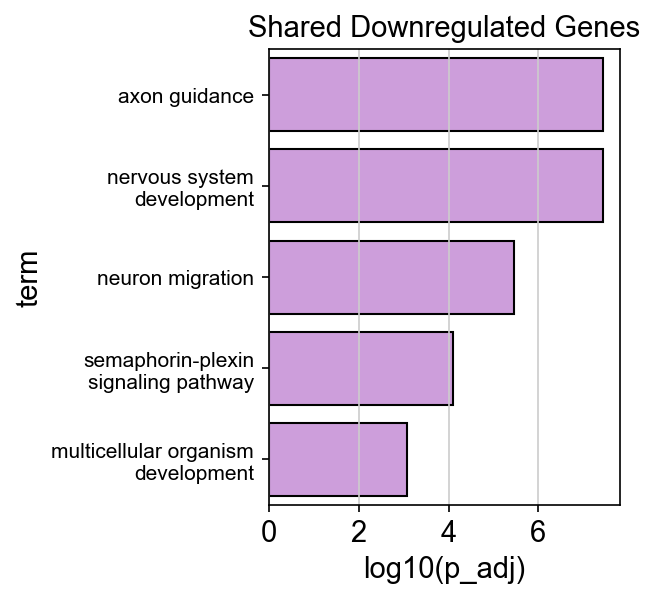

In [276]:
plt.figure(figsize = (3,4))


ax = sn.barplot(data = down_GO[0:5], x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 25) for term in down_GO['term']], fontsize=10)
plt.title('Shared Downregulated Genes')
plt.show()

In [285]:
down_GO.sort_values(by='log10(p_adj)', ascending=False)

,GO,term,class,p,p_corr,n_genes,n_study,n_go,study_genes,per,log10(p_adj)
19,GO:0005886,plasma membrane,cellular_component,6.656117e-20,1.212079e-16,67,116,5143,"[Cacna1g, Arhgef28, Sema5a, Sema5b, Sema6a, Kc...",0.013027,15.916469
20,GO:0045202,synapse,cellular_component,9.849875e-15,8.968311e-12,26,116,889,"[Cdh13, Grin3a, Utrn, Ephb2, Lrrtm4, Stx1a, Sl...",0.029246,11.047289
21,GO:0016020,membrane,cellular_component,1.047174e-11,6.356346e-09,70,116,7776,"[Arhgef28, Cntnap5c, Sema5a, Sema5b, Ghr, Sema...",0.009002,8.196792
22,GO:0098839,postsynaptic density membrane,cellular_component,4.771959e-11,2.172434e-08,10,116,107,"[Lrrtm4, Grin3a, Ptpro, Shisa9, Stx1a, Ptprz1,...",0.093458,7.663053
0,GO:0007411,axon guidance,biological_process,3.102567e-12,3.680630e-08,13,116,191,"[Gap43, Sema5a, Sema5b, Dpysl5, Sema6a, Cntn5,...",0.068063,7.434078
1,GO:0007399,nervous system development,biological_process,5.912184e-12,3.680630e-08,17,116,423,"[Gap43, Dpysl3, Nrbp2, Sema5a, Grip1, Sema5b, ...",0.040189,7.434078
23,GO:0030424,axon,cellular_component,1.747115e-10,6.362992e-08,16,116,455,"[Gap43, Sema6a, Ptprk, Cntn5, Stx1a, Scn3a, Cn...",0.035165,7.196339
24,GO:0098982,GABA-ergic synapse,cellular_component,4.482937e-10,1.360571e-07,10,116,135,"[Gap43, Grip1, Gabrg3, Mdga1, Cntnap4, Cdh13, ...",0.074074,6.866279
25,GO:0030425,dendrite,cellular_component,3.348954e-09,8.712065e-07,16,116,559,"[Prkcg, Cacna1g, Grip1, Dpysl5, Ptprk, Cntnap4...",0.028623,6.059879
26,GO:0098978,glutamatergic synapse,cellular_component,4.428208e-09,1.007971e-06,17,116,654,"[Grip1, Unc13b, Atp2b4, Grin3a, Lrrtm4, Ptpro,...",0.025994,5.996552


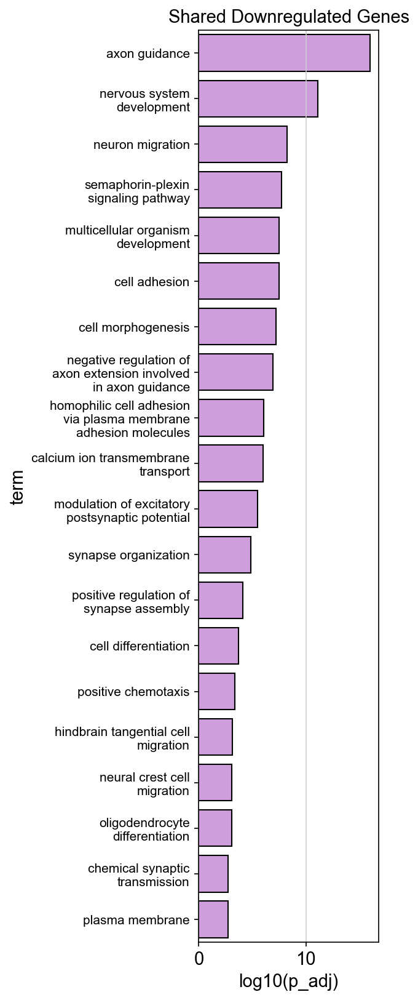

In [305]:
plt.figure(figsize = (2.5,13))


ax = sn.barplot(data = down_GO.sort_values(by='log10(p_adj)', ascending=False)[0:20], x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 25) for term in down_GO['term']], fontsize=10)
plt.title('Shared Downregulated Genes')
plt.show()

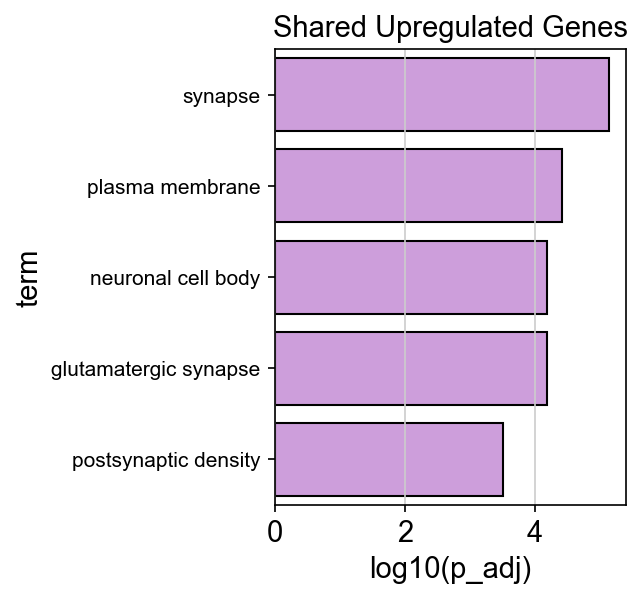

In [277]:
plt.figure(figsize = (3,4))


ax = sn.barplot(data = up_GO[0:5], x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 25) for term in up_GO['term']], fontsize=10)
plt.title('Shared Upregulated Genes')
plt.show()

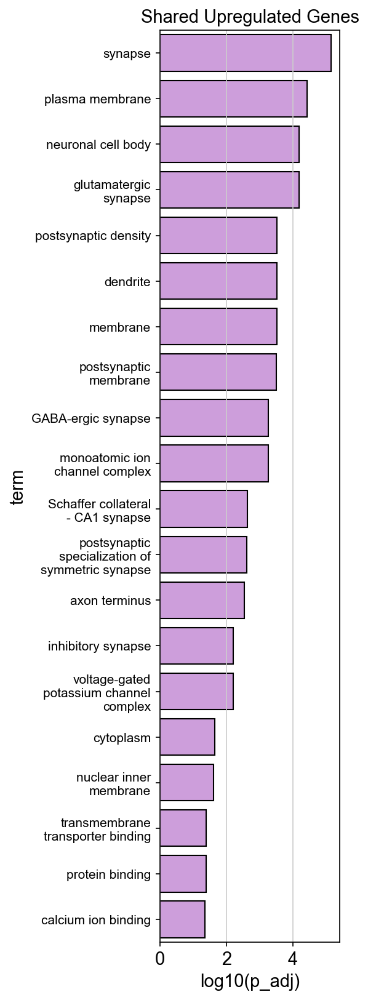

In [304]:
plt.figure(figsize = (2.5,13))


ax = sn.barplot(data = up_GO.sort_values(by='log10(p_adj)', ascending=False)[0:20], x = 'log10(p_adj)', y = 'term', color='#D294E5', edgecolor='black')

ax.set_yticklabels([textwrap.fill(term, 20) for term in up_GO['term']], fontsize=10)
plt.title('Shared Upregulated Genes')
plt.show()

# Cell type freq comparison

## 2022 V1 data

In [21]:
P21_V1 = sc.read_h5ad('P21_glut_12012020.h5ad')
P22_glut = sc.read_h5ad('h5ads/P22Sham_glut_v2.h5ad')

In [22]:
P22_glut.X = P22_glut.raw.X
P21_V1.X = P21_V1.raw.X

**The change below to plot_conf_matx() fixes the indeing issue.**

In [16]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


P21_V1 = P21_V1[:, ['Cdh13', 'Trpc6', 'Chrm2']].copy()
P22_glut = P22_glut[:, ['Cdh13', 'Trpc6', 'Chrm2']].copy()

P21_V1.raw = P21_V1
P22_glut.raw = P22_glut

1027 shared HVGs
trainclassifier() complete after 899.0 seconds


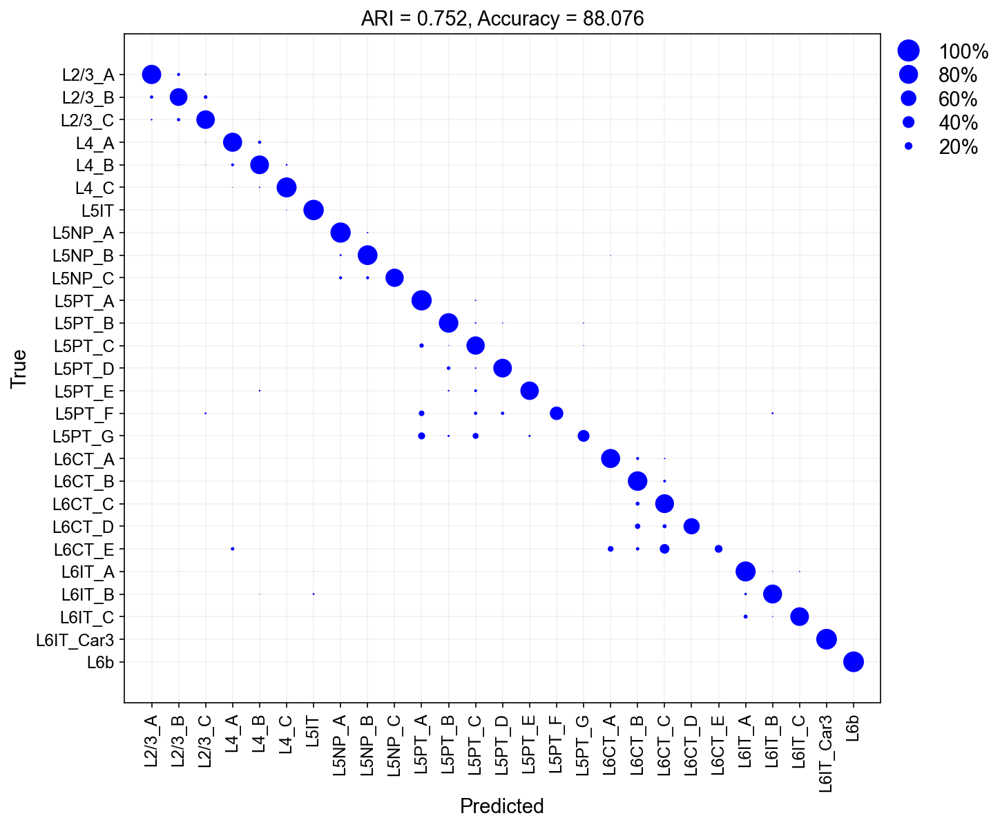

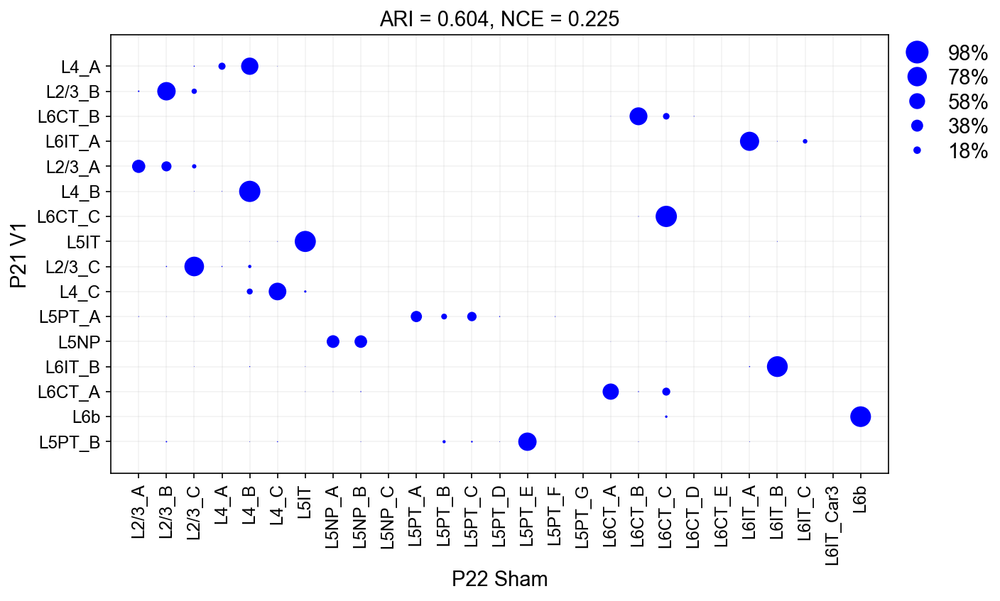

In [23]:
test_items, mapping_items = pairwise_map(adata_t0=P21_V1, adata_t1=P22_glut,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=True, union_hvgs=False,
                                         t0_dict=make_dict(P21_V1, 'Type'),
                                         t1_dict=make_dict(P22_glut, 'Type'),
                                        min_cells=100, x_lab='P22 Sham', y_lab='P21 V1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items

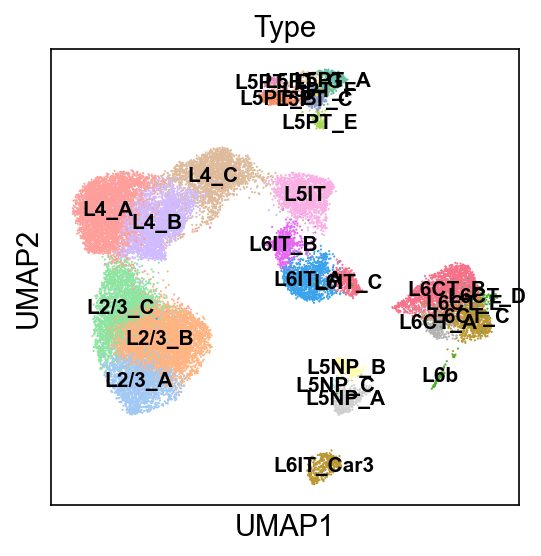

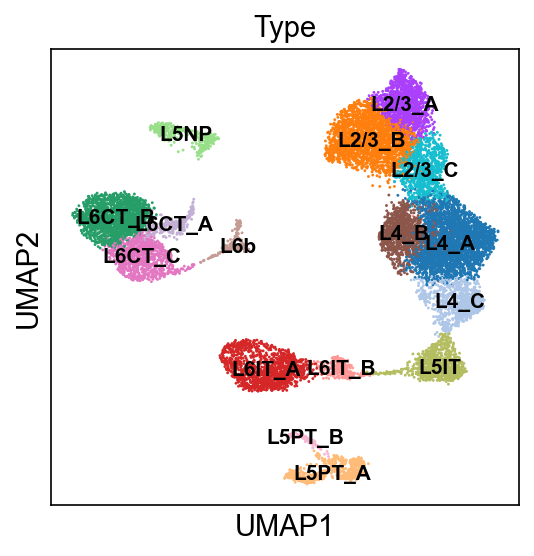

In [41]:
sc.pl.umap(P22_glut,color='Type', legend_loc='on data', legend_fontsize=10)
sc.pl.umap(P21_V1,color='Type', legend_loc='on data', legend_fontsize=10)


No L5PT_G

In [30]:
a

{'L2/3_A': 0,
 'L2/3_B': 1,
 'L2/3_C': 2,
 'L4_A': 3,
 'L4_B': 4,
 'L4_C': 5,
 'L5IT': 6,
 'L5NP_A': 7,
 'L5NP_B': 8,
 'L5NP_C': 9,
 'L5PT_A': 10,
 'L5PT_B': 11,
 'L5PT_C': 12,
 'L5PT_D': 13,
 'L5PT_E': 14,
 'L5PT_F': 15,
 'L5PT_G': 16,
 'L6CT_A': 17,
 'L6CT_B': 18,
 'L6CT_C': 19,
 'L6CT_D': 20,
 'L6CT_E': 21,
 'L6IT_A': 22,
 'L6IT_B': 23,
 'L6IT_C': 24,
 'L6IT_Car3': 25,
 'L6b': 26}

In [31]:
a = make_dict(P22_glut, 'Type')

In [28]:
a.keys()

dict_keys(['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP_A', 'L5NP_B', 'L5NP_C', 'L5PT_A', 'L5PT_B', 'L5PT_C', 'L5PT_D', 'L5PT_E', 'L5PT_F', 'L5PT_G', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6CT_D', 'L6CT_E', 'L6IT_A', 'L6IT_B', 'L6IT_C', 'L6IT_Car3', 'L6b'])

In [27]:
pd.Categorical(test_predlabelsP12vsP22).categories

Float64Index([ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0,
              11.0, 12.0, 13.0, 14.0, 15.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0,
              23.0, 24.0, 25.0, 26.0],
             dtype='float64')

In [32]:
kes = ['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP_A',
       'L5NP_B', 'L5NP_C', 'L5PT_A', 'L5PT_B', 'L5PT_C', 'L5PT_D', 'L5PT_E', 'L5PT_F', 'L6CT_A', 'L6CT_B',
       'L6CT_C', 'L6CT_D', 'L6CT_E', 'L6IT_A', 'L6IT_B', 'L6IT_C', 'L6IT_Car3', 'L6b']
P21_V1.obs['P22 Mapping Prob'] = np.max(test_prediction_P12vsP22, axis=1)
P21_V1.obs['P22 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP22).rename_categories(kes)

In [33]:
P21_V1.shape

(15979, 30869)

In [34]:
P22_glut.obs['Sub'] = P22_glut.obs['Subclass'].cat.rename_categories(['L2/3', 'L4', 'L4/5IT', 'L5NP', 
                                                                      'L5PT', 'L6CT', 'L6IT', 'L6b'])
P21_V1.obs['Sub'] = P21_V1.obs['Subclass'].cat.rename_categories(['L2/3', 'L4', 'L4/5IT', 'L5NP', 
                                                                      'L5PT', 'L6CT', 'L6IT', 'L6b'])

L2/3


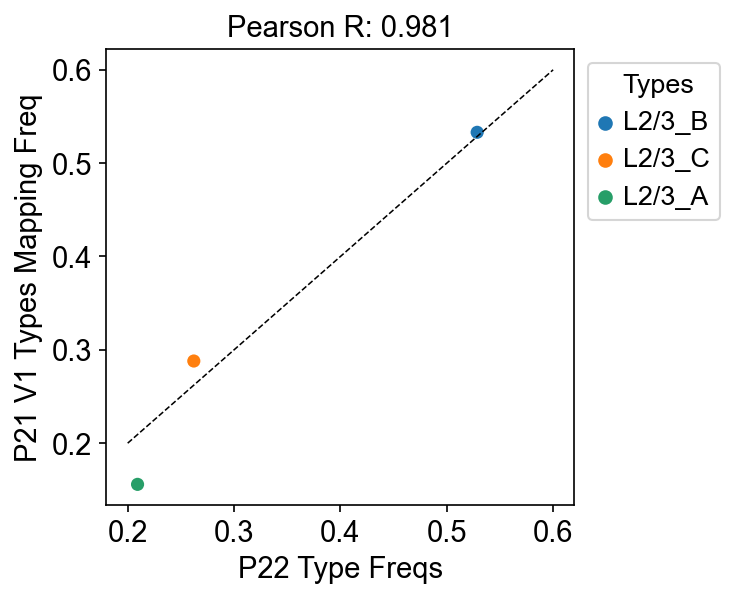

L4


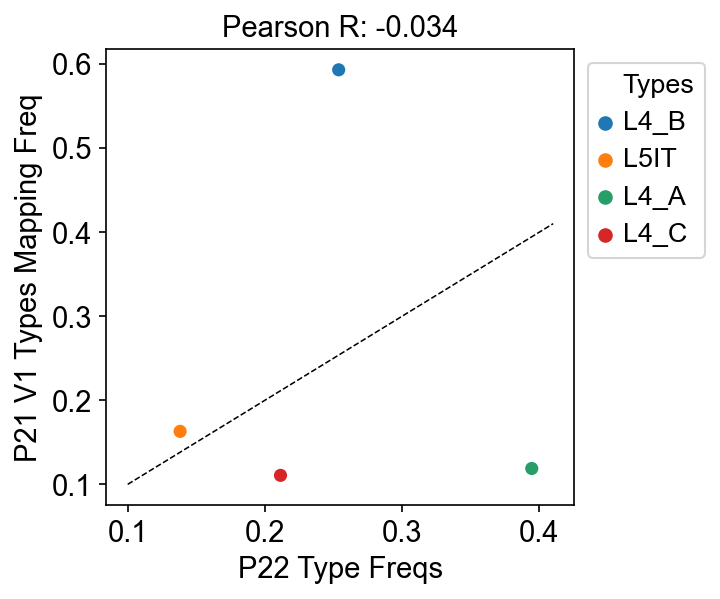

L5


KeyError: "['L5IT'] not in index"

In [38]:
c = 0
lims = [0.6, 0.41, 0.25, 0.35]
low_lims = [0.2, 0.1,0,0]
xes = []
yes = []
for i in ['L2/3', 'L4', 'L5', 'L6']:
    print(i)
    a=P22_glut[P22_glut.obs['Sub'].str.startswith(i),:]
    b=P21_V1[P21_V1.obs['Sub'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P22 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P22 Mapping Label'].value_counts())
    
    if (i=='L4'):
        freq_scatter(x=xx[0:4], y=yy[0:4],
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        oh=xx
        my=yy
        xes.append(xx[0:4])
        yes.append(yy[0:4])
        
    
    else:
        oh=xx
        my=yy
        freq_scatter(x=xx[xx.index.str.startswith(i)],
            y=yy[yy.index.str.startswith(i)],
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        xes.append(xx[xx.index.str.startswith(i)])
        yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.show()
    c = c +1

x and y are different by 1 categories


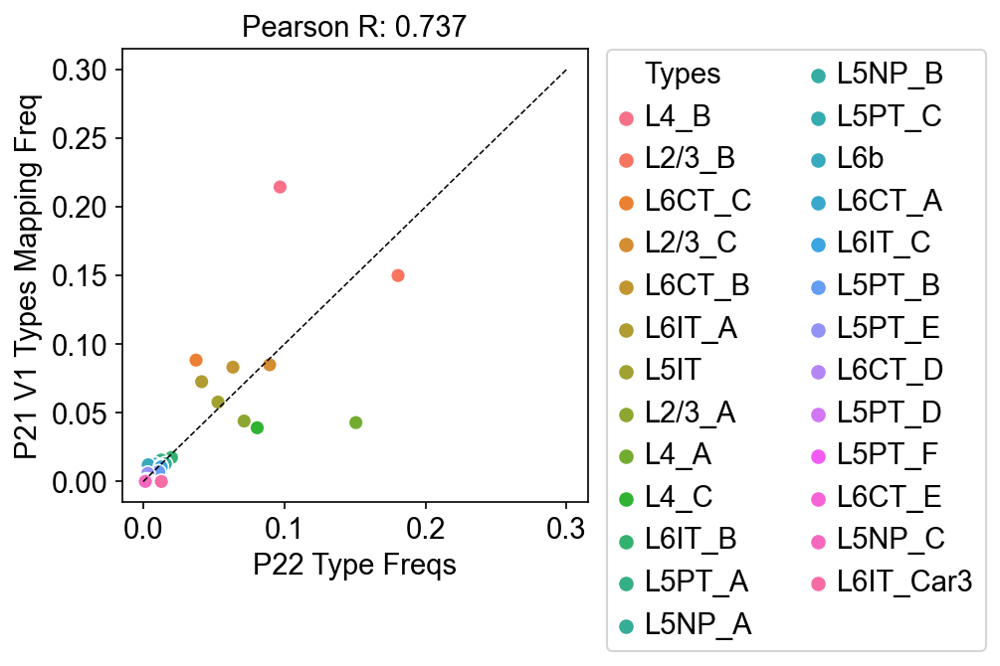

In [37]:
freq_scatter(x=P22_glut.obs['Type'].value_counts(normalize=True),
            y= P21_V1.obs['P22 Mapping Label'].value_counts(normalize=True),
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.3, )

## 2023 multi-ome data

### Gluta

In [4]:
P21_V1 = rem_fem(sc.read_h5ad('P21full_glut_v3.h5ad'))
P21_V1 = P21_V1[P21_V1.obs['Study']!='2022 RNA',:].copy()
P21_V1.obs['Type'] = P21_V1.obs['Type_nn_dists']
P21_V1.X = P21_V1.raw.X

In [5]:
P22_glut = sc.read_h5ad('h5ads/P22Sham_glut_v3.h5ad')
P22_glut.X = P22_glut.raw.X

**The change below to plot_conf_matx() fixes the indeing issue.**

In [6]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


1146 shared HVGs
trainclassifier() complete after 857.0 seconds


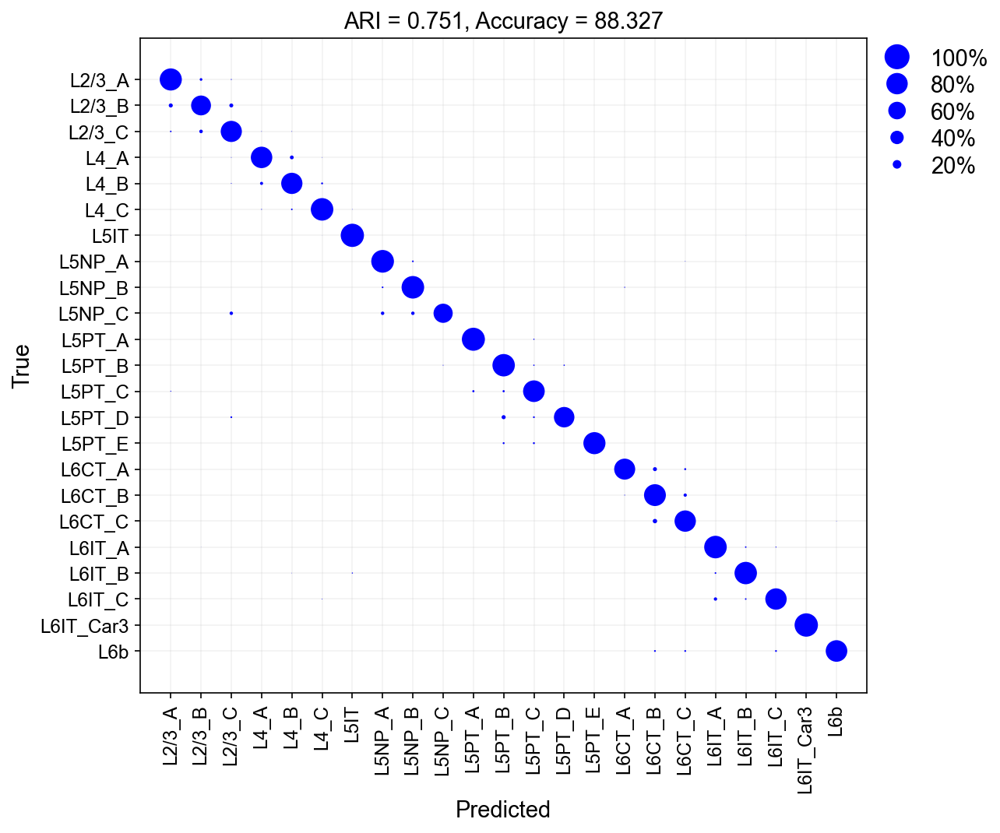

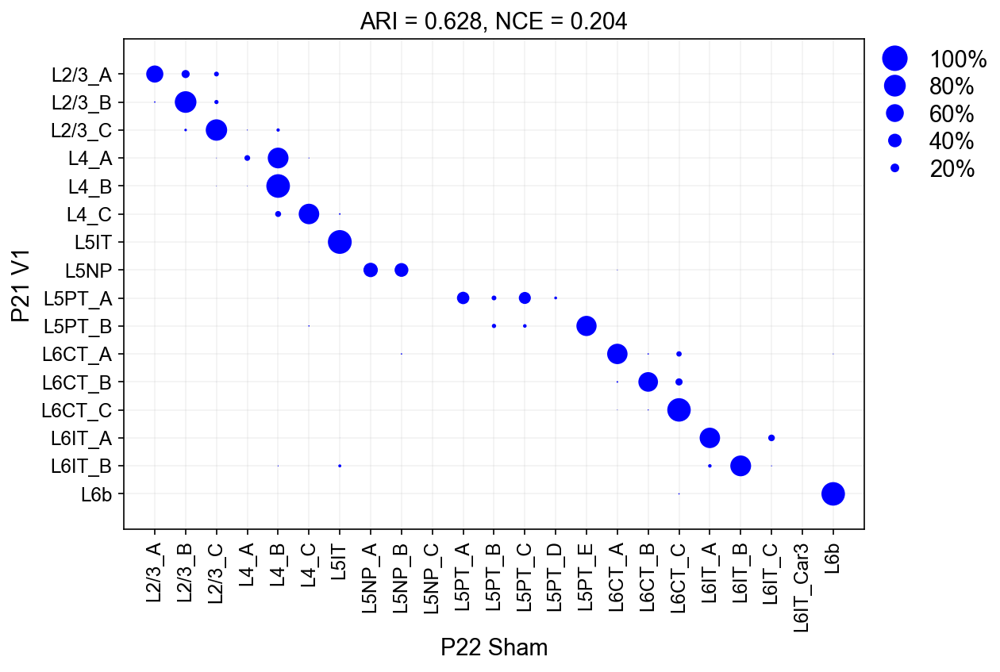

In [7]:
test_items, mapping_items = pairwise_map(adata_t0=P21_V1, adata_t1=P22_glut,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=True, union_hvgs=False,
                                         t0_dict=make_dict(P21_V1, 'Type'),
                                         t1_dict=make_dict(P22_glut, 'Type'),
                                        min_cells=100, x_lab='P22 Sham', y_lab='P21 V1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items

In [8]:
a = make_dict(P22_glut, 'Type')

In [9]:
a.keys()

dict_keys(['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP_A', 'L5NP_B', 'L5NP_C', 'L5PT_A', 'L5PT_B', 'L5PT_C', 'L5PT_D', 'L5PT_E', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6IT_C', 'L6IT_Car3', 'L6b'])

In [10]:
pd.Categorical(test_predlabelsP12vsP22).categories

Float64Index([ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0, 10.0, 11.0,
              12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0,
              22.0],
             dtype='float64')

No  'L5NP_C' 

In [11]:
kes = ['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP_A',
       'L5NP_B', 'L5PT_A', 'L5PT_B', 'L5PT_C', 'L5PT_D', 'L5PT_E', 'L6CT_A', 
       'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6IT_C', 'L6IT_Car3', 'L6b']
P21_V1.obs['P22 Mapping Prob'] = np.max(test_prediction_P12vsP22, axis=1)
P21_V1.obs['P22 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP22).rename_categories(kes)

x and y are different by 1 categories


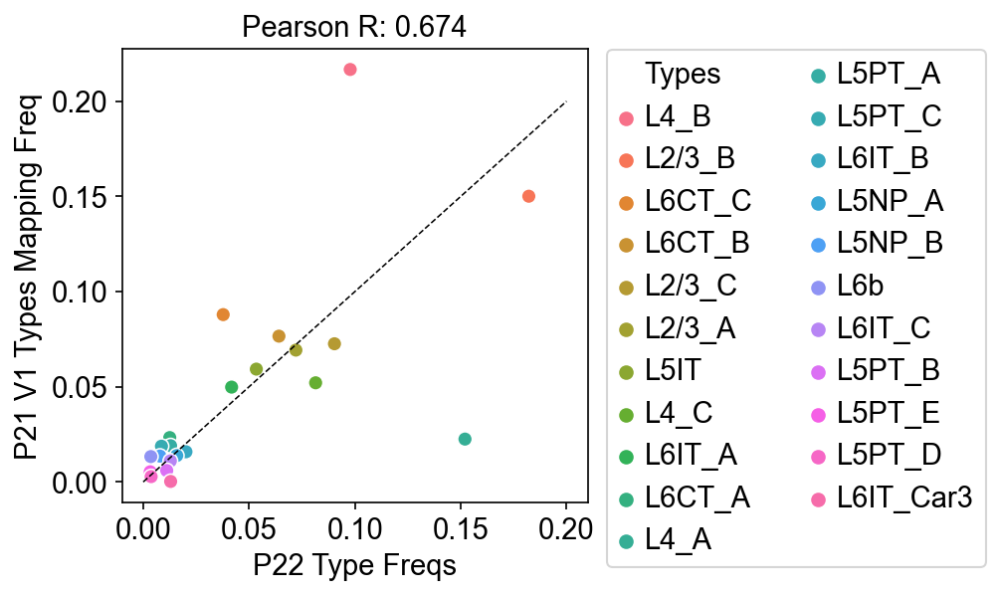

In [36]:
freq_scatter(x=P22_glut.obs['Type'].value_counts(normalize=True),
            y= P21_V1.obs['P22 Mapping Label'].value_counts(normalize=True),
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.2, )
plt.savefig('figures/V1vsS1_gluta_freqs.pdf', bbox_inches='tight')

L2/3


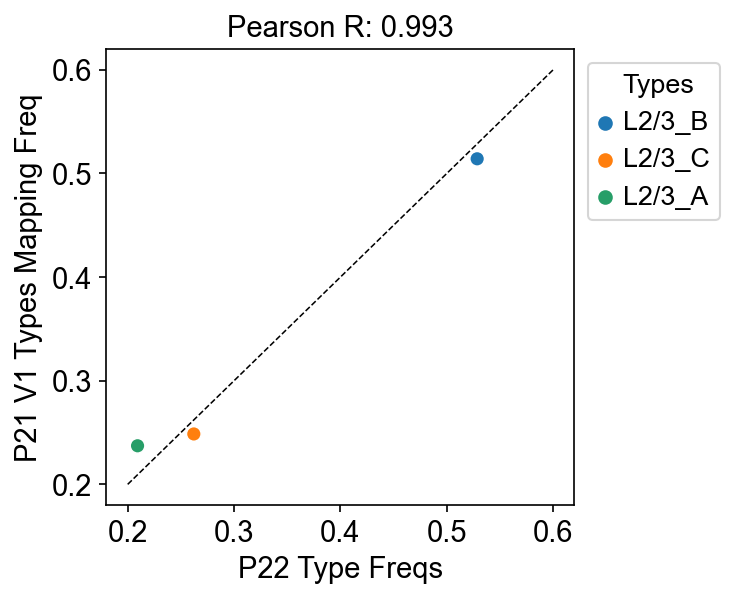

L4


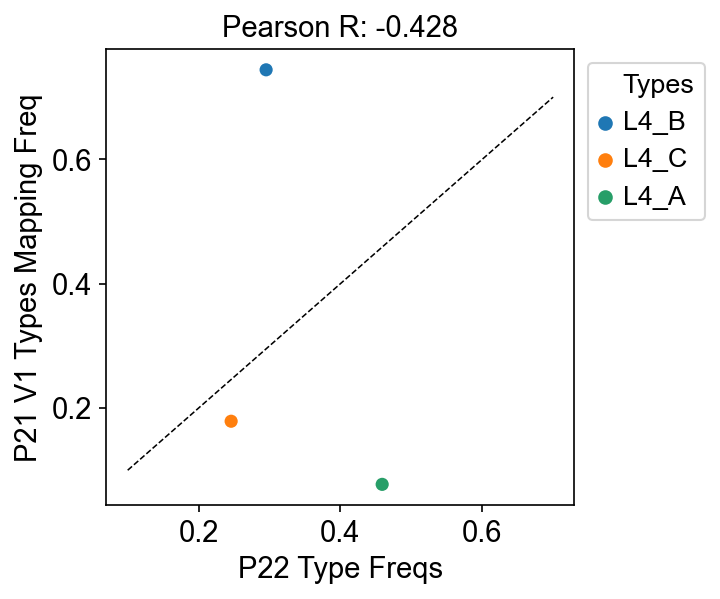

L5
x and y are different by 1 categories


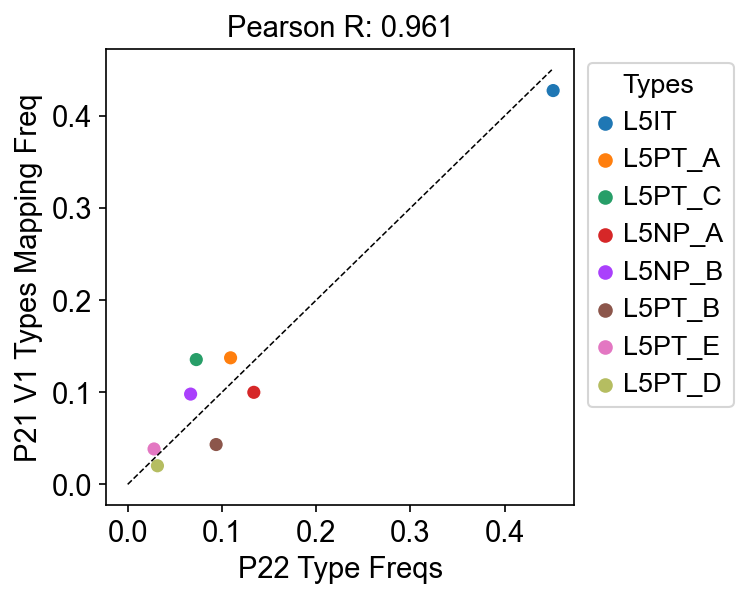

L6


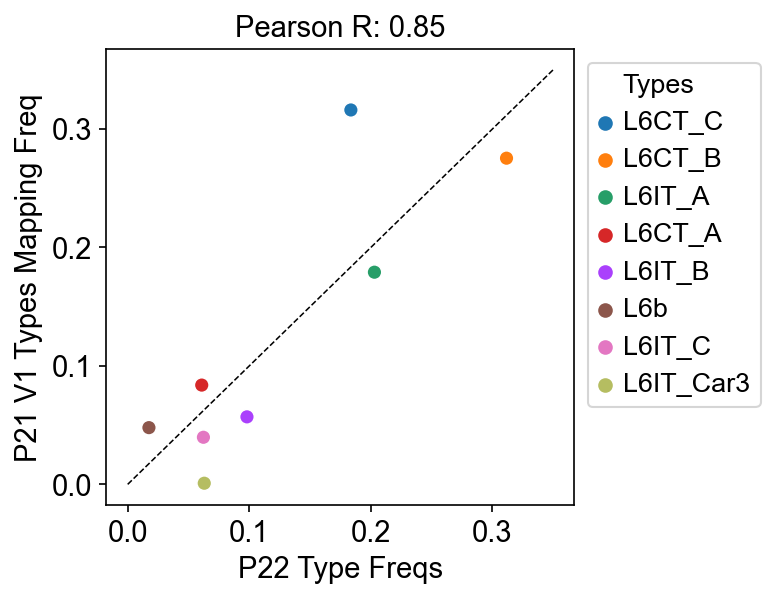

In [52]:
c = 0
lims = [0.6, 0.7, 0.45, 0.35]
low_lims = [0.2, 0.1,0,0]
xes = []
yes = []
for i in ['L2/3', 'L4', 'L5', 'L6']:
    print(i)
    a=P22_glut[P22_glut.obs['Type'].str.startswith(i),:]
    b=P21_V1[P21_V1.obs['P22 Mapping Label'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P22 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P22 Mapping Label'].value_counts())

    oh=xx
    my=yy
    freq_scatter(x=xx[xx.index.str.startswith(i)],
        y=yy[yy.index.str.startswith(i)],
        x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
             low_lim=low_lims[c])
    xes.append(xx[xx.index.str.startswith(i)])
    yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.savefig('figures/V1vsS1_'+i[0:2]+'_freqs.pdf', bbox_inches='tight')
    plt.show()
    c = c +1

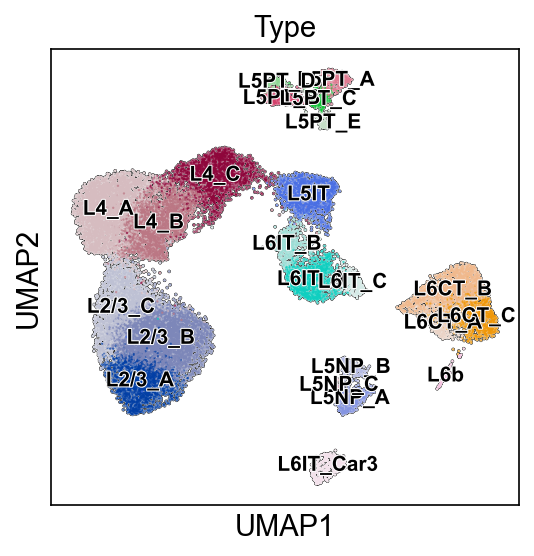

In [49]:
sc.pl.umap(P22_glut, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=5 , legend_fontoutline=1, legend_fontweight='semibold')

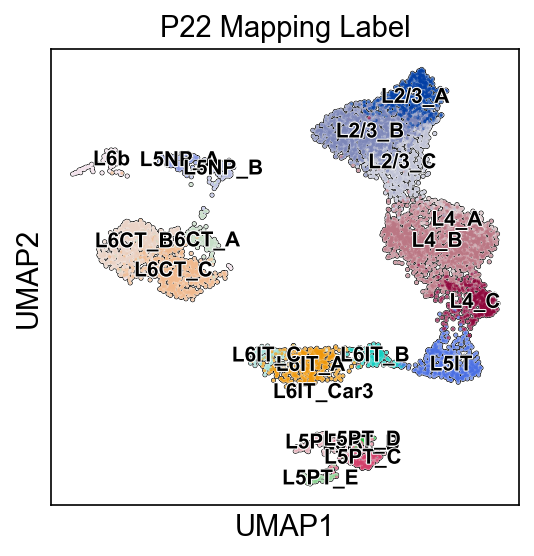

In [51]:
sc.pl.umap(P21_V1, color=['P22 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=10 , legend_fontoutline=1, legend_fontweight='semibold')

**L4 result is spurious and driven by lack of sufficient L4_A markers in HVGs. Will sub-by-sub mapping fix this? It didn't. Need to feed into classifier the markers for every type**

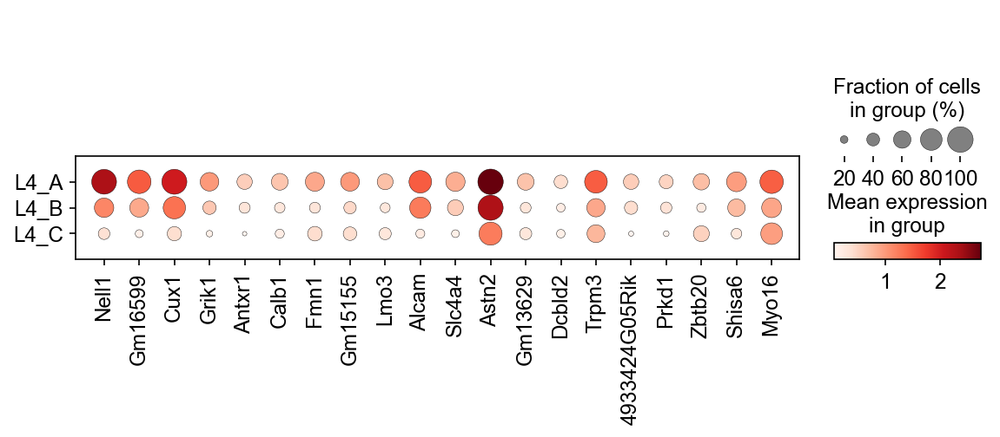

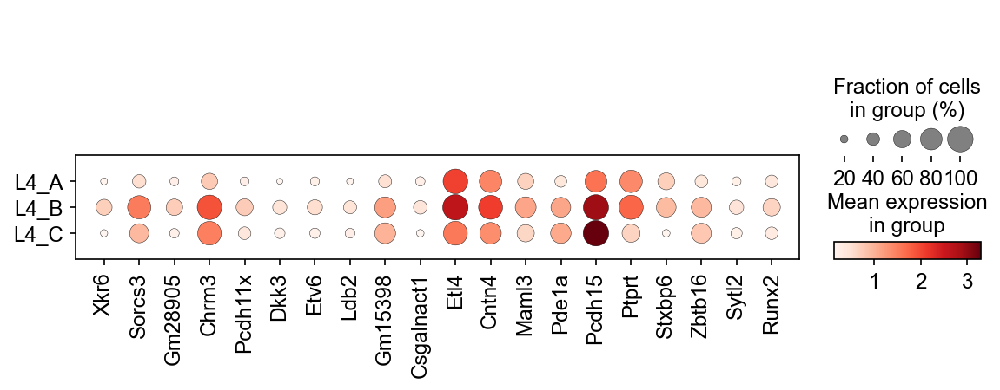

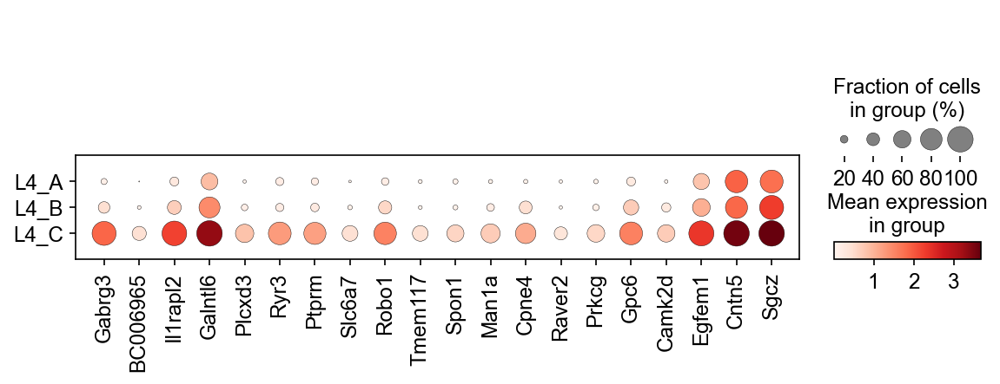

In [58]:
L4_marks = []
L4 = P22_glut[P22_glut.obs['Type'].str.startswith('L4'),:].copy()
L4 = L4[L4.obs['Sample']!='S3',:]
for i in L4.obs['Type'].values.categories:
    L4_marks.append(DE(L4,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=1))

for i in L4_marks:
    sc.pl.dotplot(L4, var_names=i.index[0:20], groupby='Type')

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level


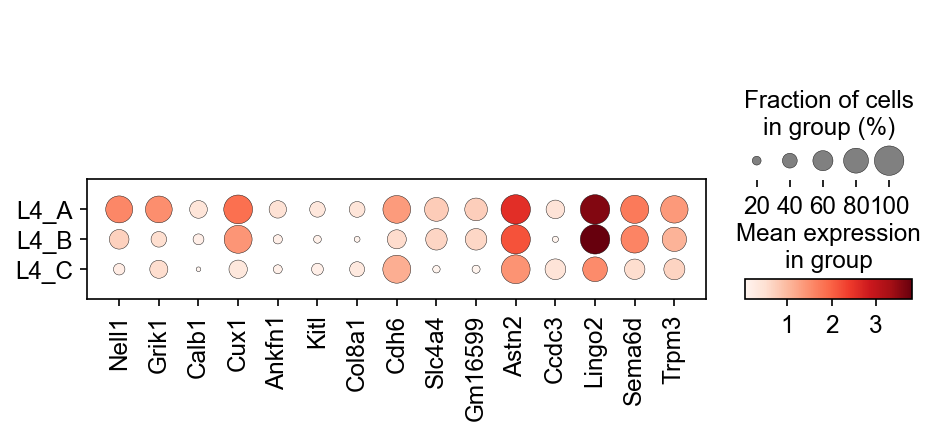

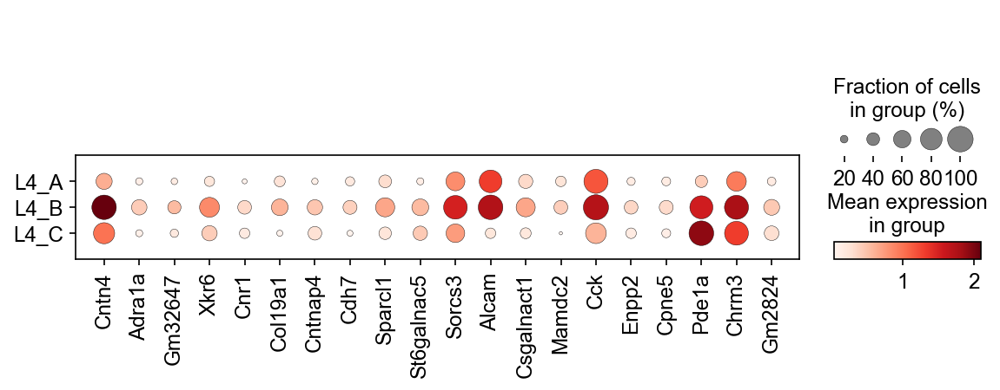

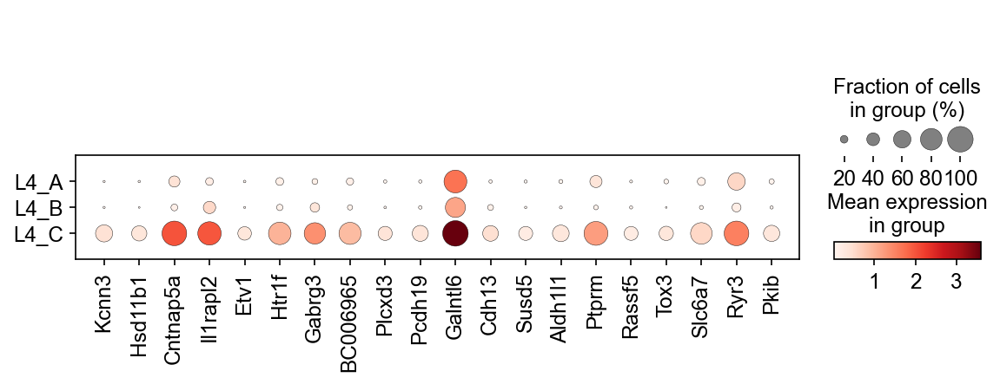

In [60]:
L4v_marks = []
L4v = P21_V1[P21_V1.obs['Type'].str.startswith('L4'),:].copy()
for i in L4v.obs['Type'].values.categories:
    L4v_marks.append(DE(L4v,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=1))

for i in L4v_marks:
    sc.pl.dotplot(L4v, var_names=i.index[0:20], groupby='Type')

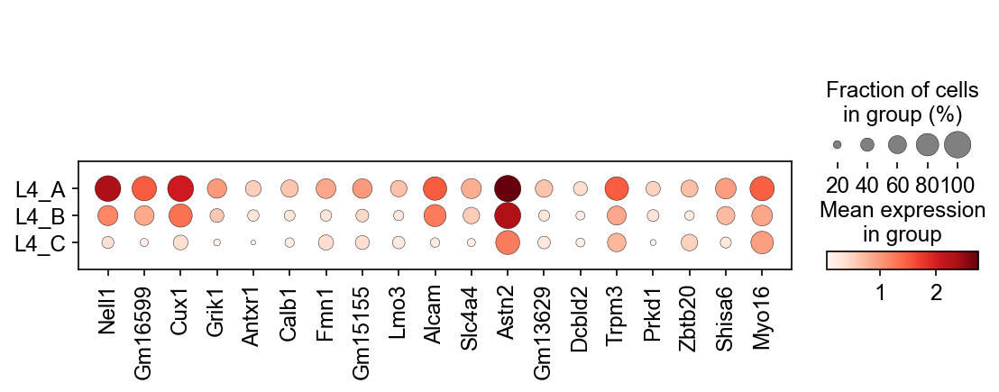

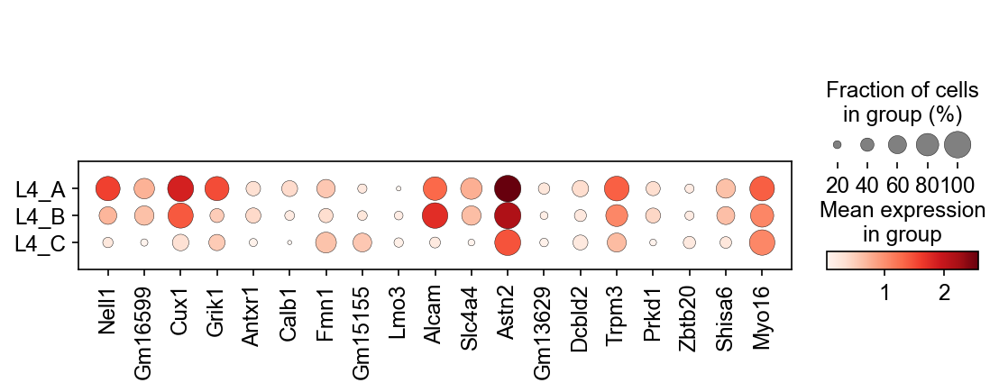

In [70]:
a = list(L4_marks[0].index[0:20])
a.remove('4933424G05Rik')
sc.pl.dotplot(L4, var_names=a, groupby='Type')
sc.pl.dotplot(L4v, var_names=a, groupby='Type')

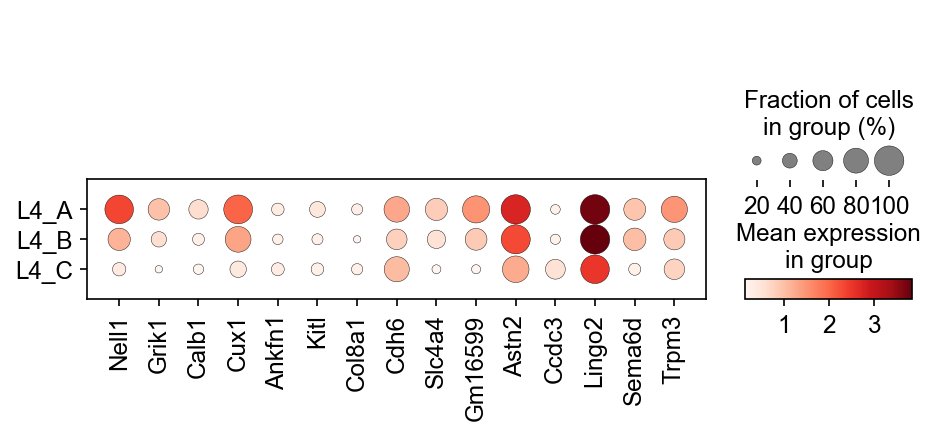

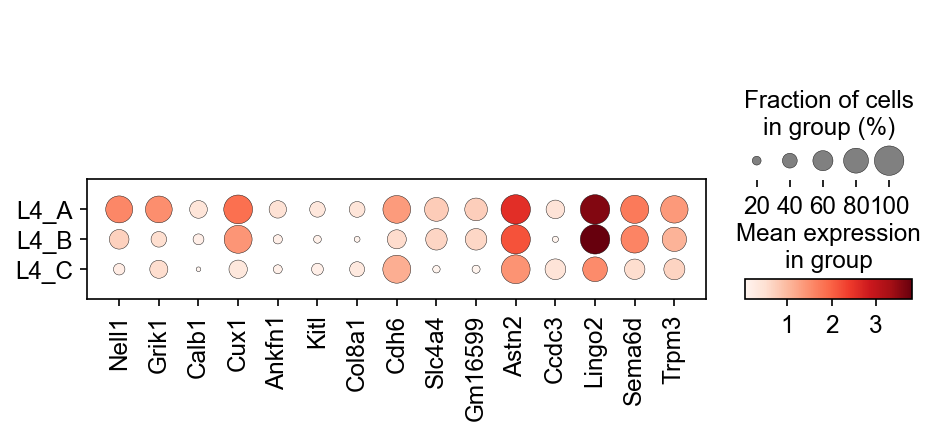

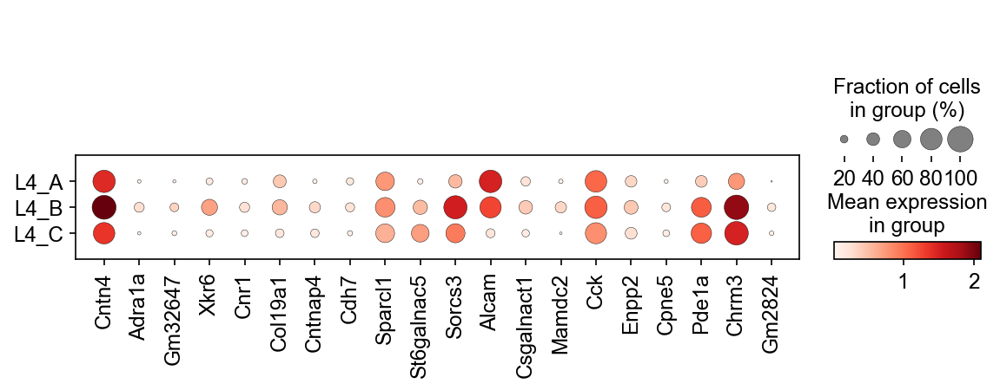

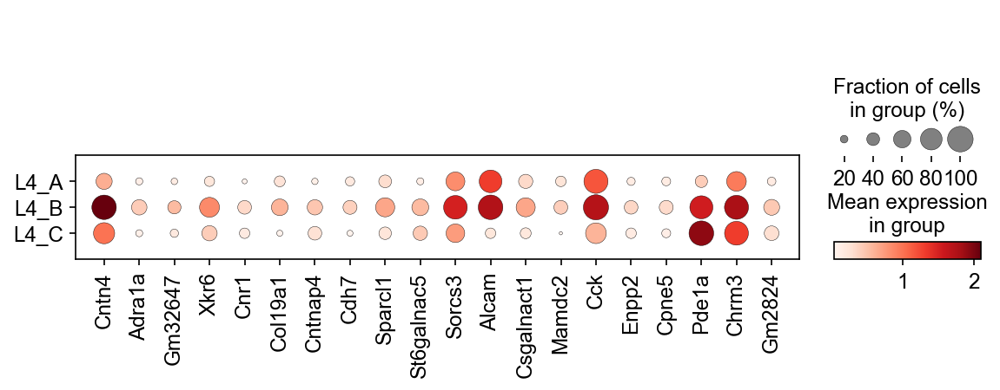

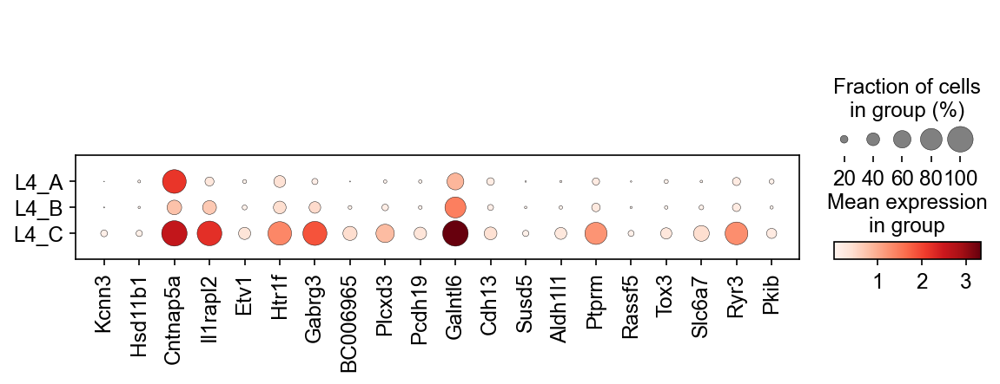

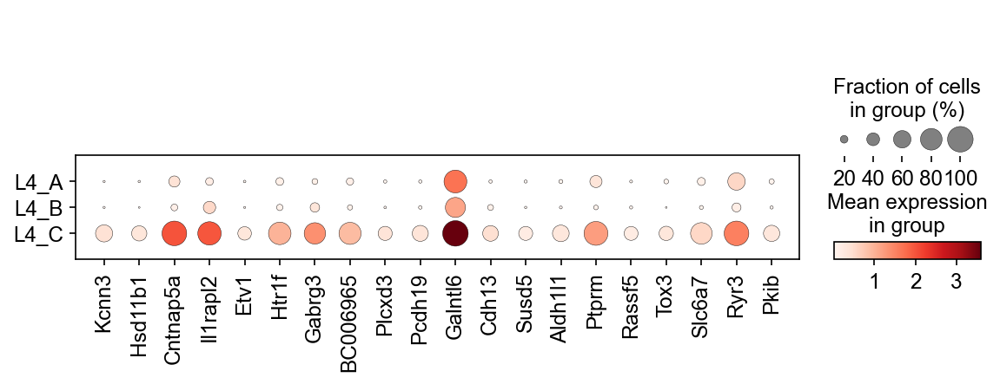

In [71]:
sc.pl.dotplot(L4, var_names=L4v_marks[0].index[0:20], groupby='Type')
sc.pl.dotplot(L4v, var_names=L4v_marks[0].index[0:20], groupby='Type')

sc.pl.dotplot(L4, var_names=L4v_marks[1].index[0:20], groupby='Type')
sc.pl.dotplot(L4v, var_names=L4v_marks[1].index[0:20], groupby='Type')

sc.pl.dotplot(L4, var_names=L4v_marks[2].index[0:20], groupby='Type')
sc.pl.dotplot(L4v, var_names=L4v_marks[2].index[0:20], groupby='Type')

### Gluta sub-by-sub

In [54]:
P21_V1_subs = [P21_V1[P21_V1.obs['Type'].str.startswith('L2/3'),:],
            P21_V1[P21_V1.obs['Type'].str.startswith('L4'),:],
            P21_V1[P21_V1.obs['Type'].str.startswith('L5'),:],
            P21_V1[P21_V1.obs['Type'].str.startswith('L6'),:]]

In [55]:
P22_subs = [P22_glut[P22_glut.obs['Type'].str.startswith('L2/3'),:],
            P22_glut[P22_glut.obs['Type'].str.startswith('L4'),:],
            P22_glut[P22_glut.obs['Type'].str.startswith('L5'),:],
            P22_glut[P22_glut.obs['Type'].str.startswith('L6'),:]]

1121 shared HVGs
trainclassifier() complete after 49.0 seconds


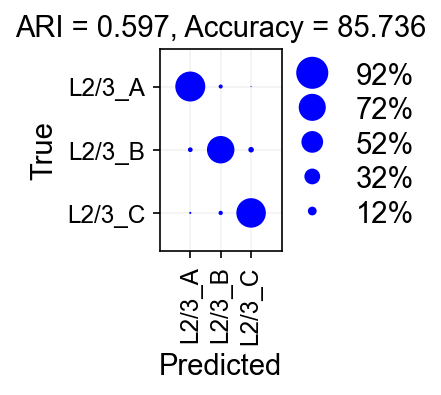

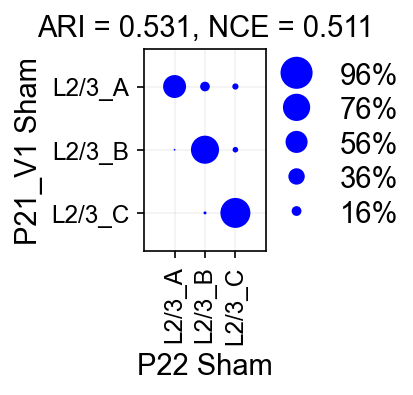

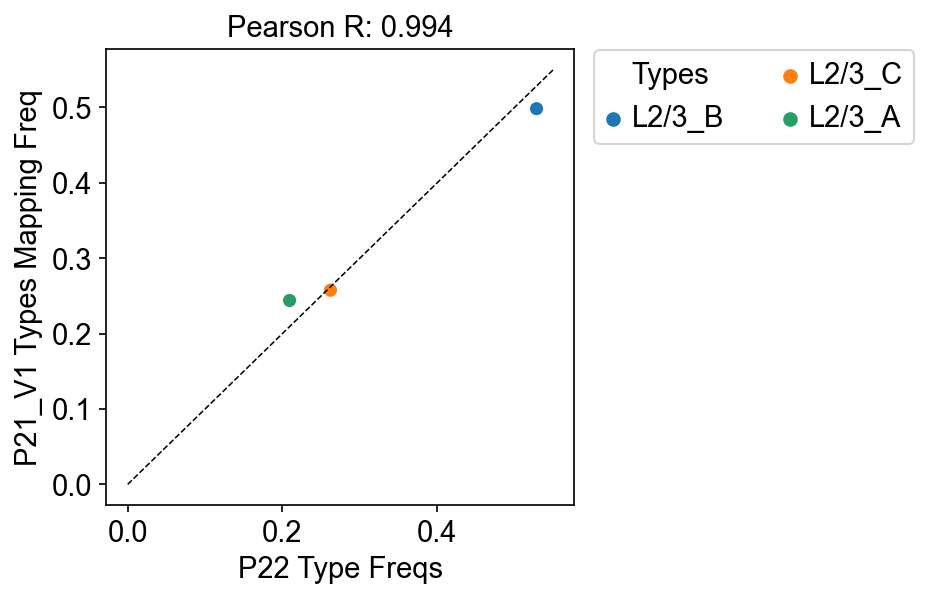

1080 shared HVGs
trainclassifier() complete after 49.0 seconds


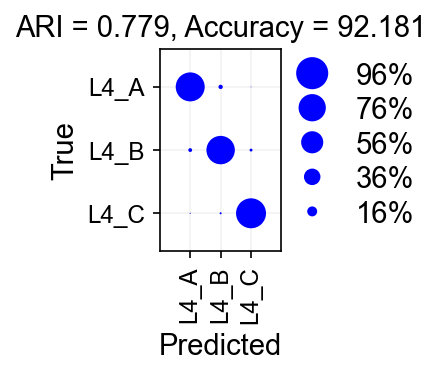

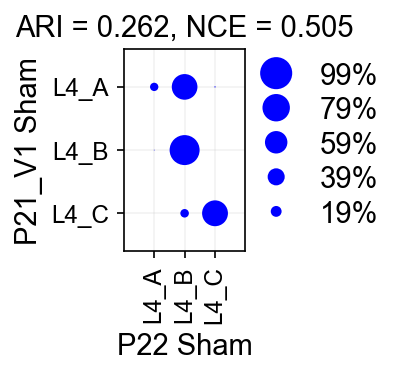

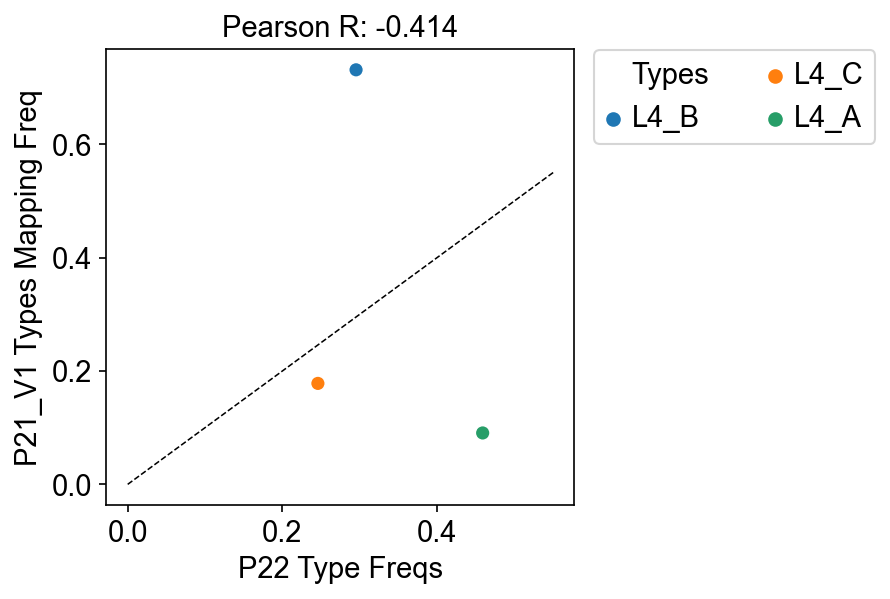

1421 shared HVGs
trainclassifier() complete after 29.0 seconds


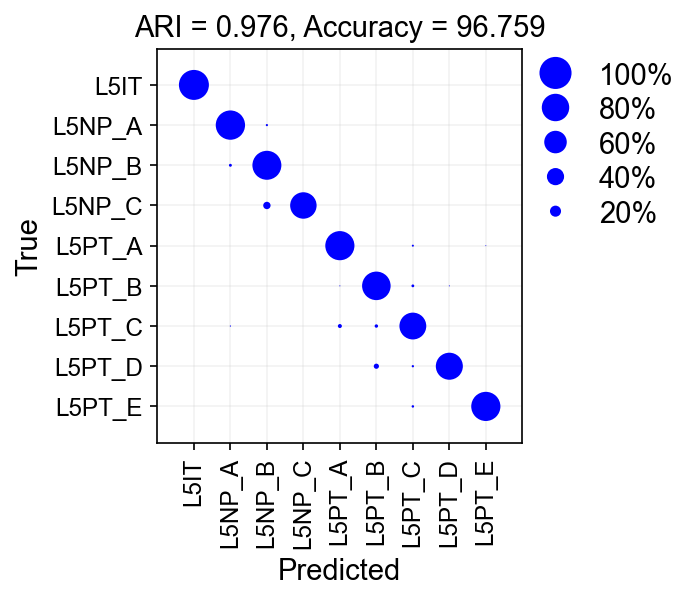

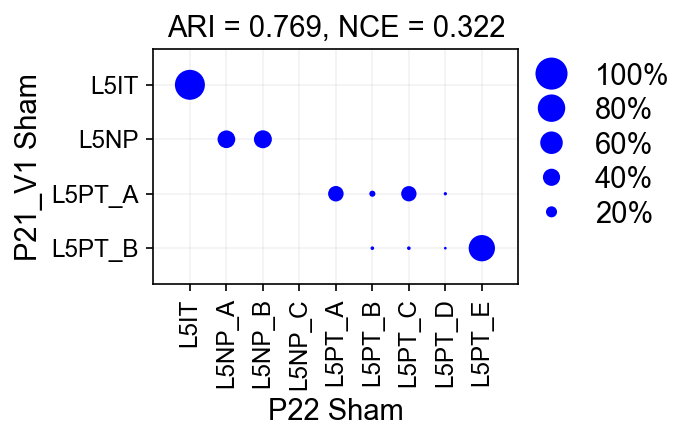

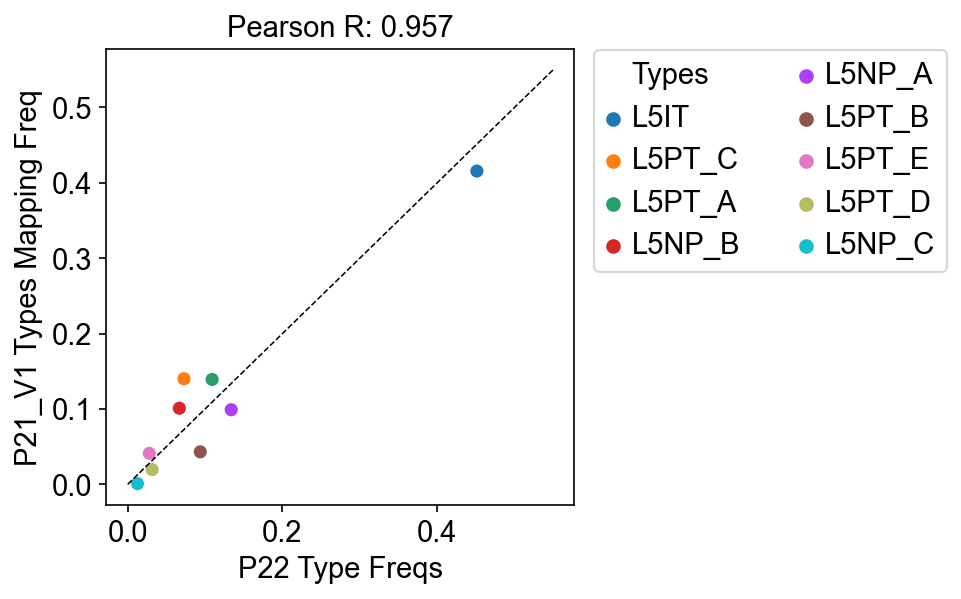

1192 shared HVGs
trainclassifier() complete after 58.0 seconds


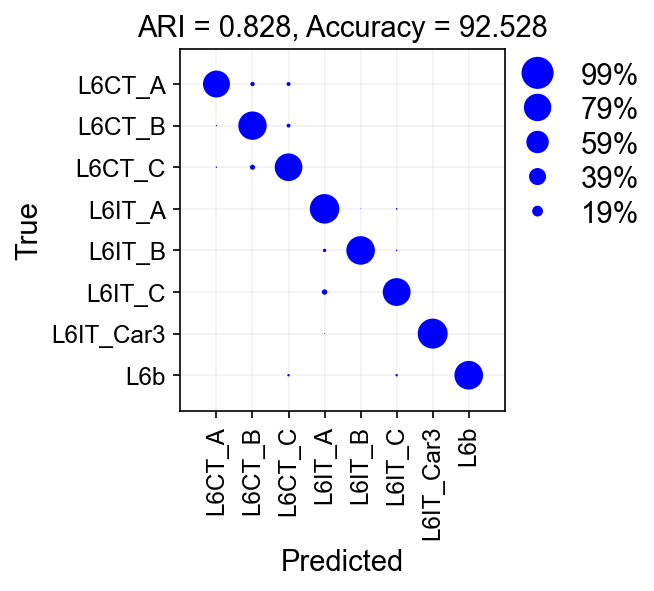

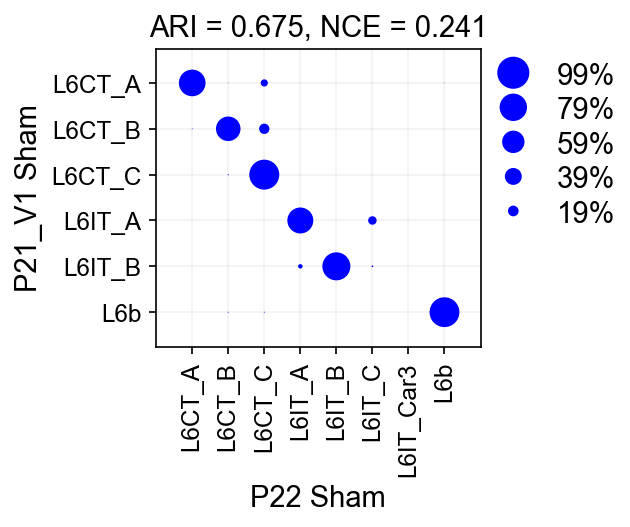

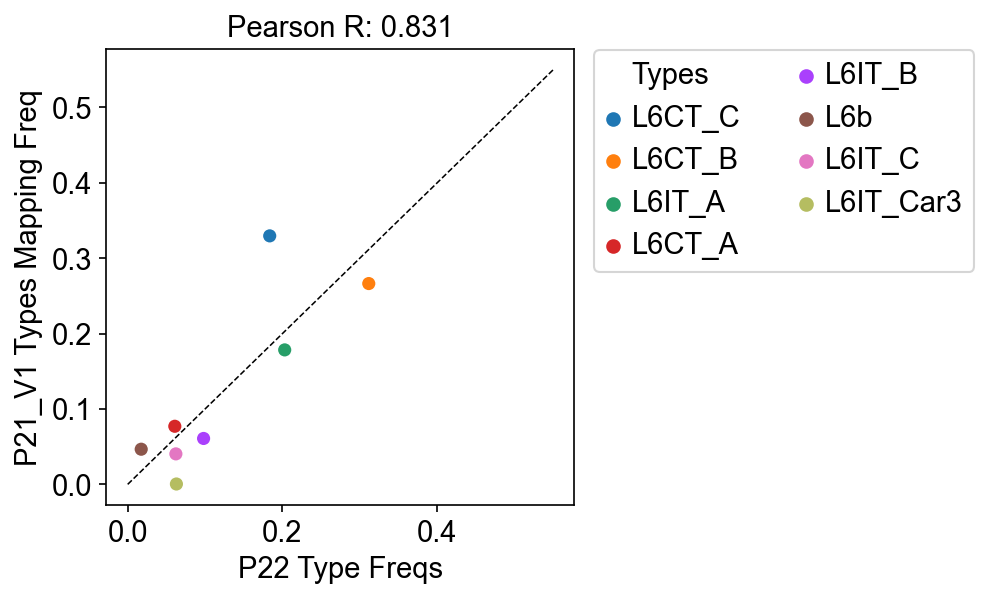

In [56]:
P21_V1_subs_mapped = []
for sub_index in range(len(P22_subs)):
    test_items, mapping_items = pairwise_map(adata_t0=P21_V1_subs[sub_index], adata_t1=P22_subs[sub_index],test_lab='Type',
                                                                                train_lab='Type', 
                                                                              recomp_HVGs=True, union_hvgs=False,
                                             t0_dict=make_dict(P21_V1_subs[sub_index], 'Type'),
                                             t1_dict=make_dict(P22_subs[sub_index], 'Type'),
                                            min_cells=100, x_lab='P22 Sham', y_lab='P21_V1 Sham')

    test_labelsP21_V1vsP22, test_predlabelsP21_V1vsP22, test_prediction_P21_V1vsP22 = test_items
    mappingconfmatP21_V1vsP22, mappingxticksP21_V1vsP22, mappingplotP21_V1vsP22 = mapping_items
    plt.show()
    num_cats_mapped = len(pd.Categorical(test_predlabelsP21_V1vsP22).value_counts())

    P21_V1_LX = P21_V1_subs[sub_index].copy()
    
    
    a = make_dict(P22_subs[sub_index], 'Type')
    
    
    P21_V1_LX.obs['P22 Mapping Prob'] = np.max(test_prediction_P21_V1vsP22, axis=1)
    
    if (num_cats_mapped>len(a)):
        P21_V1_LX.obs['P22 Mapping Label'] = pd.Categorical(test_predlabelsP21_V1vsP22).rename_categories(list(a.keys())+['Unassigned'])
    else:
        P21_V1_LX.obs['P22 Mapping Label'] = pd.Categorical(test_predlabelsP21_V1vsP22).rename_categories(list(a.keys()))

    P21_V1_LX = P21_V1_LX[P21_V1_LX.obs['P22 Mapping Label']!='Unassigned'].copy()
    P21_V1_subs_mapped.append(P21_V1_LX)
    freq_scatter(x=P22_subs[sub_index].obs['Type'].value_counts(True),
                y= P21_V1_LX.obs['P22 Mapping Label'].value_counts(True),
                x_lab='P22 Type Freqs', y_lab='P21_V1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.55, )
    plt.show()

In [57]:
P22_ctrl = P22_subs[0].concatenate(P22_subs[1:])

In [58]:
P21_V1  = P21_V1_subs_mapped[0].concatenate(P21_V1_subs_mapped[1:])

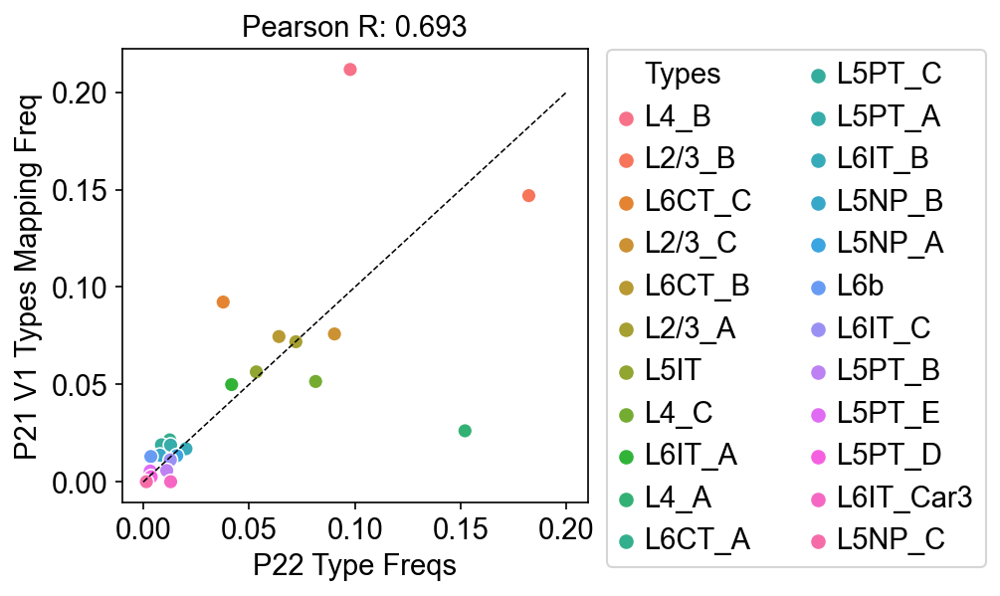

In [59]:
plt.figure()
freq_scatter(x=P22_ctrl.obs['Type'].value_counts(True),
                y= P21_V1.obs['P22 Mapping Label'].value_counts(True),
                x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.2, )

### Gluta Input markers

In [60]:
all_marks_glut = []
for L in ['L2/3', 'L4', 'L5', 'L6']:
    LX_marks = []
    LX = P22_glut[P22_glut.obs['Type'].str.startswith(L),:].copy()
    LX = LX[LX.obs['Sample']!='S3',:]
    for i in LX.obs['Type'].values.categories:
        LX_marks = LX_marks + list(DE(LX,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=0.6).index)
    all_marks_glut = all_marks_glut + LX_marks  

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
260 615
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
431 503
461 523
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
447 468


In [66]:
len(set(all_marks_glut)), len(set(P21_V1.var_names).intersection(set(all_marks_glut)))

(2668, 2600)

In [67]:
all_marks_glut_shared = list(set(P21_V1.var_names).intersection(set(all_marks_glut)))

In [68]:
P22_glut.X, P21_V1.X

(<28090x21258 sparse matrix of type '<class 'numpy.float32'>'
 	with 75994772 stored elements in Compressed Sparse Row format>,
 <7508x20124 sparse matrix of type '<class 'numpy.float32'>'
 	with 31362099 stored elements in Compressed Sparse Row format>)

In [73]:
bool_S1 = []
for i in P22_glut.var_names:
    if (i in all_marks_glut_shared):
        bool_S1.append(True)
    else:
        bool_S1.append(False)

bool_V1 = []
for i in P21_V1.var_names:
    if (i in all_marks_glut_shared):
        bool_V1.append(True)
    else:
        bool_V1.append(False)

In [78]:
P21_V1 = rem_fem(sc.read_h5ad('P21full_glut_v3.h5ad'))
P21_V1 = P21_V1[P21_V1.obs['Study']!='2022 RNA',:].copy()
P21_V1.obs['Type'] = P21_V1.obs['Type_nn_dists']
P21_V1.X = P21_V1.raw.X

P22_glut = sc.read_h5ad('h5ads/P22Sham_glut_v3.h5ad')
P22_glut.X = P22_glut.raw.X


In [79]:
P22_glut.var['highly_variable'] = bool_S1
P21_V1.var['highly_variable'] = bool_V1

In [80]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


2600 shared HVGs
trainclassifier() complete after 2597.0 seconds


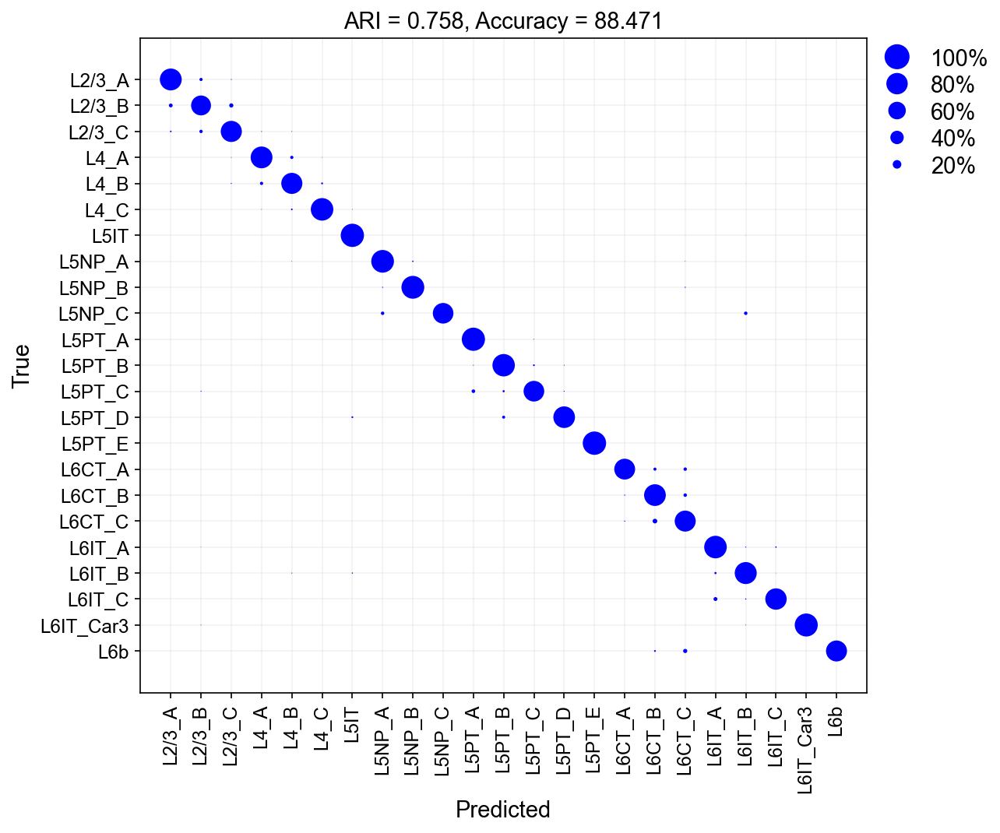

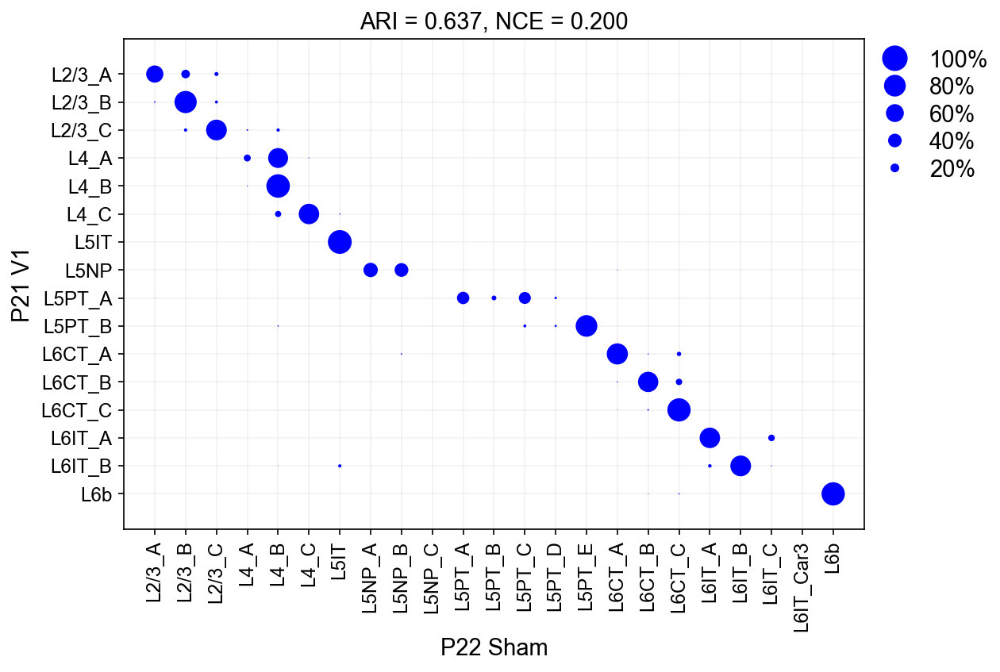

In [81]:
test_items, mapping_items = pairwise_map(adata_t0=P21_V1, adata_t1=P22_glut,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=False, union_hvgs=False,
                                         t0_dict=make_dict(P21_V1, 'Type'),
                                         t1_dict=make_dict(P22_glut, 'Type'),
                                        min_cells=100, x_lab='P22 Sham', y_lab='P21 V1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items

**HERE maybe instead train on V1 and map S1 to it???**

### Gluta S1 to V1 input markers

In [32]:
P21_V1 = rem_fem(sc.read_h5ad('P21full_glut_v3.h5ad'))
P21_V1 = P21_V1[P21_V1.obs['Study']!='2022 RNA',:].copy()
P21_V1.obs['Type'] = P21_V1.obs['Type_nn_dists']
P21_V1.X = P21_V1.raw.X

In [33]:
P22_glut = sc.read_h5ad('h5ads/P22Sham_glut_v3.h5ad')
P22_glut.X = P22_glut.raw.X

In [34]:
all_marks_glut = []
for L in ['L2/3', 'L4', 'L5', 'L6']:
    LX_marks = []
    LX = P22_glut[P22_glut.obs['Type'].str.startswith(L),:].copy()
    LX = LX[LX.obs['Sample']!='S3',:]
    for i in LX.obs['Type'].values.categories:
        LX_marks = LX_marks + list(DE(LX,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=0.6).index)
    all_marks_glut = all_marks_glut + LX_marks  

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
260 615
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
431 503
461 523
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
447 468


In [35]:
len(set(all_marks_glut)), len(set(P21_V1.var_names).intersection(set(all_marks_glut)))

(2668, 2600)

In [36]:
all_marks_glut_shared = list(set(P21_V1.var_names).intersection(set(all_marks_glut)))

In [37]:
len(all_marks_glut_shared)

2600

In [38]:
bool_S1 = []
for i in P22_glut.var_names:
    if (i in all_marks_glut_shared):
        bool_S1.append(True)
    else:
        bool_S1.append(False)

bool_V1 = []
for i in P21_V1.var_names:
    if (i in all_marks_glut_shared):
        bool_V1.append(True)
    else:
        bool_V1.append(False)

P22_glut.var['highly_variable'] = bool_S1
P21_V1.var['highly_variable'] = bool_V1

**The change below to plot_conf_matx() fixes the indeing issue.**

In [39]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


2600 shared HVGs
trainclassifier() complete after 770.0 seconds


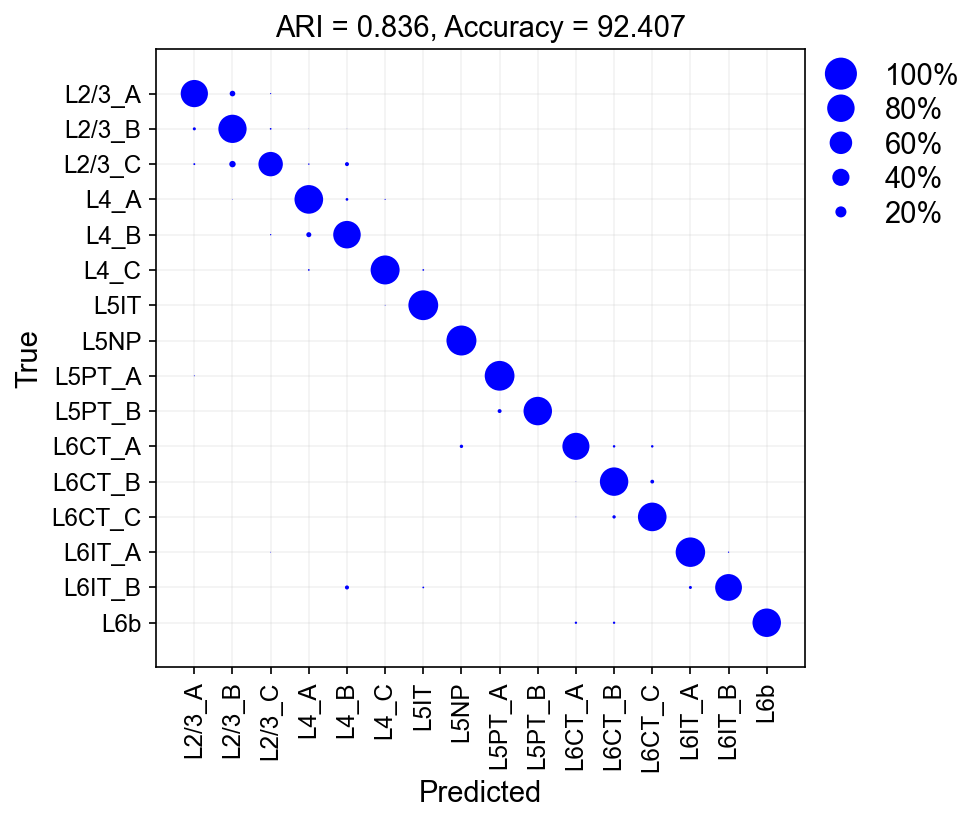

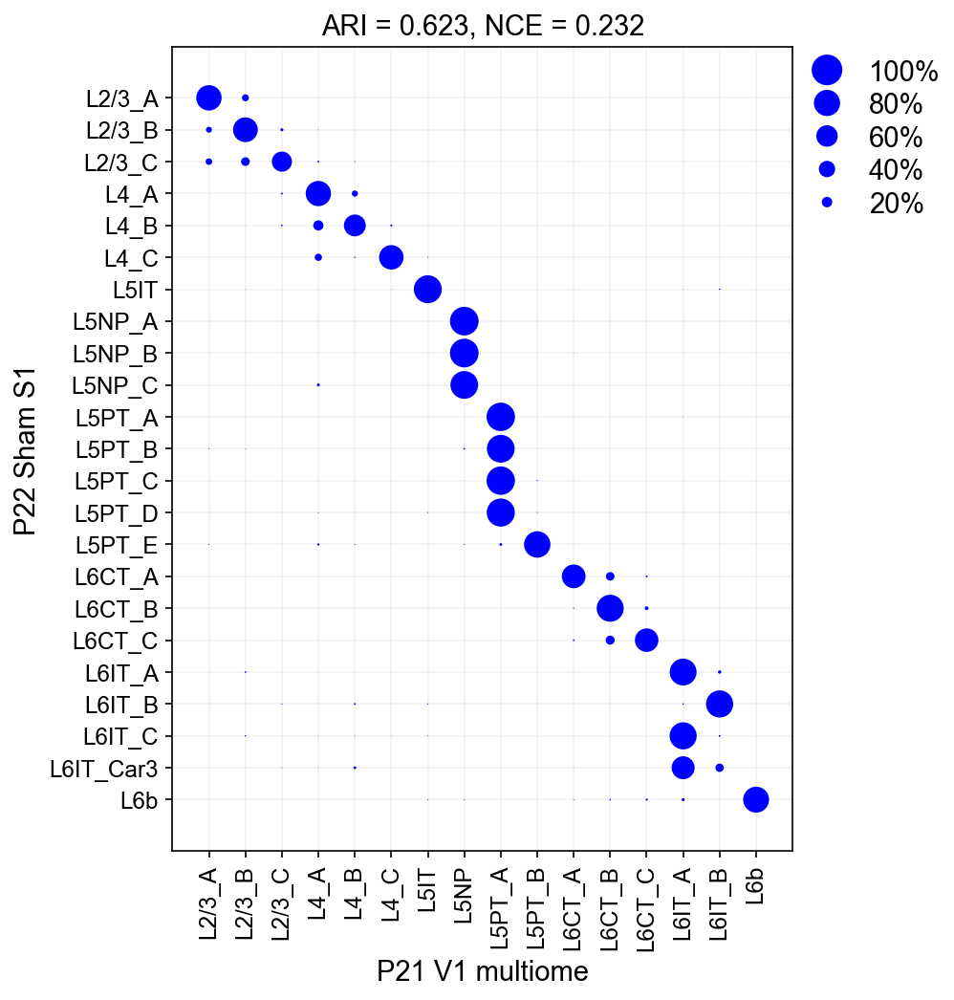

In [40]:
test_items, mapping_items = pairwise_map(adata_t0=P22_glut, adata_t1=P21_V1,test_lab='Type',
                                                    train_lab='Type',  recomp_HVGs=False, union_hvgs=False,
                                         t0_dict=make_dict(P22_glut, 'Type'),
                                         t1_dict=make_dict(P21_V1, 'Type'),
                                        min_cells=100, x_lab='P21 V1 multiome', y_lab='P22 Sham S1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items

In [41]:
a = make_dict(P21_V1, 'Type')


P22_glut.obs['P21 V1 Mapping Prob'] = np.max(test_prediction_P12vsP22, axis=1)
P22_glut.obs['P21 V1 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP22).rename_categories(list(a.keys()))

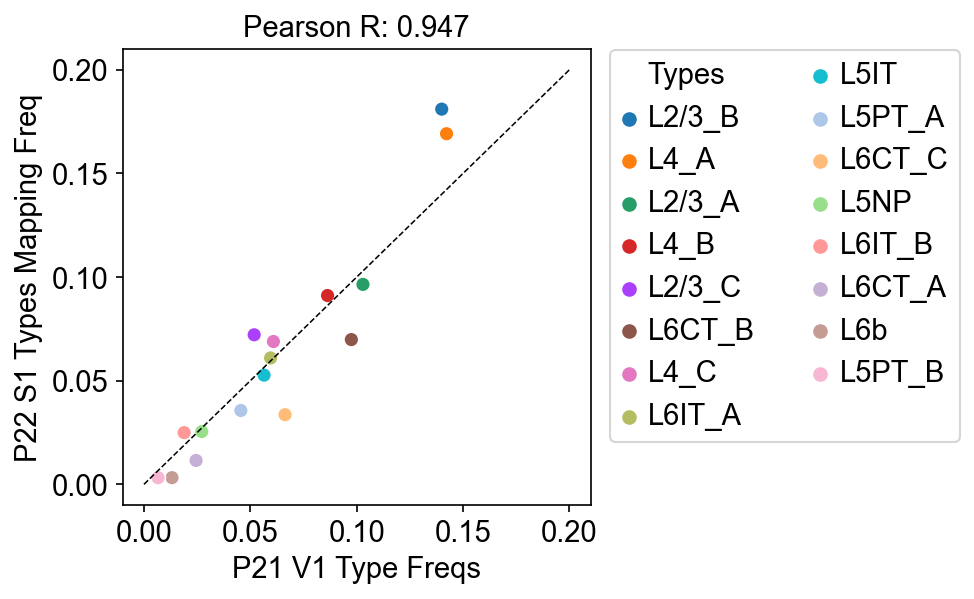

In [42]:
freq_scatter(x=P21_V1.obs['Type'].value_counts(normalize=True),
            y= P22_glut.obs['P21 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P21 V1 Type Freqs', y_lab='P22 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.2, )
plt.savefig('figures/V1vsS1_gluta_freqs.pdf', bbox_inches='tight')

L2/3


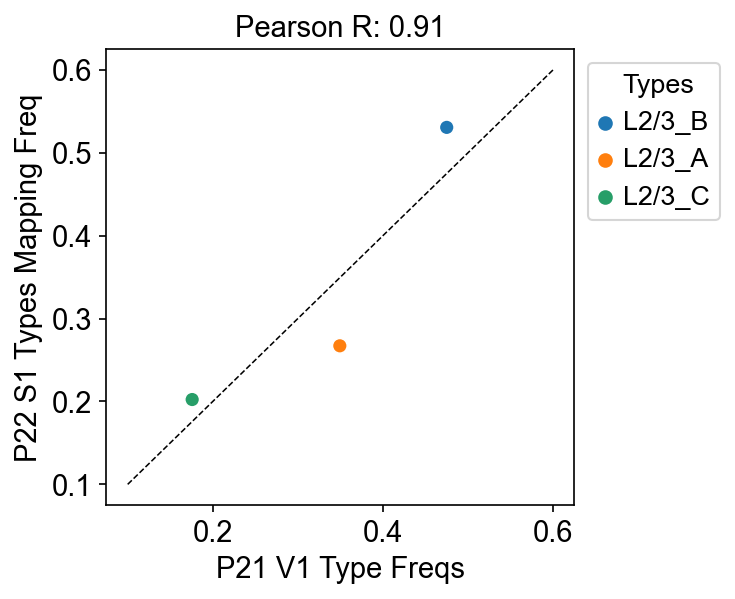

L4


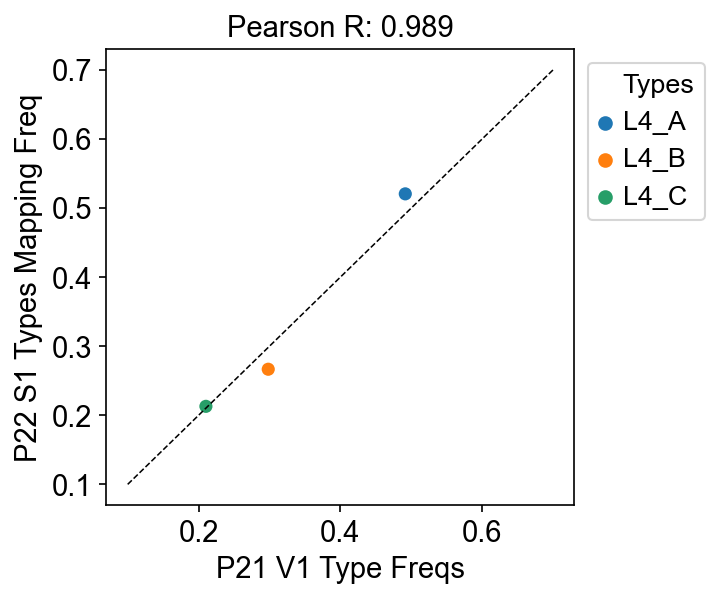

L5


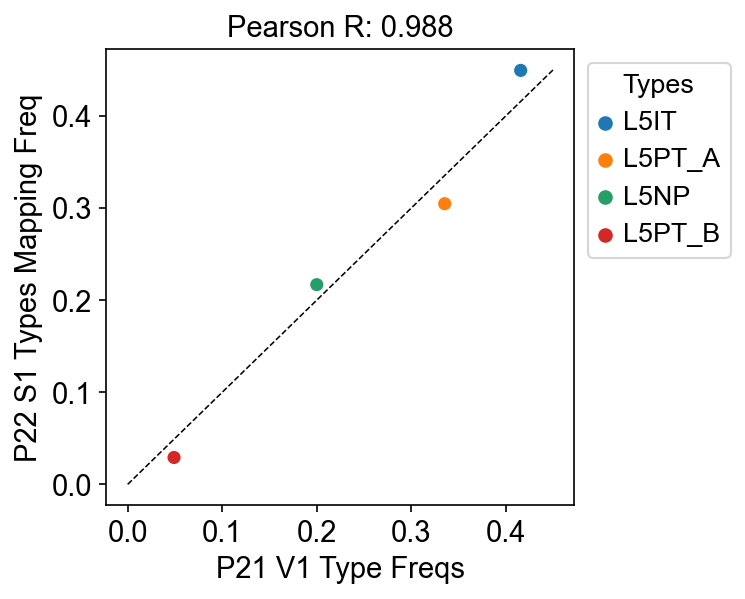

L6


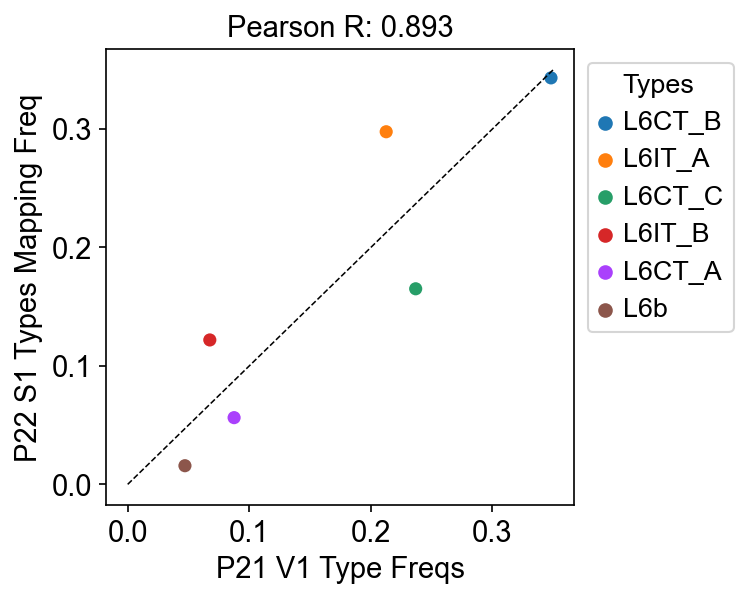

In [102]:
c = 0
lims = [0.6, 0.7, 0.45, 0.35]
low_lims = [0.1, 0.1,0,0]
xes = []
yes = []
for i in ['L2/3', 'L4', 'L5', 'L6']:
    print(i)
    a=P21_V1[P21_V1.obs['Type'].str.startswith(i),:]
    b=P22_glut[P22_glut.obs['P21 V1 Mapping Label'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P21 V1 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P22 Mapping Label'].value_counts())

    oh=xx
    my=yy
    freq_scatter(x=xx[xx.index.str.startswith(i)],
        y=yy[yy.index.str.startswith(i)],
        x_lab='P21 V1 Type Freqs', y_lab='P22 S1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
             low_lim=low_lims[c])
    xes.append(xx[xx.index.str.startswith(i)])
    yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.savefig('figures/V1vsS1_'+i[0:2]+'_freqs.pdf', bbox_inches='tight')
    plt.show()
    c = c +1

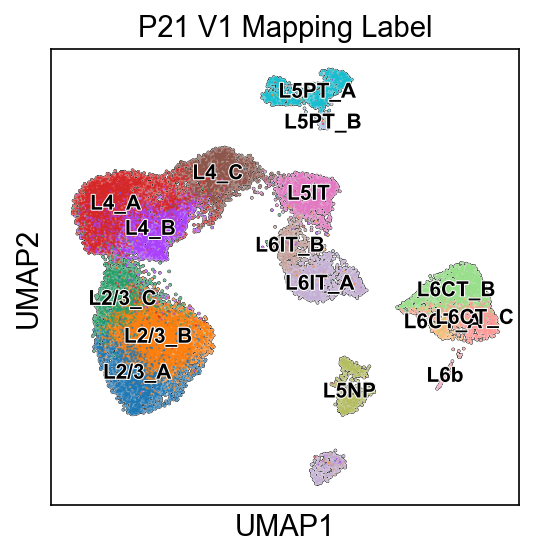

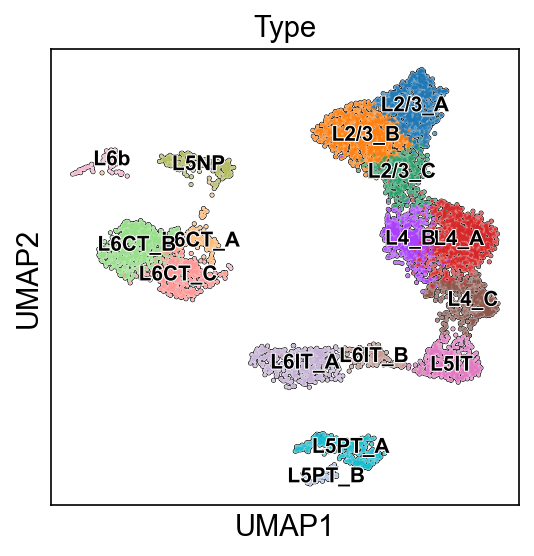

In [108]:
sc.pl.umap(P22_glut, color=['P21 V1 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=5 , legend_fontoutline=1, legend_fontweight='semibold')

sc.pl.umap(P21_V1, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=10 , legend_fontoutline=1, legend_fontweight='semibold')

### Gluta S1 to V1 input markers P12-P14

In [5]:
P14_V1 = rem_fem(sc.read_h5ad('P14full_glut_v3.h5ad'))
P14_V1 = P14_V1[P14_V1.obs['Study']!='2022 RNA',:].copy()
P14_V1.obs['Type'] = P14_V1.obs['Type_nn_dists']
P14_V1.X = P14_V1.raw.X

In [6]:
P12_glut = sc.read_h5ad('h5ads/P12Sham_glut_v2.h5ad')
P12_glut.X = P12_glut.raw.X

In [7]:
all_marks_glut = []
for L in ['L2/3', 'L4', 'L5', 'L6']:
    LX_marks = []
    LX = P12_glut[P12_glut.obs['Type'].str.startswith(L),:].copy()
    LX = LX[LX.obs['Sample']!='S3',:]
    for i in LX.obs['Type'].values.categories:
        LX_marks = LX_marks + list(DE(LX,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=0.6).index)
    all_marks_glut = all_marks_glut + LX_marks  

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
402 403
391 413
522 1091
434 436
415 433
477 510
404 648
273 660
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
44 501
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
401 416


In [9]:
len(set(all_marks_glut)), len(set(P14_V1.var_names).intersection(set(all_marks_glut)))

(3672, 3567)

In [10]:
all_marks_glut_shared = list(set(P14_V1.var_names).intersection(set(all_marks_glut)))

In [11]:
len(all_marks_glut_shared)

3567

In [12]:
bool_S1 = []
for i in P12_glut.var_names:
    if (i in all_marks_glut_shared):
        bool_S1.append(True)
    else:
        bool_S1.append(False)

bool_V1 = []
for i in P14_V1.var_names:
    if (i in all_marks_glut_shared):
        bool_V1.append(True)
    else:
        bool_V1.append(False)

P12_glut.var['highly_variable'] = bool_S1
P14_V1.var['highly_variable'] = bool_V1

**The change below to plot_conf_matx() fixes the indeing issue.**

In [13]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


3567 shared HVGs
trainclassifier() complete after 942.0 seconds


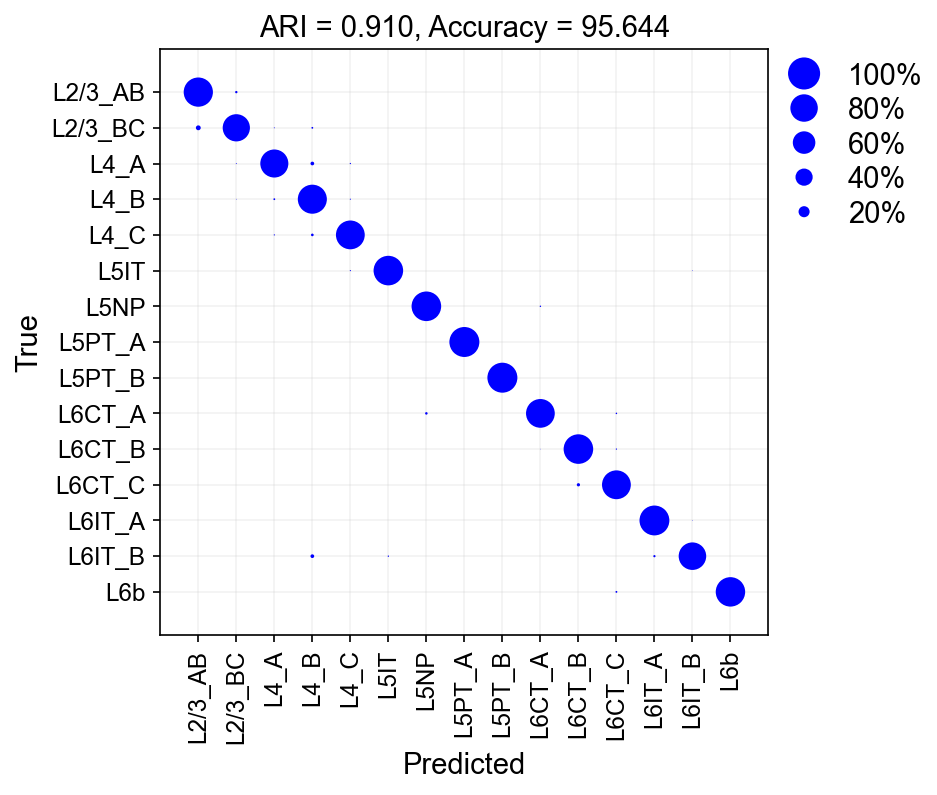

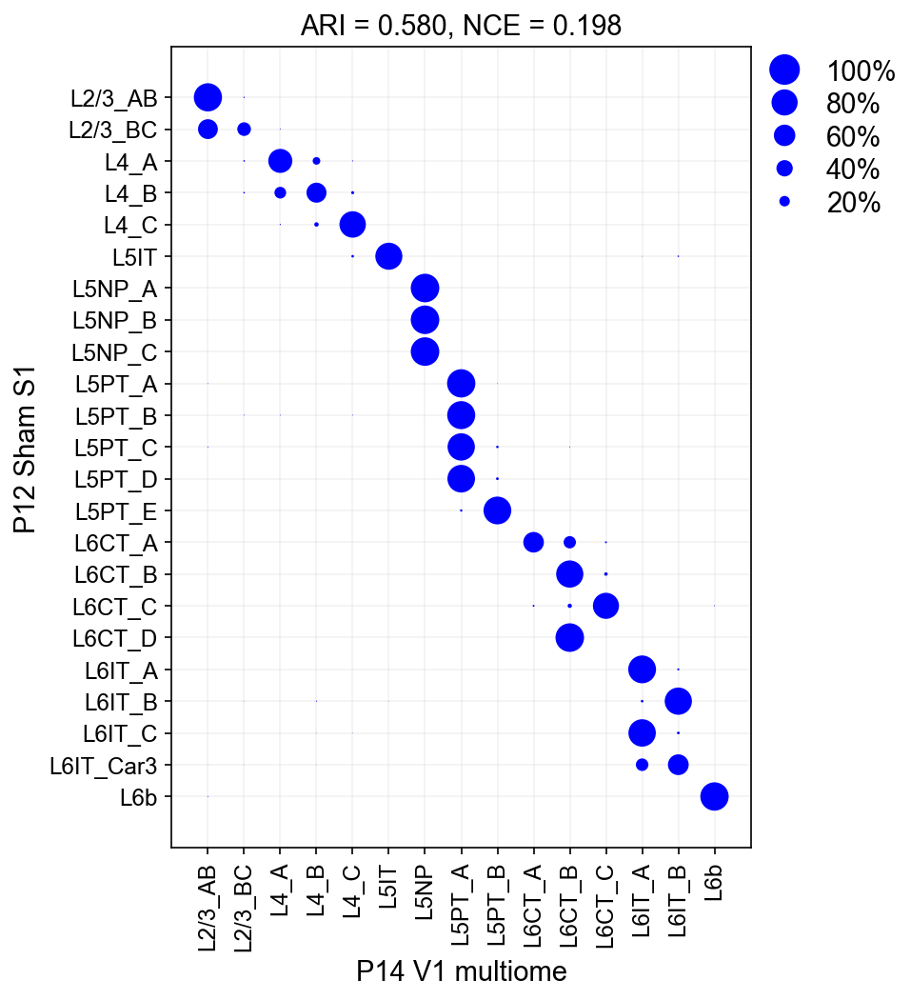

In [14]:
test_items, mapping_items = pairwise_map(adata_t0=P12_glut, adata_t1=P14_V1,test_lab='Type',
                                                    train_lab='Type',  recomp_HVGs=False, union_hvgs=False,
                                         t0_dict=make_dict(P12_glut, 'Type'),
                                         t1_dict=make_dict(P14_V1, 'Type'),
                                        min_cells=100, x_lab='P14 V1 multiome', y_lab='P12 Sham S1')

test_labelsP12vsP12, test_predlabelsP12vsP12, test_prediction_P12vsP12 = test_items
mappingconfmatP12vsP12, mappingxticksP12vsP12_sub, mappingplotP12vsP12 = mapping_items

In [15]:
a = make_dict(P14_V1, 'Type')


P12_glut.obs['P14 V1 Mapping Prob'] = np.max(test_prediction_P12vsP12, axis=1)
P12_glut.obs['P14 V1 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP12).rename_categories(list(a.keys()))

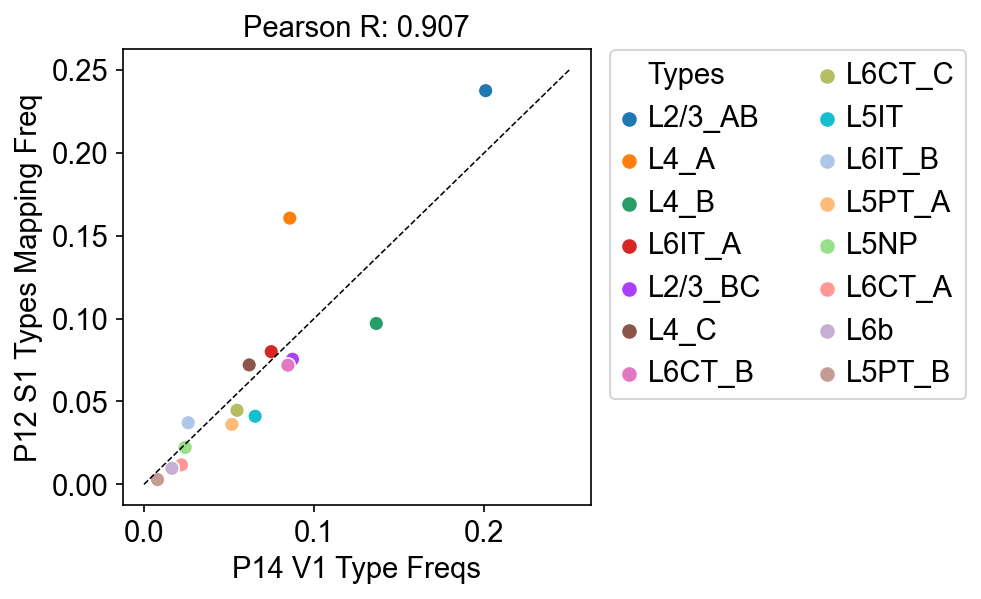

In [44]:
freq_scatter(x=P14_V1.obs['Type'].value_counts(normalize=True),
            y= P12_glut.obs['P14 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P14 V1 Type Freqs', y_lab='P12 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.25, )
plt.savefig('figures/V1vsS1_P12vP14_gluta_freqs.pdf', bbox_inches='tight')

L2/3


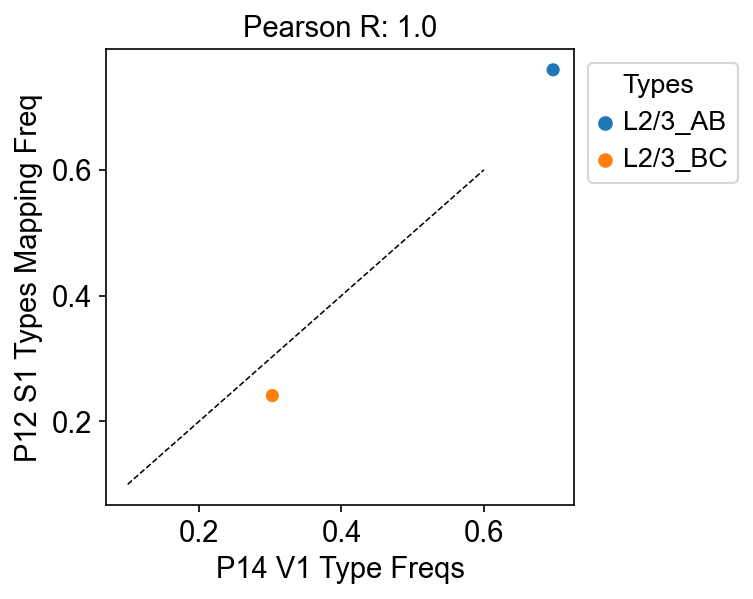

L4


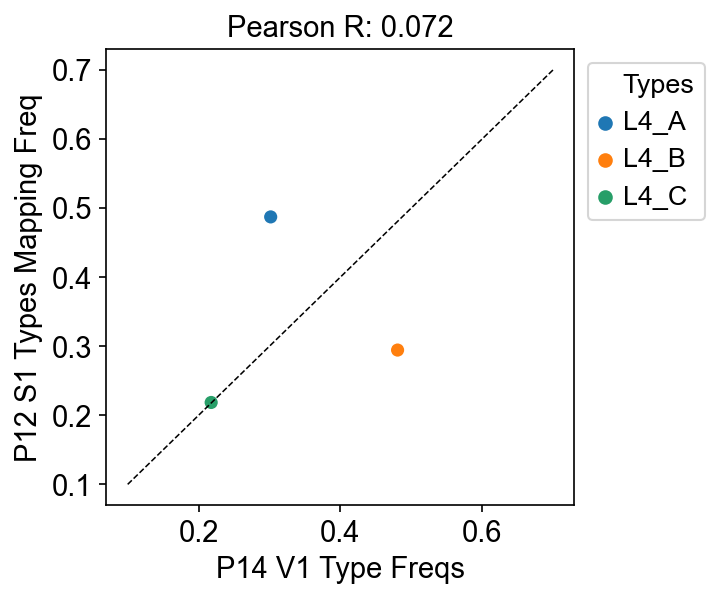

L5


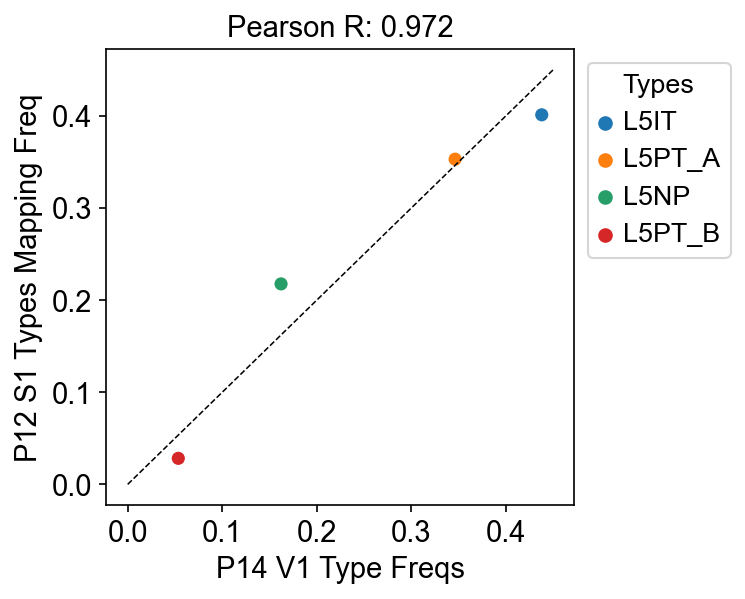

L6


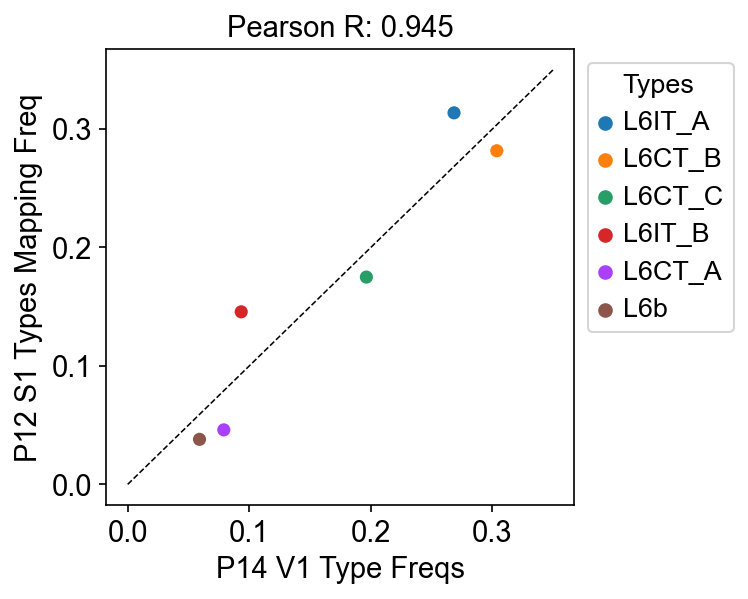

In [17]:
c = 0
lims = [0.6, 0.7, 0.45, 0.35]
low_lims = [0.1, 0.1,0,0]
xes = []
yes = []
for i in ['L2/3', 'L4', 'L5', 'L6']:
    print(i)
    a=P14_V1[P14_V1.obs['Type'].str.startswith(i),:]
    b=P12_glut[P12_glut.obs['P14 V1 Mapping Label'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P14 V1 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P12 Mapping Label'].value_counts())

    oh=xx
    my=yy
    freq_scatter(x=xx[xx.index.str.startswith(i)],
        y=yy[yy.index.str.startswith(i)],
        x_lab='P14 V1 Type Freqs', y_lab='P12 S1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
             low_lim=low_lims[c])
    xes.append(xx[xx.index.str.startswith(i)])
    yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.savefig('figures/V1vsS1_P12vP14'+i[0:2]+'_freqs.pdf', bbox_inches='tight')
    plt.show()
    c = c +1

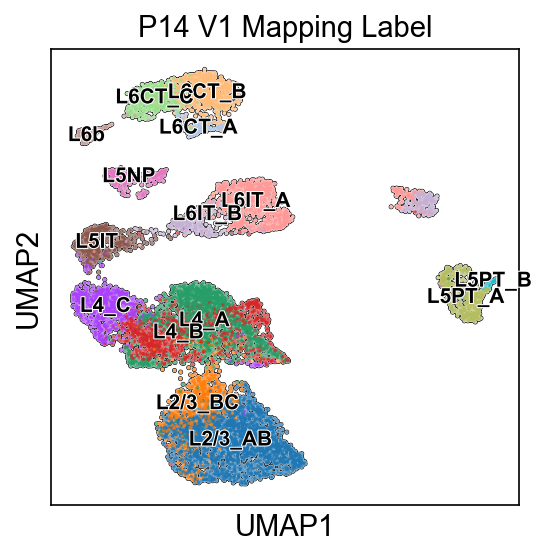

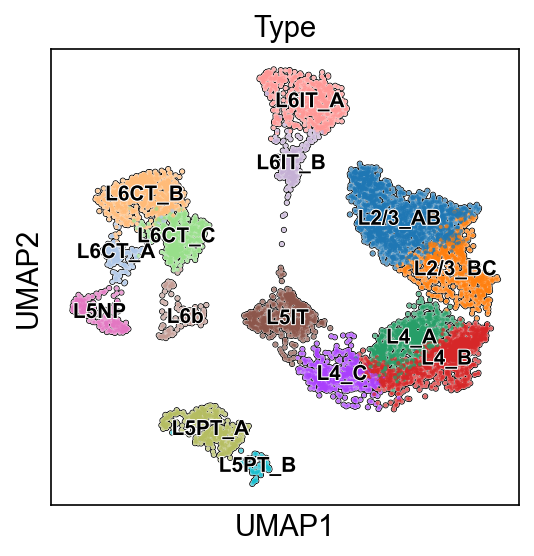

In [121]:
sc.pl.umap(P12_glut, color=['P14 V1 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=10 , legend_fontoutline=1, legend_fontweight='semibold')

sc.pl.umap(P14_V1, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=15 , legend_fontoutline=1, legend_fontweight='semibold')

### GABA

In [15]:
P21_V1g = rem_fem(sc.read_h5ad('P21full_gaba_v3.h5ad'))
P21_V1g = P21_V1g[P21_V1g.obs['Study']!='2022 RNA',:].copy()
P21_V1g.obs['Type'] = P21_V1g.obs['Type_nn_dists']
P21_V1g.X = P21_V1g.raw.X

In [16]:
P22_gaba = sc.read_h5ad('h5ads/P22Sham_gaba_v3.h5ad')
P22_gaba.X = P22_gaba.raw.X

**The change below to plot_conf_matx() fixes the indeing issue.**

In [12]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


1398 shared HVGs
trainclassifier() complete after 76.0 seconds


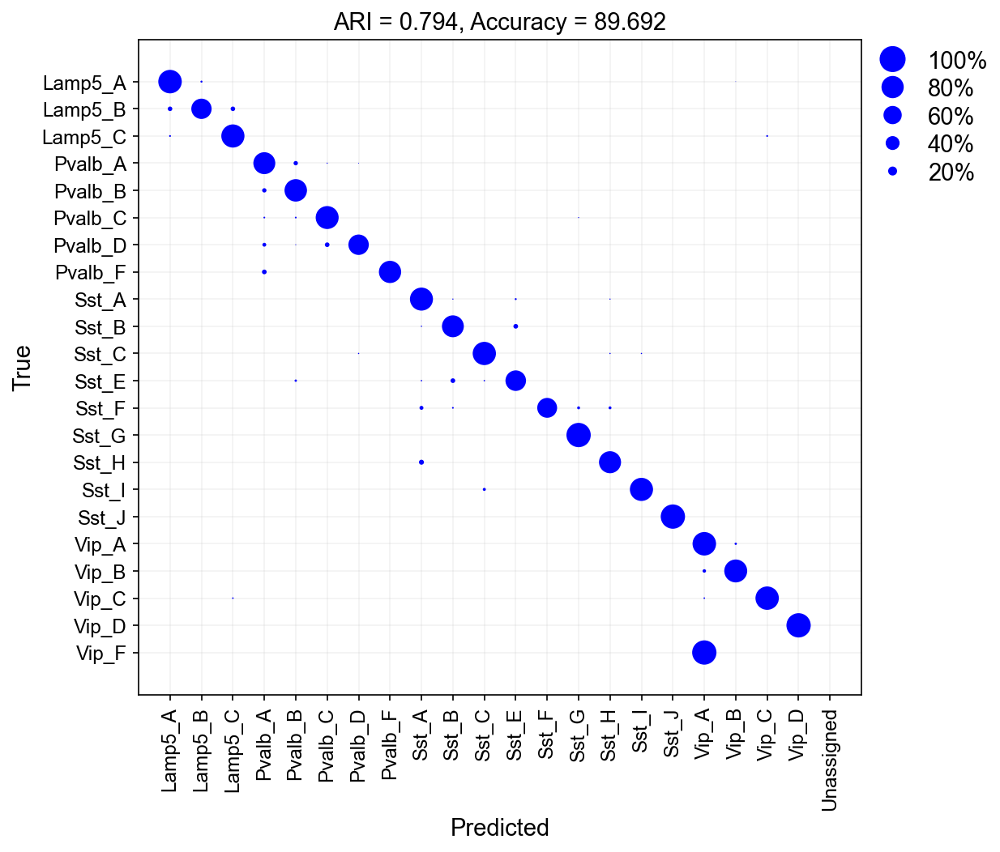

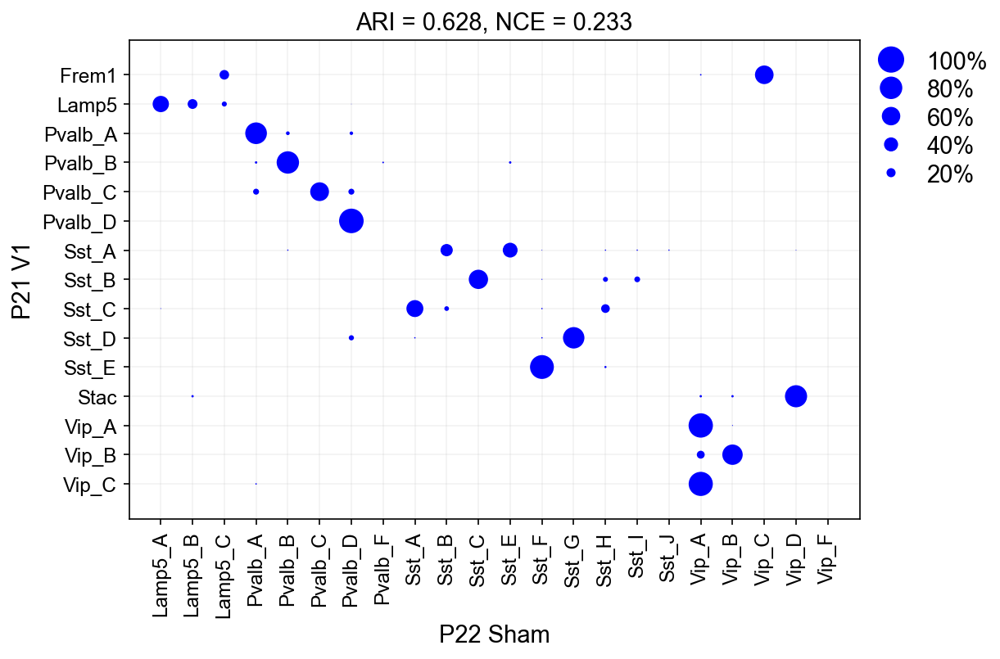

In [17]:
test_items_gab, mapping_items_gab = pairwise_map(adata_t0=P21_V1g, adata_t1=P22_gaba,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=True, union_hvgs=False,
                                         t0_dict=make_dict(P21_V1g, 'Type'),
                                         t1_dict=make_dict(P22_gaba, 'Type'),
                                        min_cells=100, x_lab='P22 Sham', y_lab='P21 V1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items_gab
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items_gab

In [18]:
a = make_dict(P22_gaba, 'Type')

In [23]:
a.keys()

dict_keys(['Lamp5_A', 'Lamp5_B', 'Lamp5_C', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Pvalb_F', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_E', 'Sst_F', 'Sst_G', 'Sst_H', 'Sst_I', 'Sst_J', 'Vip_A', 'Vip_B', 'Vip_C', 'Vip_D', 'Vip_F'])

In [22]:
pd.Categorical(test_predlabelsP12vsP22).categories

Float64Index([ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0,
              11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0],
             dtype='float64')

In [24]:
len(a)

22

No Vip_F

In [25]:
kes = ['Lamp5_A', 'Lamp5_B', 'Lamp5_C', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Pvalb_F', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_E', 'Sst_F', 
       'Sst_G', 'Sst_H', 'Sst_I', 'Sst_J', 'Vip_A', 'Vip_B', 'Vip_C', 'Vip_D',]
P21_V1g.obs['P22 Mapping Prob'] = np.max(test_prediction_P12vsP22, axis=1)
P21_V1g.obs['P22 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP22).rename_categories(kes)

x and y are different by 1 categories


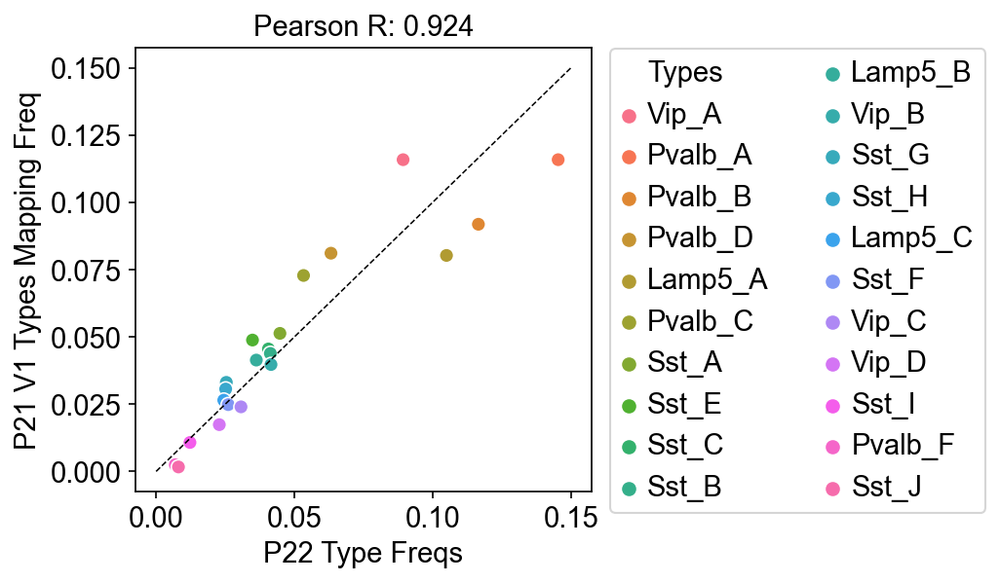

In [31]:
freq_scatter(x=P22_gaba.obs['Type'].value_counts(normalize=True),
            y= P21_V1g.obs['P22 Mapping Label'].value_counts(normalize=True),
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.15, )
plt.savefig('figures/V1vsS1_gaba_freqs.pdf',bbox_inches = 'tight')

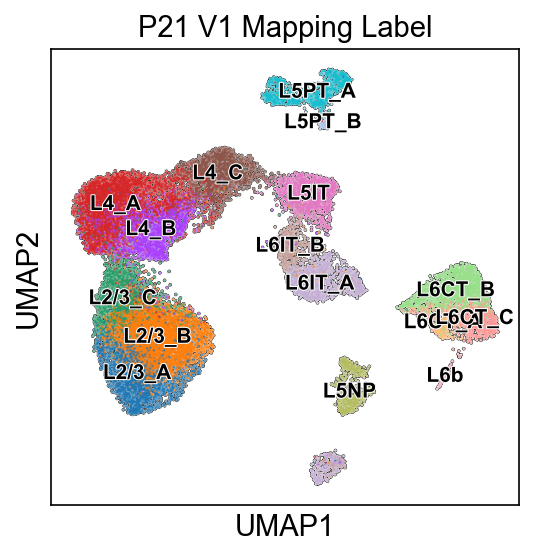

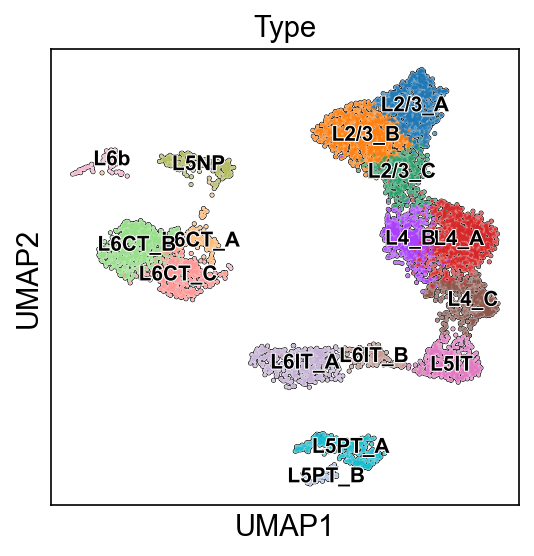

In [125]:
sc.pl.umap(P22_glut, color=['P21 V1 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=5 , legend_fontoutline=1, legend_fontweight='semibold')

sc.pl.umap(P21_V1, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=10 , legend_fontoutline=1, legend_fontweight='semibold')

Pvalb


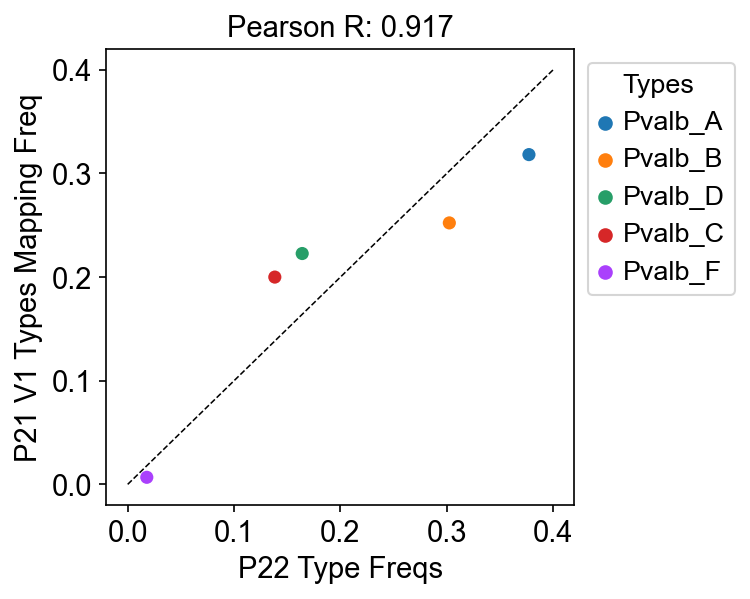

Sst


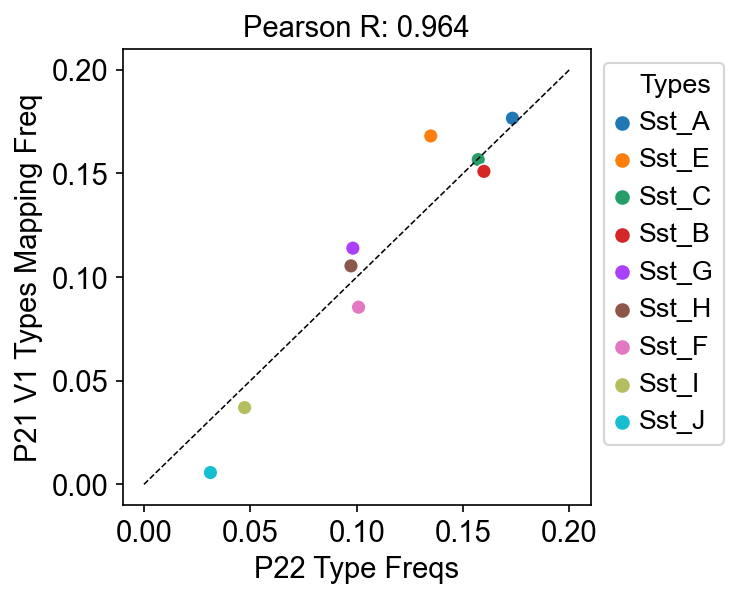

Vip
x and y are different by 1 categories


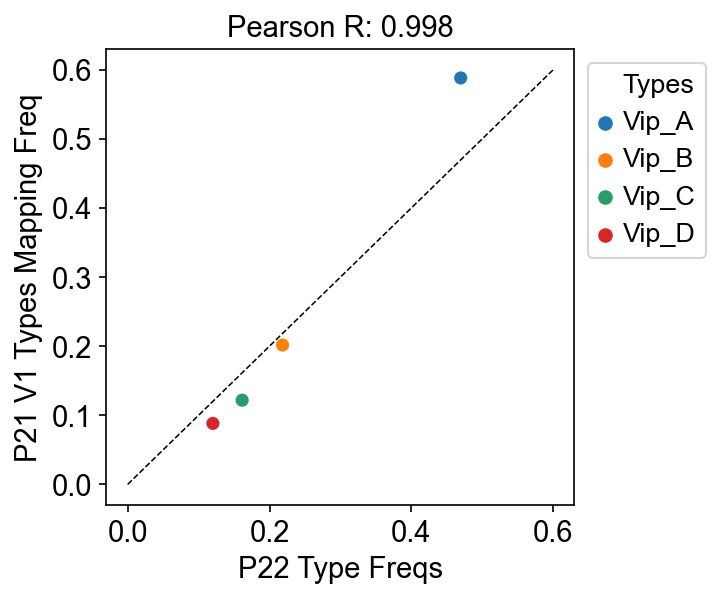

Lamp5


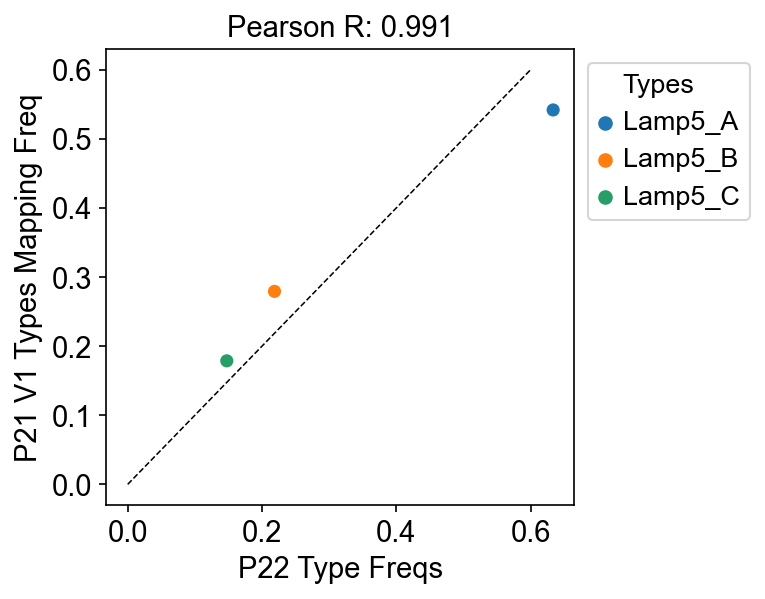

In [53]:
c = 0
lims = [0.4, 0.2, 0.6, 0.6]
low_lims = [0, 0,0,0]
xes = []
yes = []
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    print(i)
    a=P22_gaba[P22_gaba.obs['Type'].str.startswith(i),:]
    b=P21_V1g[P21_V1g.obs['P22 Mapping Label'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P22 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P22 Mapping Label'].value_counts())
    
    if (i=='L4'):
        freq_scatter(x=xx[0:4], y=yy[0:4],
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        oh=xx
        my=yy
        xes.append(xx[0:4])
        yes.append(yy[0:4])
        
    
    else:
        oh=xx
        my=yy
        freq_scatter(x=xx[xx.index.str.startswith(i)],
            y=yy[yy.index.str.startswith(i)],
            x_lab='P22 Type Freqs', y_lab='P21 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        xes.append(xx[xx.index.str.startswith(i)])
        yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.savefig('figures/V1vsS1_'+i+'_freqs.pdf', bbox_inches='tight')
    plt.show()
    c = c +1

### GABA S1 to V1 input markers

In [65]:
P21_V1g = rem_fem(sc.read_h5ad('P21full_gaba_v3.h5ad'))
P21_V1g = P21_V1g[P21_V1g.obs['Study']!='2022 RNA',:].copy()
P21_V1g.obs['Type'] = P21_V1g.obs['Type_nn_dists']
P21_V1g.X = P21_V1g.raw.X

In [66]:
P22_gaba = sc.read_h5ad('h5ads/P22Sham_gaba_v3.h5ad')
P22_gaba.X = P22_gaba.raw.X

In [67]:
all_marks_gaba = []
for L in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    LX_marks = []
    LX = P22_gaba[P22_gaba.obs['Type'].str.startswith(L),:].copy()
    LX = LX[LX.obs['Sample']!='S3',:]
    for i in LX.obs['Type'].values.categories:
        LX_marks = LX_marks + list(DE(LX,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=0.6).index)
    all_marks_gaba = all_marks_gaba + LX_marks  

cutoffs are good at 1.5 FC level
cutoffs are good at 1.5 FC level
101 105
cutoffs are good at 1.5 FC level
161 349
194 201
153 161
147 166
166 189
112 156
204 260
159 228
175 431
308 754
cutoffs are good at 1.5 FC level
156 172
400 513
182 231
54 345
236 238
123 144
261 310


In [68]:
len(set(all_marks_gaba)), len(set(P21_V1g.var_names).intersection(set(all_marks_gaba)))

(2693, 2628)

In [69]:
all_marks_gaba_shared = list(set(P21_V1g.var_names).intersection(set(all_marks_gaba)))

In [70]:
len(all_marks_gaba_shared)

2628

In [71]:
bool_S1 = []
for i in P22_gaba.var_names:
    if (i in all_marks_gaba_shared):
        bool_S1.append(True)
    else:
        bool_S1.append(False)

bool_V1 = []
for i in P21_V1g.var_names:
    if (i in all_marks_gaba_shared):
        bool_V1.append(True)
    else:
        bool_V1.append(False)

P22_gaba.var['highly_variable'] = bool_S1
P21_V1g.var['highly_variable'] = bool_V1

**The change below to plot_conf_matx() fixes the indeing issue.**

In [72]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


2628 shared HVGs
trainclassifier() complete after 74.0 seconds


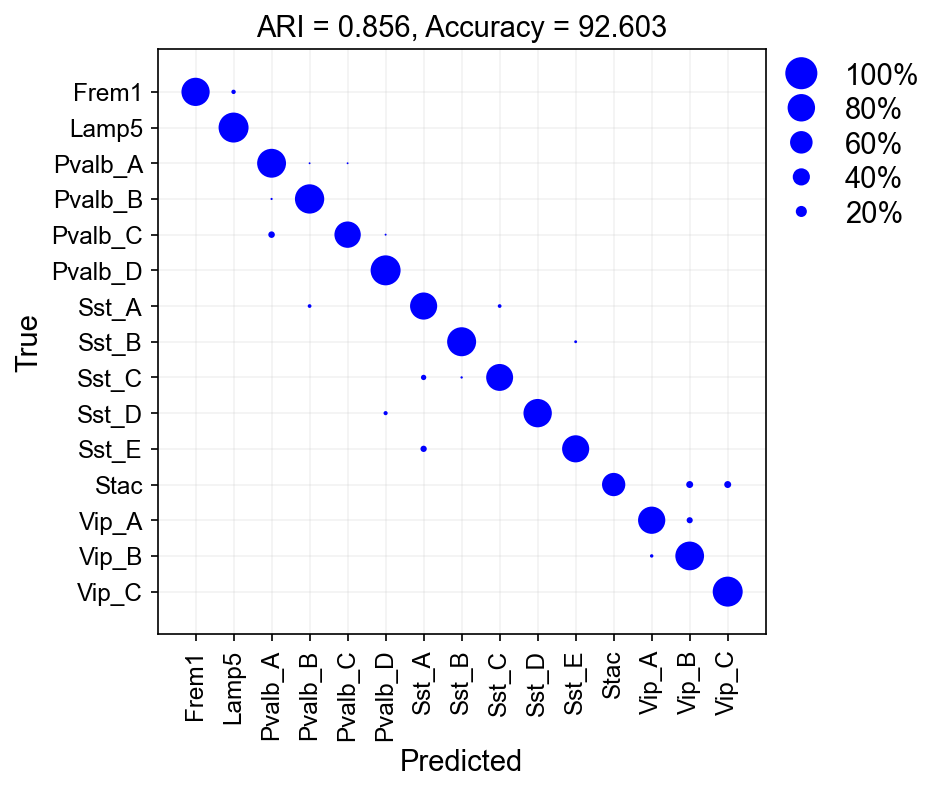

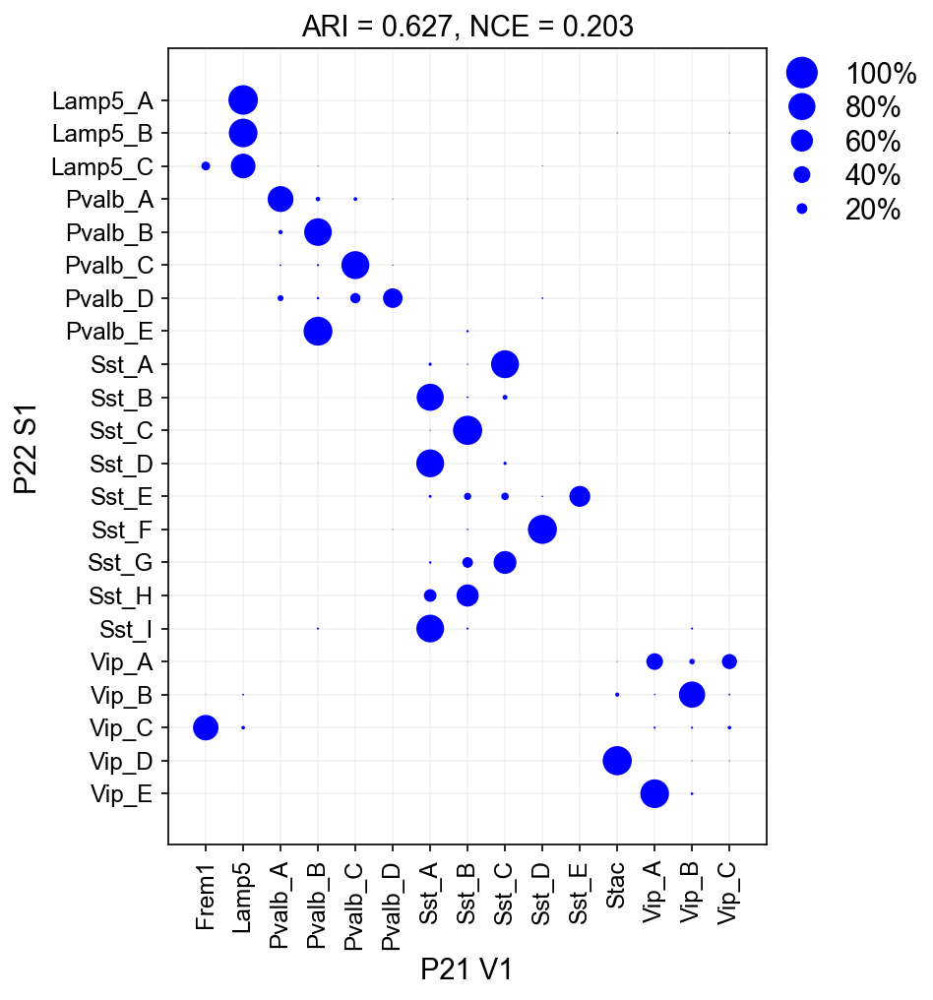

In [73]:
test_items_gab, mapping_items_gab = pairwise_map(adata_t0=P22_gaba, adata_t1=P21_V1g,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=False, union_hvgs=False,
                                         t0_dict=make_dict(P22_gaba, 'Type'),
                                         t1_dict=make_dict(P21_V1g, 'Type'),
                                        min_cells=100, x_lab='P21 V1', y_lab='P22 S1')

test_labelsP12vsP22, test_predlabelsP12vsP22, test_prediction_P12vsP22 = test_items_gab
mappingconfmatP12vsP22, mappingxticksP12vsP22_sub, mappingplotP12vsP22 = mapping_items_gab

In [74]:
a = make_dict(P21_V1g, 'Type')

In [75]:

P22_gaba.obs['P21 V1 Mapping Prob'] = np.max(test_prediction_P12vsP22, axis=1)
P22_gaba.obs['P21 V1 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP22).rename_categories(list(a.keys()))

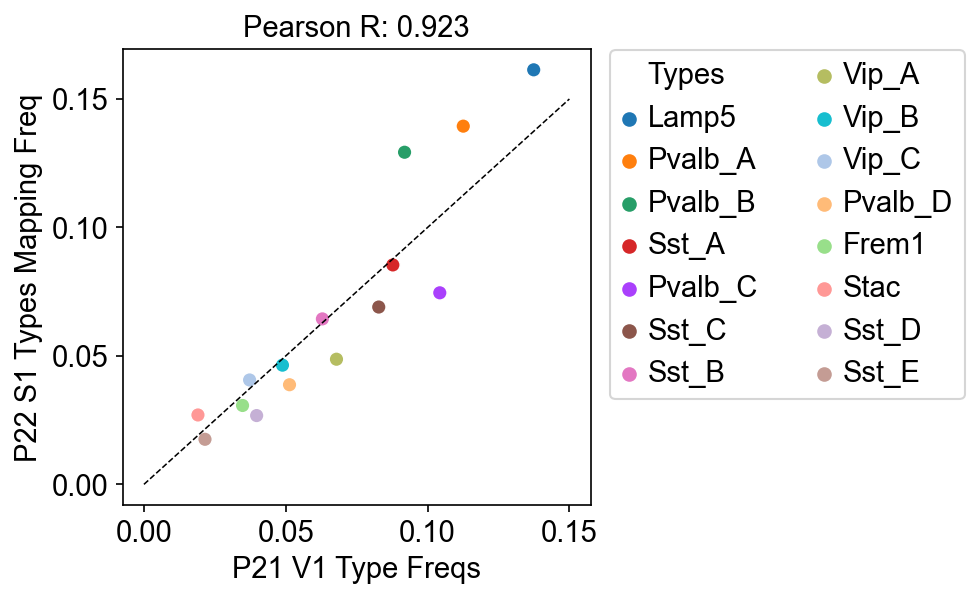

In [76]:
freq_scatter(x=P21_V1g.obs['Type'].value_counts(normalize=True),
            y= P22_gaba.obs['P21 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P21 V1 Type Freqs', y_lab='P22 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.15, )
plt.savefig('figures/V1vsS1_gaba_freqs.pdf',bbox_inches = 'tight')

In [77]:
V1_P21 = P21_V1.concatenate(P21_V1g)
S1_P22 = P22_glut.concatenate(P22_gaba)

In [78]:
pd.Categorical(P21_V1.obs['Type']).categories

Index(['L2/3_A', 'L2/3_B', 'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP',
       'L5PT_A', 'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B',
       'L6b'],
      dtype='object')

In [79]:
pd.Categorical(P21_V1g.obs['Type']).categories

Index(['Frem1', 'Lamp5', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A',
       'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')

In [80]:
ord_ = list(pd.Categorical(P21_V1.obs['Type']).categories)+list(pd.Categorical(P21_V1g.obs['Type']).categories)

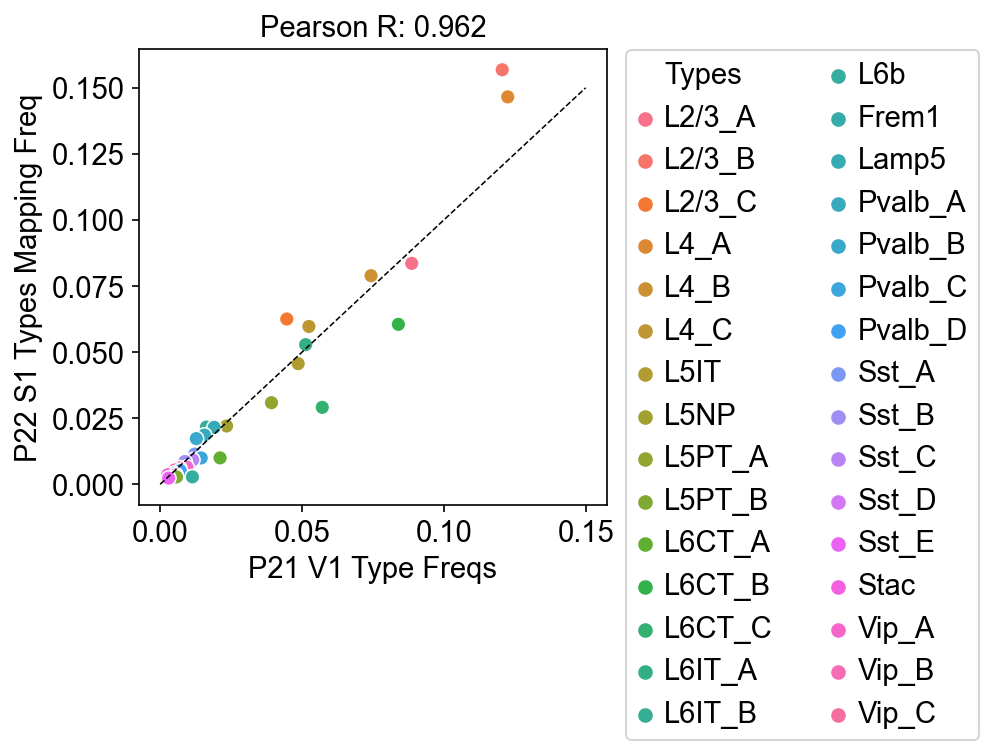

In [83]:
freq_scatter(x=V1_P21.obs['Type'].value_counts(normalize=True),
            y= S1_P22.obs['P21 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P21 V1 Type Freqs', y_lab='P22 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.15,
            hue_ord = ord_)
# plt.xscale('log')
# plt.yscale('log')

plt.savefig('figures/V1vsS1_P21-P22_glutagaba_freqs.pdf', bbox_inches='tight')

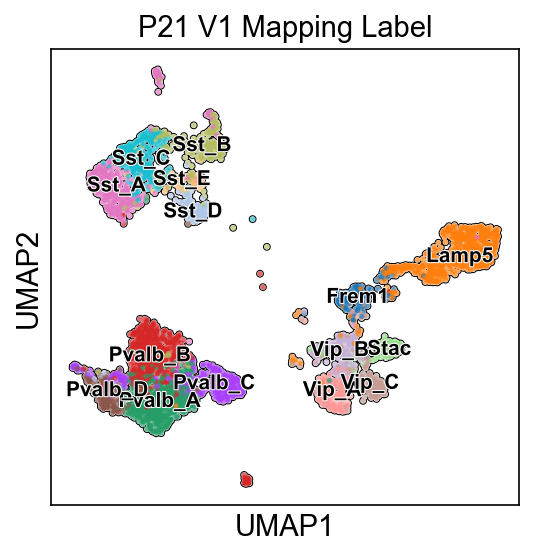

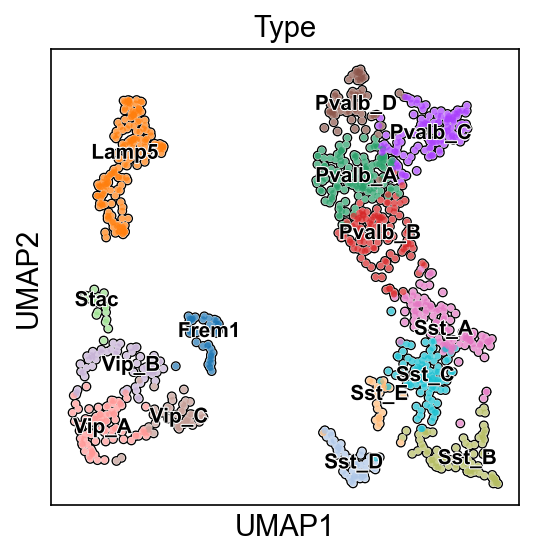

In [114]:
sc.pl.umap(P22_gaba, color=['P21 V1 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=25 , legend_fontoutline=1, legend_fontweight='semibold')

sc.pl.umap(P21_V1g, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=40 , legend_fontoutline=1, legend_fontweight='semibold')

### GABA S1 to V1 input markers P12 - P14

In [87]:
P14_V1g = rem_fem(sc.read_h5ad('P14full_gaba_v3.h5ad'))
P14_V1g = P14_V1g[P14_V1g.obs['Study']!='2022 RNA',:].copy()
P14_V1g.obs['Type'] = P14_V1g.obs['Type_nn_dists']
P14_V1g.X = P14_V1g.raw.X

In [88]:
P12_gaba = sc.read_h5ad('h5ads/P12Sham_gaba_v2.h5ad')
P12_gaba.X = P12_gaba.raw.X

In [89]:
all_marks_gaba = []
for L in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    LX_marks = []
    LX = P12_gaba[P12_gaba.obs['Type'].str.startswith(L),:].copy()
    LX = LX[LX.obs['Sample']!='S3',:]
    for i in LX.obs['Type'].values.categories:
        LX_marks = LX_marks + list(DE(LX,obs_id='Type', obs_id_test=i, ref='rest', pts_thresh=0.4, lf_thresh=0.6).index)
    all_marks_gaba = all_marks_gaba + LX_marks  

168 169
100 108
135 215
121 166
582 900
199 684
161 198
128 175
124 157
145 276
90 223
542 840
111 162
237 538
93 204
96 248
112 269
443 1227
144 596
123 800
61 120
157 461
90 807
164 889


In [90]:
len(set(all_marks_gaba)), len(set(P14_V1g.var_names).intersection(set(all_marks_gaba)))

(4693, 4577)

In [91]:
all_marks_gaba_shared = list(set(P14_V1g.var_names).intersection(set(all_marks_gaba)))

In [92]:
len(all_marks_gaba_shared)

4577

In [93]:
bool_S1 = []
for i in P12_gaba.var_names:
    if (i in all_marks_gaba_shared):
        bool_S1.append(True)
    else:
        bool_S1.append(False)

bool_V1 = []
for i in P14_V1g.var_names:
    if (i in all_marks_gaba_shared):
        bool_V1.append(True)
    else:
        bool_V1.append(False)

P12_gaba.var['highly_variable'] = bool_S1
P14_V1g.var['highly_variable'] = bool_V1

**The change below to plot_conf_matx() fixes the indeing issue.**

In [94]:
#code
#import
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
from harmony import harmonize
from sklearn.metrics.cluster import adjusted_rand_score
import random
from sklearn.metrics import confusion_matrix
from sklearn.metrics import jaccard_score
from sklearn.utils import shuffle
from anndata import AnnData
from sklearn.cluster import KMeans
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable
from scipy.stats import hypergeom
import sklearn.preprocessing
import seaborn as sn
from random import sample
import pickle
#from matplotlib_venn import venn3, venn3_circles
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples


from matplotlib import gridspec
from sklearn.metrics import confusion_matrix, adjusted_rand_score, roc_curve, auc, classification_report, f1_score, cohen_kappa_score
import plotly.graph_objects as go
from itertools import cycle, islice
from sklearn.preprocessing import label_binarize

import scanpy as sc
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=100, dpi_save=200)


import scrublet as scr

from typing import Optional

# import warnings
# warnings.filterwarnings("ignore")

import matplotlib as mpl
from matplotlib import gridspec
import xgboost as xgb
from sklearn.metrics import accuracy_score


sc.settings.verbosity = 0           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=75, dpi_save=200)

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

def test_func():
    print('test')
    
def test2():
    print('test2')
def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
            adata = adata[adata.obs['Type']!=j,:]
    return adata
def pipeline_short(adata, batch_correct, batch_ID):
                   
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")

    
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)
        
def pre_process(adata, batch_ID):
    
    if sp.sparse.issparse(adata.X):
        if np.any(adata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(adata.X<0):
            raise Exception("Matrix contains negative values")
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=batch_ID) #HVGs
    adata.raw = adata
    sc.pp.scale(adata, max_value=10) #scale
    sc.tl.pca(adata, svd_solver='arpack') #run PCA
    

def pipeline(adata, 
             batch_correct: Optional[bool] = None,
             batch_ID: Optional[str] = None):
    
    if (batch_correct):
        Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = batch_ID)
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

    else:
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
        sc.tl.leiden(adata)
        sc.tl.umap(adata)

def clust_obs_plot(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    
    x,y = ser.index, ser.values
    
    plt.figure(figsize=(15,4))
    plt.bar(x,y)
    plt.axhline(np.median(adata.obs[obs_id]), color='r')
    plt.ylabel(obs_id)
    
    return x, y

def DE(adata, obs_id, obs_id_test, ref, pts_thresh, lf_thresh):

    sc.tl.rank_genes_groups(adata, groupby=obs_id, groups=[obs_id_test], 
                                reference=ref, method='t-test', pts=True, use_raw=True)

    lfcs = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8') 

    l231_genes = adata.uns['rank_genes_groups']['pts']

    lfcs = []
    p_adj = []
    names = list(adata.uns['rank_genes_groups']['names'].astype([(obs_id_test, '<U50')]).view('<U50'))
    logfoldchanges = adata.uns['rank_genes_groups']['logfoldchanges'].astype([(obs_id_test, '<f8')]).view('<f8')
    pvals_adj = adata.uns['rank_genes_groups']['pvals_adj'].astype([(obs_id_test, '<f8')]).view('<f8')

    for i in l231_genes.index:
        lfcs.append(logfoldchanges[names.index(i)])
        p_adj.append(pvals_adj[names.index(i)])

    l231_genes['LF'] = lfcs
    l231_genes['p_adj'] = p_adj
    
    #plt.hist(l231_genes[obs_id_test].values)

    l231_genes = l231_genes[l231_genes[obs_id_test]>pts_thresh]
    
    sort_LF = l231_genes.sort_values('LF', ascending=False)
    
    a = np.where(sort_LF[sort_LF['LF']>0.6]['p_adj'].values<0.05)[0].shape[0]
    b = sort_LF[sort_LF['LF']>0.6].shape[0]
    if(a == b):
        print('cutoffs are good at 1.5 FC level')
    else:
        print(a,b)
        
    return sort_LF[sort_LF['LF']>lf_thresh]
        
def clust_obs(adata, obs_id, obs_id_split):

    obs_quants = []
    for i in adata.obs[obs_id_split].values.categories:
    #for i in dr_corr.obs['Atlas Label'].values.categories:
        obs_quants.append(np.mean(adata[adata.obs[obs_id_split]==i].obs[obs_id].values))
        
    x, y = adata.obs[obs_id_split].values.categories, obs_quants
    ser = pd.Series(y,x).sort_values(ascending=False)
    return ser.index, ser.values

def res_tune(adata, def_labels):
    
    adata_ari = []
    adata_num_clusts = []
    for res in np.arange(1,2.1, 0.1):
        sc.tl.leiden(adata, resolution=res)

        adata_num_clusts.append(len(adata.obs.leiden.values.categories))
        adata_ari.append(adjusted_rand_score(def_labels, list(adata.obs.leiden.values)))
        
    return adata_num_clusts, adata_ari

from math import log, e
def entropy2(labels, base=None):
  """ Computes entropy of label distribution. """

  n_labels = len(labels)

  if n_labels <= 1:
    return 0

  value,counts = np.unique(labels, return_counts=True)
  probs = counts / n_labels
  n_classes = np.count_nonzero(probs)

  if n_classes <= 1:
    return 0

  ent = 0.

  # Compute entropy
  base = e if base is None else base
  for i in probs:
    ent -= i * log(i, base)

  return ent

def check_clust(adata, clus, ref_age):
    sc.pl.umap(adata[adata.obs.leiden==clus], color=[ref_age+'-2022 Mapping Prob', ref_age+'-2022 Mapping Label'])
    print(adata[adata.obs.leiden==clus].shape, 'mean prob', np.mean(adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Prob']))
    ser = adata[adata.obs.leiden==clus].obs['Sample'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    ser = adata[adata.obs.leiden==clus].obs[ref_age+'-2022 Mapping Label'].value_counts()
    plt.bar(ser.index, ser.values,)
    plt.xticks(rotation=90)
    plt.show()
    
def maj_vote_annot(adata, clust_id, putative_annot, final_annot, vlmcendo=False):
    clust_list = []
    for i in adata.obs[clust_id].values.categories:
        clust = adata[adata.obs[clust_id]==i,:]
        clust_df = clust.obs[putative_annot].value_counts()
        if (clust_df.index[0]=='Unassigned'):
            biggest_cat = clust_df.index[1]
        else: biggest_cat = clust_df.index[0]
        if (vlmcendo):
            if (biggest_cat in ('VLMC', 'Endo')):
                clust.obs[putative_annot+'_maj'] = ['VLMC+Endo']*clust.shape[0]
                clust_list.append(clust)
            else:
                clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
                clust_list.append(clust)
        else:
            clust.obs[putative_annot+'_maj'] = [biggest_cat]*clust.shape[0]
            clust_list.append(clust)

    adata_annot = clust_list[0].concatenate(clust_list[1:], index_unique=None)
    adata_annot.obs[final_annot] = adata_annot.obs[putative_annot+'_maj']
    a = sc.pl.dotplot(adata_annot, 'Mdga1', 'leiden',) #to fix categories
    return adata_annot

def clus_sample_bars(adata, a_, b_, samp_id, clus_id, size=(13,9.5)):
    adata_ser = adata.obs[samp_id].value_counts(normalize=True)
    plt.bar(adata_ser.index, adata_ser.values)
    plt.xticks(rotation=90)
    plt.title('Overall Dataset')
    plt.show()
    a,b = 0 ,0 
    fig, axs = plt.subplots(a_,b_, figsize=size)

    for i in adata.obs[clus_id].values.categories:
        clus = adata[adata.obs[clus_id]==i,:]
        clus_ser = clus.obs[samp_id].value_counts(normalize=True)
        axs[a,b].bar(clus_ser.index, clus_ser.values)
        axs[a,b].set_title(i+' ('+str(clus.shape[0])+' cells)')
        axs[a,b].set_ylabel('Fraction')
        axs[a,b].set_xticklabels(clus_ser.index, rotation=90)
        b = b + 1
        if (b>=b_):
            b = 0
            a = a + 1
    plt.tight_layout()
    
    
def euclidean_distance(vector1, vectors_list):
    # Ensure that the input vectors are numpy arrays
    vector1 = np.array(vector1)
    vectors_list = [np.array(vector) for vector in vectors_list]
    
    # Calculate the Euclidean distance between the input vector and each vector in the list
    distances = [np.linalg.norm(vector1 - vector) for vector in vectors_list]
    return distances

def nn_voting(adata, type_old, type_new, delta_thresh):
    adata.obs['idx'] = np.arange(adata.shape[0])

#     #re-make graph using UMAP space for voting below
#     sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_umap')
#     sc.tl.umap(adata)

    adata.obs[type_new] = adata.obs[type_old]
    adata_un_idx = adata[adata.obs[type_old]=='Unassigned',:].obs.idx.values #indices of unassigned cells
    neigh_matx = adata.obsp['distances'].A #each row's nonzero entries tells neighbors
    adata_iGBs = list(adata.obs[type_old].values) #all the step1 assignments
    n_neighbs = adata.uns['neighbors']['params']['n_neighbors']
    print(adata.uns['neighbors']['params'])
    print(' ')
    
    print("Pre-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    
    delta = 1 #init delta
    while (delta>delta_thresh):    
        un_frac1 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells before voting

        #loop thru each cell
        for i in adata_un_idx:

            #so that it only loops thru still-unassigned cells after first pass
            if (adata.obs[type_new][i]=='Unassigned'):
                neighbs_idx = np.where(neigh_matx[i,:]>0)[0] #cell i's neighbors
                neighbs_iGBs = adata[neighbs_idx].obs[type_new] #the neighbors' iGBs

#                 #if there's a type in the neighbors that is majority, assign it
#                 if (neighbs_iGBs.value_counts()[0] > n_neighbs/2):
#                     adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                
                #no need to be majority, just be biggest one
                adata_iGBs[i] = neighbs_iGBs.value_counts().index[0]
                #update the IDs to help assignment of next cell
                adata.obs[type_new] =  pd.Categorical(adata_iGBs)

        un_frac2 = adata_iGBs.count('Unassigned')/adata.shape[0] #frac of unassigned cells after voting

        delta = (un_frac1-un_frac2)/un_frac1   #stop when this changes by less than 1%
        print(delta, un_frac2)

    print("Post-voting unassigned: ", adata_iGBs.count('Unassigned'),
          adata_iGBs.count('Unassigned')/adata.shape[0])
    
    return adata


def make_hmap(adata,thres, y_obs='Type', x_obs='leiden', ):
    crosstab_data = pd.crosstab(adata.obs[y_obs], adata.obs[x_obs], 
                           normalize='index')
    # For rows
    row_order = np.argsort(-crosstab_data.values.max(axis=1))

    # For columns
    column_order = np.argsort(-crosstab_data.values.max(axis=0))

    reordered_rows = crosstab_data.index[row_order]
    reordered_crosstab_rows = crosstab_data.iloc[row_order]

    # For columns
    reordered_columns = crosstab_data.columns[column_order]
    reordered_crosstab = reordered_crosstab_rows[reordered_columns]
    #return reordered_crosstab
    
    
    from sklearn.metrics import adjusted_rand_score

    

    labels_true = adata.obs[y_obs]
    labels_pred = adata.obs[x_obs]

    # Compute the Adjusted Rand Index
    ari = adjusted_rand_score(labels_true, labels_pred)
    
    return [reordered_crosstab.applymap(lambda value: value if value > thres else np.round(value, 2)),
           ari]
def freq_scatter(x, y, x_lab, y_lab, hue_, unity_lim, low_lim):

    if (x.shape[0]!=y.shape[0]): 
        print('x and y are different by', np.abs(x.shape[0]-y.shape[0]), 'categories')
    
    if (y.shape[0]>x.shape[0]):
        y = y[x.index]
    else:
        x = x[y.index]

    df = pd.DataFrame(index=list(x.index.values), columns=[x_lab, y_lab],
                      data=np.transpose(np.array([x.values, y.values])))

    df[hue_] = df.index
    sn.scatterplot(data=df, x=x_lab, y = y_lab, hue=hue_, s=50)
    plt.legend(bbox_to_anchor=(1.01, 1.03), loc='upper left', fontsize=14, ncol=2)
    plt.plot(np.linspace(low_lim,unity_lim), np.linspace(low_lim,unity_lim), ls='--', 
             color='black', linewidth=0.75)
    plt.title('Pearson R: '+str(np.round(sp.stats.pearsonr(x, y)[0], 3)))
    plt.grid(False)
    #plt.loglog()
    


from anndata import AnnData
from typing import Union, Optional, Tuple, Collection, Sequence, Iterable

def module_score(adata:AnnData, genes_use: list, score_name: Optional[str] = None, verbose: bool = True):
    
    """\
    Compute module scores for all cells in adata as described in methods of RGC-dev paper.
    
    
    Parameters
    ----------
    adata
        The (annotated) data matrix of shape `n_obs` × `n_vars`.
        Rows correspond to cells and columns to genes.
    genes_use
        list of genes in module of interest
    score_name
        Name endowed to the module score to be computed
        e.g. "Mod1"
    verbose
        Inform user of fraction of module genes that are in adata
        
    Returns
    -------
    adata with a new .obs called score_name
    
    """
    
    if (score_name==None):
        score_name = str(input("Provide a name for this score (no spaces): "))
        
    genes_use0 = genes_use
    genes_use = list(set(genes_use).intersection(adata.var_names))#genes that are both in module and `adata`
    
     
    if (len(genes_use) == 0):
        raise ValueError("Error : Must provide a list of genes that are present in the data")
        
    
    if (verbose):
        if(len(genes_use0) > len(genes_use)):
            n = len(genes_use0) - len(genes_use)
            print(score_name,": Note that", n, "of the", len(genes_use0), "genes in your module do not exist in the data set." )
        else:
            print(score_name,": Note that all of the", len(genes_use), "genes in your module are in the data set." )
    
    
    
    adata_score = adata.copy()
    adata_score = adata[:,genes_use]
    
    counts_modgenes = adata_score.X.toarray() #all cells, module genes
    counts_all = adata.X.toarray() #all cells, all genes
    #scores = np.mean(counts_modgenes, axis=1) - np.mean(counts_all, axis=1) #(row means of counts_modgenes ) - (row means of counts_all)
    scores = np.mean(counts_modgenes, axis=1) #(row means of counts_modgenes )

    adata.obs[score_name] = scores
    
    return genes_use    
    

def clean_subclasses(adata, rep):
    #define avg PC position of each type. Gotta use a type with no "Unassigned" group
    typ_mean_dict = {}
    for i in adata.obs['Subclass'].values.categories:
        typ_mean_dict[i] = np.mean(adata[adata.obs['Subclass']==i,:].obsm[rep][:,0:40], axis=0)

    #assign based on proximity to avg type
    dists_list = []
    dict_keys = list(typ_mean_dict.keys())
    for i in range(adata.shape[0]):
        typ_ = adata.obs['Subclass'][i]
        dists = euclidean_distance(adata.obsm[rep][i,0:40], list(typ_mean_dict.values()))

        #dist = dists[dict_keys.index(typ_)]
        typ = dict_keys[np.argmin(dists)]
        #types.append(typ)
        if (typ!=typ_):
            dists_list.append(100)
        else: dists_list.append(0)

    adata.obs['Dist to Subclass'] = dists_list
    
def make_dict(adata, obs_id):

    adata_dict = {}
    for num,i in enumerate(adata.obs[obs_id].values.categories):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict
    

def plotConfusionMatrix(
    ytrue,
    ypred,
    type,
    xaxislabel,
    yaxislabel,
    title,
    train_dict,
    test_dict=None,
    re_order=None,
    re_order_cols = None,
    re_index = None,
    re_order_rows = None,
    save_as=None,):
    
    #very bad
    numbertrainclasses = len(set(ypred))
    numbertestclasses = len(set(ytrue))
    
    #cfm is 11x11 b/c 11 is = y_true U y_pred
    confusionmatrix = confusion_matrix(y_true = ytrue, y_pred = ypred)
        
    #only need this when mapping b/c if validaiton, all classes will be used and cfm will be constructed properly
    if type == 'mapping':
        rows = np.where(np.sum(confusionmatrix, axis=1)>0)[0]
        cols = np.where(np.sum(confusionmatrix, axis=0)>0)[0]
        
        cfm = confusionmatrix[rows,:][:,cols]
        
        #show all columns, even ones with no mapping
        
        #this was changed 10/12/2023 to address unassigned issue
        cfm_z = np.zeros((len(test_dict),len(train_dict)))
        #cfm_z = np.zeros((len(rows),len(cols)))

        cfm_z[:, np.array(pd.Categorical(ypred).categories, dtype='int')]=cfm 
        confusionmatrix = cfm_z
        
        #always keep only as many as rows as num of test classes
        #but, b/c of python's 0 indexing, if the number of training classes is in the 
        #y_pred list, then that means there was an unassigned
#       if numbertrainclasses in ypred:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses+1]#for Unassigned
#       else:
#         confusionmatrix = confusionmatrix[0:numbertestclasses,0:numbertrainclasses]
    
        confmatpercent = confusionmatrix/np.sum(confusionmatrix, axis=1).reshape(-1,1)

        conf_df = pd.DataFrame(confmatpercent)
        conf_df.index = list(test_dict.keys())

        #name columns of conf mat
        if(len(conf_df.columns)>len(train_dict)):
            conf_df.columns = list(train_dict.keys())+['Unassigned']
        else:
            conf_df.columns = list(train_dict.keys())


        if (re_order):
            conf_df = conf_df[re_order_cols]
        if (re_index):
            conf_df = conf_df.reindex(re_order_rows)

        diagcm = conf_df.to_numpy()
    
    
        xticksactual = list(conf_df.columns)
        
        #print(conf_df)
        
    
    else:
        confmatpercent = np.zeros(confusionmatrix.shape)
        for i in range(confusionmatrix.shape[0]):
            if np.sum(confusionmatrix[i,:]) != 0:
                confmatpercent[i,:] = confusionmatrix[i,:]/np.sum(confusionmatrix[i,:])
            else:
                confmatpercent[i,:] = confusionmatrix[i,:]
            diagcm = confmatpercent
            xticks = np.linspace(0, confmatpercent.shape[1]-1, confmatpercent.shape[1], dtype = int)
        xticksactual = []
        for i in xticks:
            if i != numbertrainclasses:
                xticksactual.append(list(train_dict.keys())[i])
            else:
                xticksactual.append('Unassigned')
        
    dot_max = np.max(diagcm.flatten())
    dot_min = 0
    if dot_min != 0 or dot_max != 1:
        frac = np.clip(diagcm, dot_min, dot_max)
        old_range = dot_max - dot_min
        frac = (frac - dot_min) / old_range
    else:
        frac = diagcm
    xvalues = []
    yvalues = []
    sizes = []
    for i in range(diagcm.shape[0]):
        for j in range(diagcm.shape[1]):
            xvalues.append(j)
            yvalues.append(i)
            sizes.append((frac[i,j]*35)**1.5)
    size_legend_width = 0.5
    height = diagcm.shape[0] * 0.3 + 1
    height = max([1.5, height])
    heatmap_width = diagcm.shape[1] * 0.35
    width = (
        heatmap_width
        + size_legend_width
        )
    fig = plt.figure(figsize=(width, height))
    axs = gridspec.GridSpec(
        nrows=2,
        ncols=2,
        wspace=0.02,
        hspace=0.04,
        width_ratios=[
                    heatmap_width,
                    size_legend_width
                    ],
        height_ratios = [0.5, 10]
        )
    dot_ax = fig.add_subplot(axs[1, 0])
    dot_ax.scatter(xvalues,yvalues, s = sizes, c = 'blue', norm=None, edgecolor='none')
    y_ticks = range(diagcm.shape[0])
    dot_ax.set_yticks(y_ticks)
    if type == 'validation':
        dot_ax.set_yticklabels(list(train_dict.keys()))
    elif type == 'mapping':
      #dot_ax.set_yticklabels(list(test_dict.keys()))
        dot_ax.set_yticklabels(list(conf_df.index))
    x_ticks = range(diagcm.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels(xticksactual, rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(True, linewidth = 0.2)
    dot_ax.set_axisbelow(True)
    dot_ax.set_xlim(-0.5, diagcm.shape[1] + 0.5)
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax + 0.5, ymin - 0.5)
    dot_ax.set_xlim(-1, diagcm.shape[1])
    dot_ax.set_xlabel(xaxislabel)
    dot_ax.set_ylabel(yaxislabel)
    dot_ax.set_title(title)
    size_legend_height = min(1.75, height)
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(
        2,
        1,
        subplot_spec=axs[1, 1],
        wspace=wspace,
        height_ratios=[
                    size_legend_height / height,
                    (height - size_legend_height) / height
                    ]
        )
    diff = dot_max - dot_min
    if 0.3 < diff <= 0.6:
        step = 0.1
    elif diff <= 0.3:
        step = 0.05
    else:
        step = 0.2
    fracs_legends = np.arange(dot_max, dot_min, step * -1)[::-1]
    if dot_min != 0 or dot_max != 1:
        fracs_values = (fracs_legends - dot_min) / old_range
    else:
        fracs_values = fracs_legends
    size = (fracs_values * 35) ** 1.5
    size_legend = fig.add_subplot(axs3[0])
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, c = 'blue')
    size_legend.set_yticks(range(len(size)))
    labels = ["{:.0%}".format(x) for x in fracs_legends]
    if dot_max < 1:
        labels[-1] = ">" + labels[-1]
    size_legend.set_yticklabels(labels)
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legends])
    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)
    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax + 0.5)
    
    if (save_as is not None):
        fig.savefig(save_as, bbox_inches = 'tight')

    return diagcm, xticksactual, axs



#This helper method plots validation plots in sequential order (i.e. first plot is for first batch, second plot is for second batch, etc.)
def plot_validation_plots(validation_label_train_70, valid_predlabels_train_70, train_dict, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = validation_label_train_70, 
                              labels_pred = valid_predlabels_train_70)
    
    
    c = 0
    for i in range(validation_label_train_70.shape[0]):
        if (validation_label_train_70[i]!=valid_predlabels_train_70[i]):
            c = c +1
    acc = (1 - c/len(validation_label_train_70))*100
    
           
    validationconfmat, validationxticks, validationplot = plotConfusionMatrix(
    ytrue = validation_label_train_70,
    ypred = valid_predlabels_train_70,
    train_dict=train_dict,
    type = 'validation',
    save_as = save_as,
    title = 'ARI = {:.3f}, Accuracy = {:.3f}'.format(ARI, acc),
    xaxislabel = 'Predicted',
    yaxislabel = 'True'
    )

def plot_mapping(test_labels, test_predlabels, test_dict, train_dict, 
                 xaxislabel, yaxislabel,
                re_order=None,
    re_order_cols = None,
                 re_index = None,
    re_order_rows = None, save_as=None):
    
    ARI = adjusted_rand_score(labels_true = test_labels, 
                              labels_pred = test_predlabels)
    NCE = calculateNCE(labels_true = test_labels, labels_pred = test_predlabels)
    
 
    
           
    mappingconfmat, mappingxticks, mappingplot = plotConfusionMatrix(
    ytrue = test_labels,
    ypred = test_predlabels,
    test_dict=test_dict,
    train_dict=train_dict,
    type = 'mapping',
    save_as = save_as,
    title = 'ARI = {:.3f}, NCE = {:.3f}'.format(ARI, NCE),
    xaxislabel =xaxislabel,
    yaxislabel = yaxislabel,
        re_order=re_order,
    re_order_cols = re_order_cols,
        re_index = re_index,
    re_order_rows = re_order_rows,
    ) 
    return mappingconfmat, mappingxticks, mappingplot
      
      
#This helper method uses xgboost to train classifiers.
def trainclassifier(train_anndata, common_top_genes, obs_id, train_dict, eta,
                    max_cells_per_ident, train_frac, min_cells_per_ident):
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Matrix contains negative values")

    
    start_time = time.time()
    
    numbertrainclasses = len(train_anndata.obs[obs_id].values.categories)

    xgb_params_train = {
            'objective':'multi:softprob',
            'eval_metric':'mlogloss',
            'num_class':numbertrainclasses,
            'eta':eta,
            'max_depth':4,
            'subsample': 0.6}
    nround = 200
    #Train XGBoost on 70% of training data and validate on the remaining data


    training_set_train_70 = []
    validation_set_train_70 = []
    training_label_train_70 = []
    validation_label_train_70 = []

    #loop thru classes to split for training and validation
    for i in train_anndata.obs[obs_id].values.categories:
        
        #how many cells in a class
        cells_in_clust = train_anndata[train_anndata.obs[obs_id]==i,:].obs_names #cell names
        n = min(max_cells_per_ident,round(len(cells_in_clust)*train_frac))
        
        #sample 70% for training and rest for validation
        train_temp = np.random.choice(cells_in_clust,n,replace = False)
        validation_temp = np.setdiff1d(cells_in_clust, train_temp)
        
        #upsample small clusters
        if len(train_temp) < min_cells_per_ident:
            train_temp_bootstrap = np.random.choice(train_temp, size = min_cells_per_ident - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #store training and validation **names** of cells in vectors, which update for every class
        training_set_train_70 = np.hstack([training_set_train_70,train_temp])
        validation_set_train_70 = np.hstack([validation_set_train_70,validation_temp])
        
        #store training and validation **labels** of cells in vectors, which update for every class
        training_label_train_70 = np.hstack([training_label_train_70,np.repeat(train_dict[i],len(train_temp))])
        validation_label_train_70 = np.hstack([validation_label_train_70,np.repeat(train_dict[i],len(validation_temp))])

        #need train_dict b/c XGboost needs number as class labels, not words
        #this is only deconvulted later in plotting function
        
    #put data in XGB format
    X_train = train_anndata[training_set_train_70,common_top_genes].X
    train_matrix_train_70 = xgb.DMatrix(data = X_train, label = training_label_train_70, 
                                        feature_names = common_top_genes)
    
    X_valid = train_anndata[validation_set_train_70,common_top_genes].X
    validation_matrix_train_70 = xgb.DMatrix(data = X_valid, label = validation_label_train_70, 
                                             feature_names = common_top_genes)

    del training_set_train_70, validation_set_train_70, training_label_train_70
    
    #Train on 70%
    bst_model_train_70 = xgb.train(
        params = xgb_params_train,
        dtrain = train_matrix_train_70,
        num_boost_round = nround)
    
    #Validate on 30%
    #a validation_cells x numclasses matrix, with each vector containing prob association with the classes
    validation_pred_train_70 = bst_model_train_70.predict(data = validation_matrix_train_70)
    
    #for each cell, go through vec of probs and take index of max prob: that's assignment
    valid_predlabels_train_70 = np.zeros((validation_pred_train_70.shape[0]))
    for i in range(validation_pred_train_70.shape[0]):
        valid_predlabels_train_70[i] = np.argmax(validation_pred_train_70[i,:])
        
    
    #Train on 100%
    #Train XGBoost on the full training data
    training_set_train_full = []
    training_label_train_full = []

    for i in train_anndata.obs[obs_id].values.categories.values:
        train_temp = train_anndata.obs.index[train_anndata.obs[obs_id].values == i]
        if len(train_temp) < 100:
            train_temp_bootstrap = np.random.choice(train_temp, size = 100 - int(len(train_temp)))
            train_temp = np.hstack([train_temp_bootstrap, train_temp])
        
        #indices of cells in class
        training_set_train_full = np.hstack([training_set_train_full,train_temp])
        
        #labels of cells in class: [label*N_class] stacked onto previous classes
        training_label_train_full = np.hstack([training_label_train_full,np.repeat(train_dict[i],len(train_temp))])


    X_train_full = train_anndata[training_set_train_full,common_top_genes].X
    full_training_data = xgb.DMatrix(data = X_train_full, label = training_label_train_full, 
                                     feature_names = common_top_genes)

    del training_set_train_full, training_label_train_full

    bst_model_full_train = xgb.train(
        params = xgb_params_train,
        dtrain = full_training_data,
        num_boost_round = nround)

    
    
    print('trainclassifier() complete after', np.round(time.time() - start_time), 'seconds')
    
    
    f1 = f1_score(validation_label_train_70, valid_predlabels_train_70, average = None)

    
    #real labels of validation set, predicted labels, classifier.
    #recall these are all integers that are deconvulted later in plotting using the dicts
    return validation_label_train_70, valid_predlabels_train_70, bst_model_full_train, f1


#This helper method predicts the testing cluster labels.
def predict(train_anndata, common_top_genes, bst_model_train_full, test_anndata, 
            train_obs_id, test_dict, test_obs_id):
    
    
    if sp.sparse.issparse(train_anndata.X):
        if np.any(train_anndata.X.A<0):
            raise Exception("Training matrix contains negative values")
    else: 
        if np.any(train_anndata.X<0):
            raise Exception("Training matrix contains negative values")

    if sp.sparse.issparse(test_anndata.X):
        if np.any(test_anndata.X.A<0):
            raise Exception("Testing matrix contains negative values")
    else: 
        if np.any(test_anndata.X<0):
            raise Exception("Testing matrix contains negative values")
  
    
    #Predict the testing cluster labels
    #how many classes mapping to 
    numbertrainclasses = len(train_anndata.obs[train_obs_id].values.categories)
    
    #put testing data into XGB format
    full_testing_data = xgb.DMatrix(data = test_anndata[:,common_top_genes].X, 
                                    feature_names=common_top_genes)
    
    #a testing_cells x numclasses matrix, with each vector containing prob association with the classes
    test_prediction = bst_model_train_full.predict(data = full_testing_data)

    #for each cell, go through vec of probs and take index of max prob (if greater than ...): that's assignment

    
    test_predlabels = np.zeros((test_prediction.shape[0]))
    for i in range(test_prediction.shape[0]):
        if np.max(test_prediction[i, :]) > 1.1*(1/numbertrainclasses):
            test_predlabels[i] = np.argmax(test_prediction[i,:])
        
        #"unassigned" is a label one larger than all b/c python begins indexing at 0
        else:
            test_predlabels[i] = numbertrainclasses
        
    test_labels = np.zeros(len(test_anndata.obs[test_obs_id].values))
    for i,l in enumerate(test_anndata.obs[test_obs_id].values):
        test_labels[i] = test_dict[l]

    #actual labels of testing set, the labels that test set mapped to 
    return test_labels, test_predlabels, test_prediction

def calculateNCE(labels_true,labels_pred):
    X = labels_true
    Y = labels_pred
    contTable = confusion_matrix(X,Y)[0:len(np.unique(X)), 0:len(np.unique(Y))]
    a = np.sum(contTable, axis = 1)
    b = np.sum(contTable, axis = 0)
    N = np.sum(contTable)
    pij = contTable/N
    pi = a/N
    pj = b/N
    Hyx = np.zeros(contTable.shape)
    for i in range(contTable.shape[0]):
        for j in range(contTable.shape[1]):
          if pij[i,j] == 0:
            Hyx[i,j] = 0
          else:
            Hyx[i,j] = pij[i,j]*np.log10(pij[i,j]/pi[i])
    CE = -np.sum(Hyx)
    Hyi = np.zeros(contTable.shape[1])
    for j in range(contTable.shape[1]):
      if pj[j] == 0:
       Hyi[j] = 0
      else:
        Hyi[j] = pj[j]*np.log10(pj[j])
    Hy = -np.sum(Hyi)
    NCE = CE/Hy
    return NCE

def train_validate(adata, adata_cell,preproc=False):
    if (preproc):
        adata_cell.X = adata_cell.raw.X
        sc.pp.highly_variable_genes(adata_cell, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

    common_hvgs = list(set(adata[:,adata.var.highly_variable].var_names).intersection(set(adata_cell.var_names)))
    adata_m_dict = make_dict(adata, obs_id='leiden')
    adata_cell_dict = make_dict(adata_cell, obs_id='Subclass')
    print(len(common_hvgs), 'Shared HVGs')

    valid_truelabel_adata_cell, valid_predlabels_adata_cell, model_atlas_adata_cell = trainclassifier(train_anndata=adata_cell, 
                                                                                                 common_top_genes=common_hvgs, 
                                                                                                 obs_id='Subclass', 
                                                                                                 train_dict=adata_cell_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                 min_cells_per_ident=100)

    plot_validation_plots(valid_truelabel_adata_cell, valid_predlabels_adata_cell, train_dict=adata_cell_dict)
    
    return model_atlas_adata_cell

def pairwise_map(adata_t0, adata_t1, test_lab, train_lab, t0_dict, t1_dict, recomp_HVGs, min_cells,
                x_lab, y_lab, union_hvgs):
    adata_t0 = adata_t0.copy() 
    adata_t1 = adata_t1.copy() 
    adata_t0.X = adata_t0.raw.X
    adata_t1.X = adata_t1.raw.X
    
    if (recomp_HVGs):
        sc.pp.highly_variable_genes(adata_t0, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        sc.pp.highly_variable_genes(adata_t1, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        
        if (union_hvgs):
            t0_t1hvgs_ = list(set(t0_hvgs).union(t1_hvgs))
            data_inter = list(set(adata_t1.var_names).intersection(set(adata_t0.var_names)))
            t0_t1hvgs = list(set(data_inter).intersection(set(t0_t1hvgs_)))

        else:
            t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    
    else:
        t0_hvgs = list(adata_t0[:, adata_t0.var.highly_variable].var_names)
        t1_hvgs = list(adata_t1[:, adata_t1.var.highly_variable].var_names)
        t0_t1hvgs = list(set(t0_hvgs).intersection(t1_hvgs))

    print(len(t0_t1hvgs), 'shared HVGs')
    
    validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, model_t1,model_f1 = trainclassifier(train_anndata=adata_t1, 
                                                                                                 common_top_genes=t0_t1hvgs, 
                                                                                                 obs_id=train_lab, 
                                                                                                 train_dict=t1_dict, 
                                                                                                 eta=0.2,
                                                                                                 max_cells_per_ident=1000, 
                                                                                          train_frac=0.7, 
                                                                                                min_cells_per_ident=min_cells)

    plot_validation_plots(validation_label_train_70t0vst1, valid_predlabels_train_70t0vst1, train_dict=t1_dict)

    test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1 = predict(train_anndata=adata_t1, 
                                                                     common_top_genes=model_t1.feature_names, 
                                                                     bst_model_train_full=model_t1, 
                                                                     test_anndata=adata_t0,
                                                                     train_obs_id=train_lab, 
                                                                     test_dict=t0_dict, 
                                                                     test_obs_id=test_lab)

    mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1 = plot_mapping(test_labels=test_labelst0vst1, 
                 test_predlabels=test_predlabelst0vst1, 
                 test_dict=t0_dict, 
                 train_dict=t1_dict,
                     xaxislabel=x_lab, yaxislabel=y_lab,)
    
    test_items = test_labelst0vst1, test_predlabelst0vst1, test_prediction_t0vst1
    mapping_items = mappingconfmatt0vst1, mappingxtickst0vst1, mappingplott0vst1
    
    return test_items, mapping_items

def make_colors(PX_dict):
    PX_colors = []
    for i in PX_dict:
        for j in colors_subclass:
            if (j in i):
                PX_colors.append(colors_subclass[j])
    return PX_colors

def rem_fem(adata):
    for j in list(adata.obs.Type_nn_dists.values.categories):
        if ('Fem' in j):
            adata = adata[adata.obs['Type_nn_dists']!=j,:]
            adata = adata[adata.obs['Type_leiden']!=j,:]
    return adata

def list2dict(list_in):

    adata_dict = {}
    for num,i in enumerate(list_in):
        adata_dict[i] = num
        
    #adata_dict['Unassigned'] = num + 1
    
    return adata_dict

scanpy==1.8.2 anndata==0.8.0 umap==0.5.2 numpy==1.18.1 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


4577 shared HVGs
trainclassifier() complete after 132.0 seconds


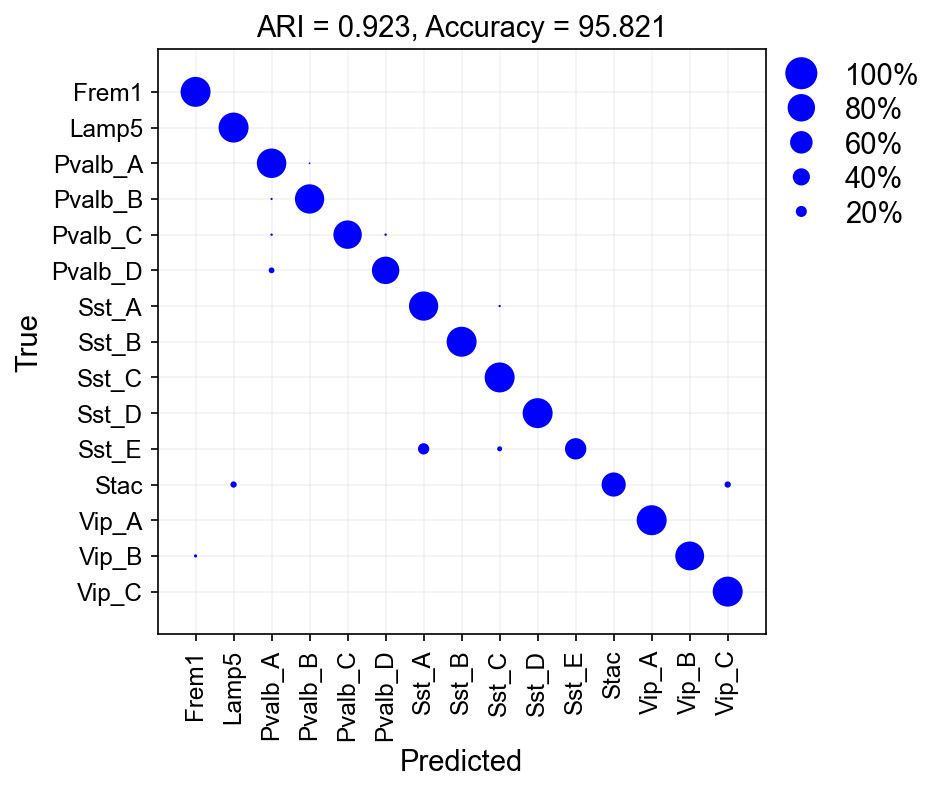

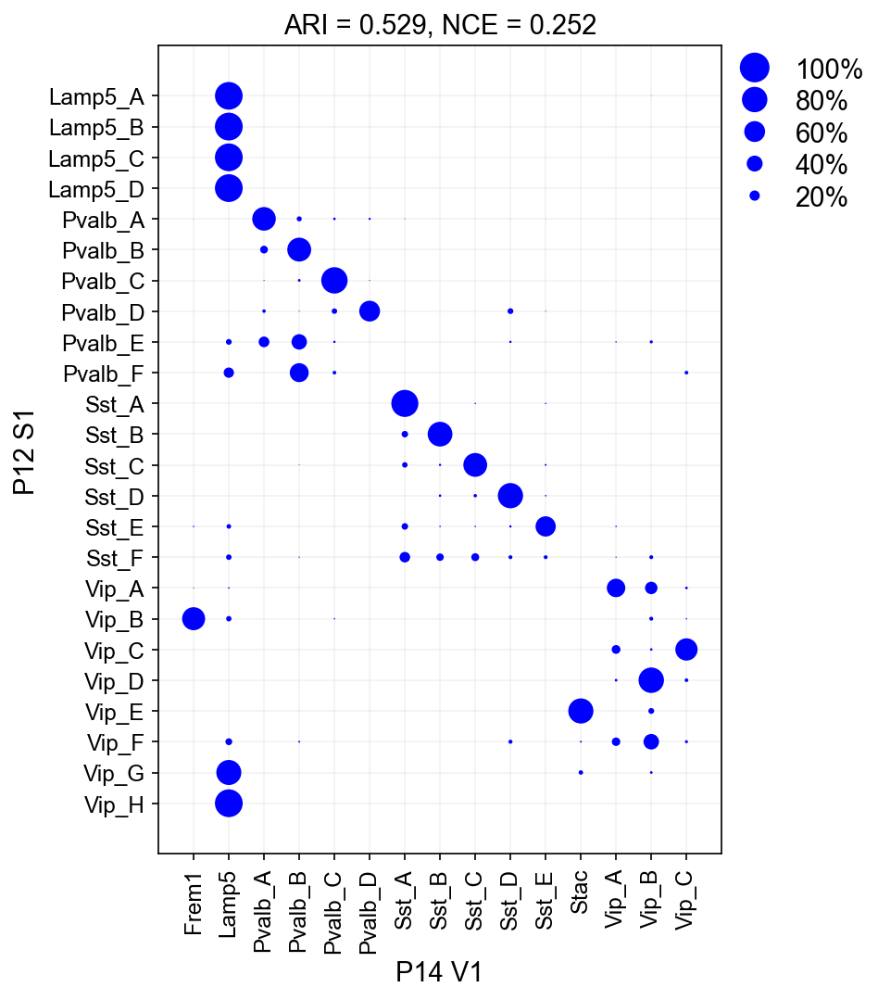

In [95]:
test_items_gab, mapping_items_gab = pairwise_map(adata_t0=P12_gaba, adata_t1=P14_V1g,test_lab='Type',
                                                                            train_lab='Type', 
                                                                          recomp_HVGs=False, union_hvgs=False,
                                         t0_dict=make_dict(P12_gaba, 'Type'),
                                         t1_dict=make_dict(P14_V1g, 'Type'),
                                        min_cells=100, x_lab='P14 V1', y_lab='P12 S1')

test_labelsP12vsP12, test_predlabelsP12vsP12, test_prediction_P12vsP12 = test_items_gab
mappingconfmatP12vsP12, mappingxticksP12vsP12_sub, mappingplotP12vsP12 = mapping_items_gab

In [96]:
a = make_dict(P14_V1g, 'Type')

In [97]:

P12_gaba.obs['P14 V1 Mapping Prob'] = np.max(test_prediction_P12vsP12, axis=1)
P12_gaba.obs['P14 V1 Mapping Label'] = pd.Categorical(test_predlabelsP12vsP12).rename_categories(list(a.keys()))

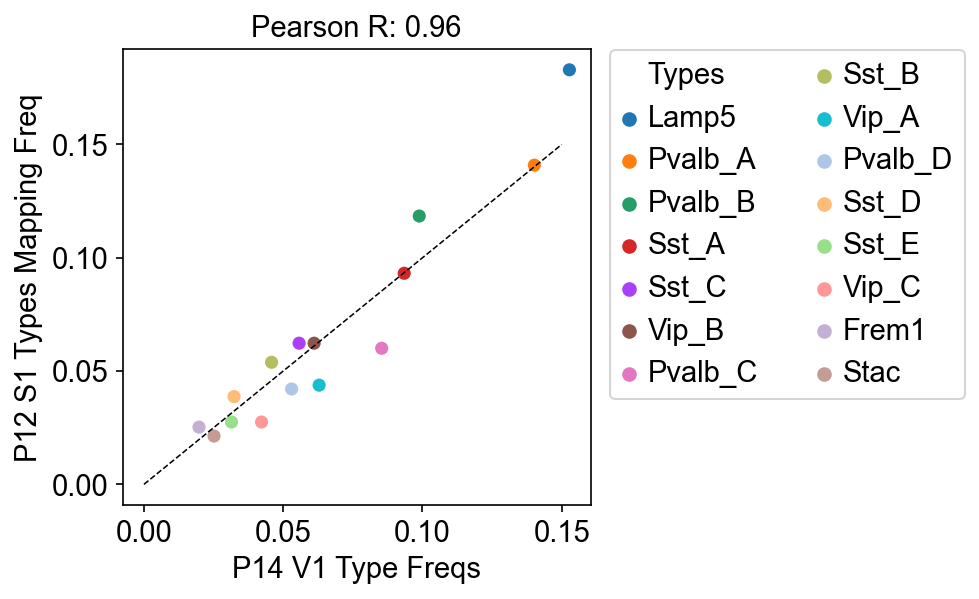

In [98]:
freq_scatter(x=P14_V1g.obs['Type'].value_counts(normalize=True),
            y= P12_gaba.obs['P14 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P14 V1 Type Freqs', y_lab='P12 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.15, )
plt.savefig('figures/V1vsS1_gaba_freqs.pdf',bbox_inches = 'tight')

In [99]:
V1_P14 = P14_V1.concatenate(P14_V1g)
S1_P12 = P12_glut.concatenate(P12_gaba)

In [100]:
pd.Categorical(P14_V1.obs['Type']).categories

Index(['L2/3_AB', 'L2/3_BC', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A',
       'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b'],
      dtype='object')

In [101]:
pd.Categorical(P14_V1g.obs['Type']).categories

Index(['Frem1', 'Lamp5', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A',
       'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')

In [102]:
ord_ = list(pd.Categorical(P14_V1.obs['Type']).categories)+list(pd.Categorical(P14_V1g.obs['Type']).categories)

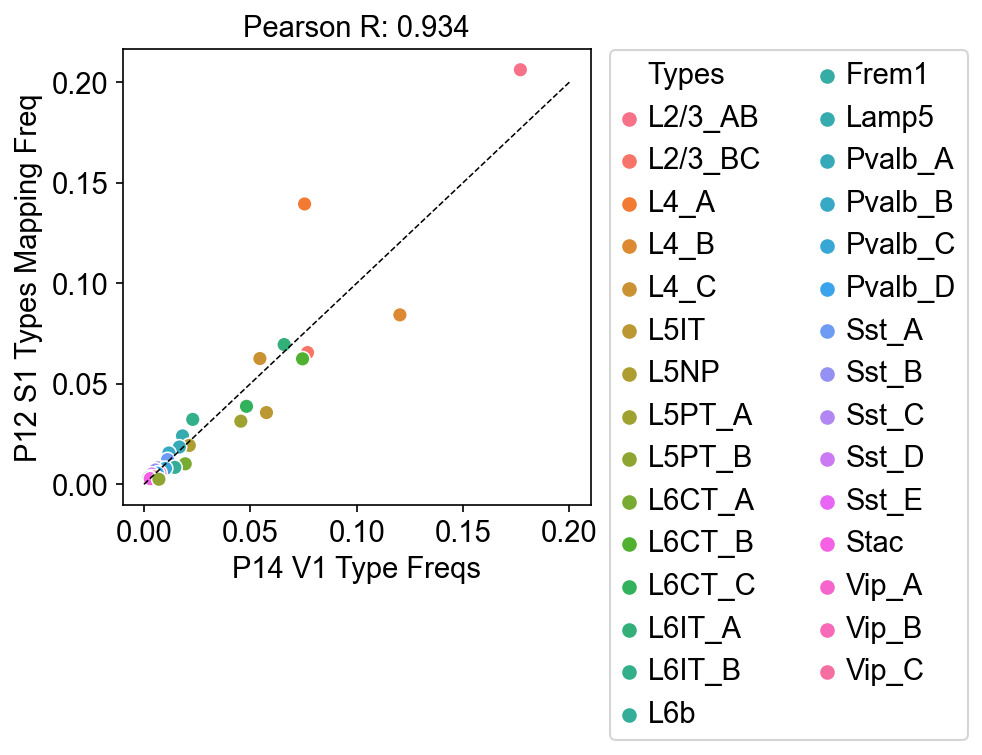

In [107]:
freq_scatter(x=V1_P14.obs['Type'].value_counts(normalize=True),
            y= S1_P12.obs['P14 V1 Mapping Label'].value_counts(normalize=True),
            x_lab='P14 V1 Type Freqs', y_lab='P12 S1 Types Mapping Freq', hue_='Types', low_lim=0,unity_lim=0.2,
            hue_ord = ord_)
# plt.xscale('log')
# plt.yscale('log')

plt.savefig('figures/V1vsS1_P14-P12_glutagaba_freqs.pdf', bbox_inches='tight')

Pvalb


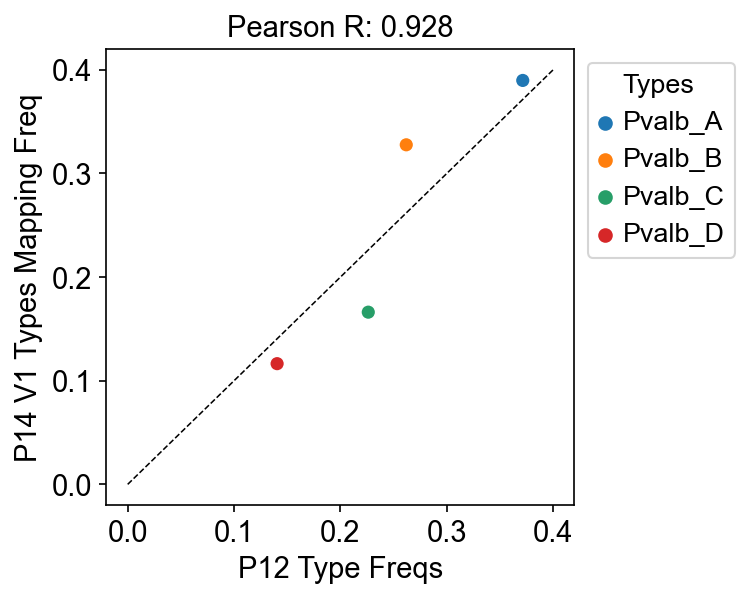

Sst


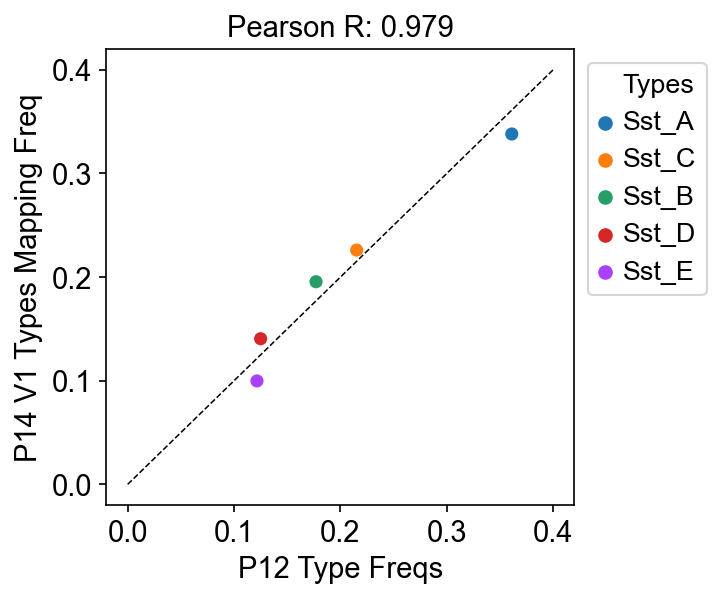

Vip


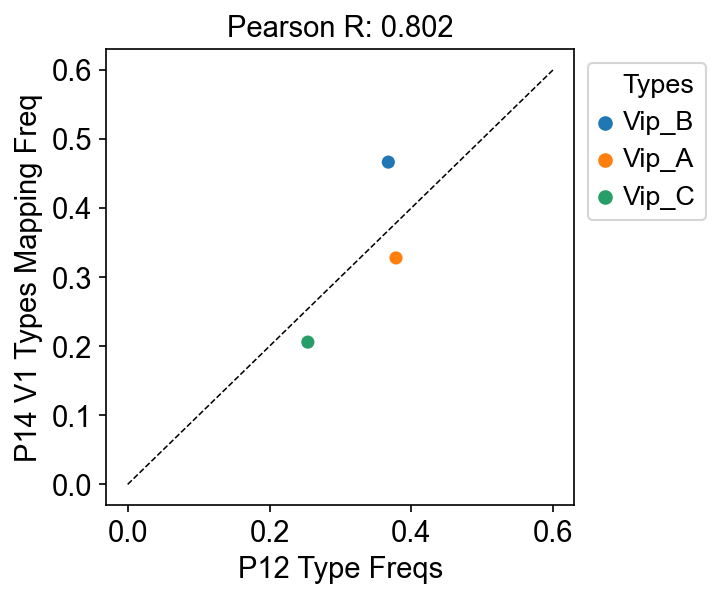

Lamp5


ValueError: x and y must have length at least 2.

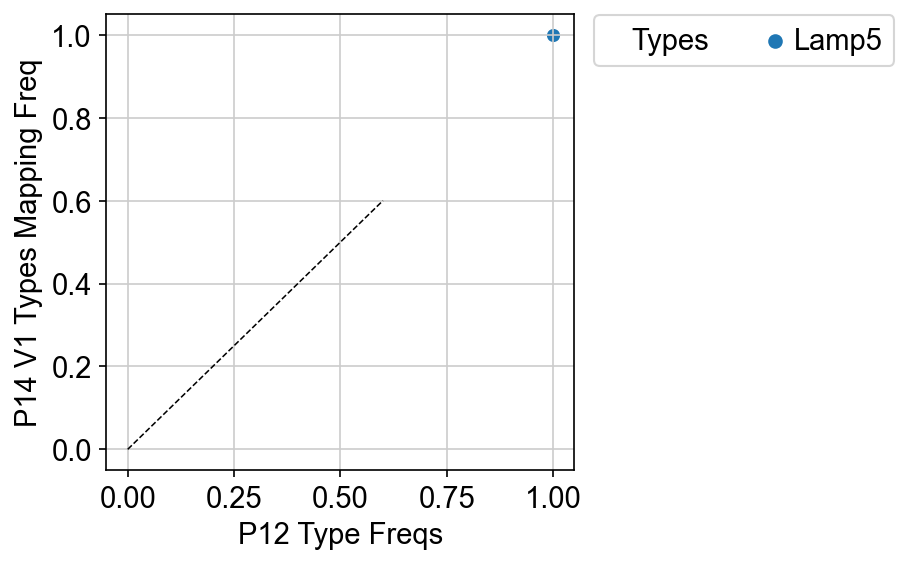

In [115]:
c = 0
lims = [0.4, 0.4, 0.6, 0.6]
low_lims = [0, 0,0,0]
xes = []
yes = []
for i in ['Pvalb', 'Sst', 'Vip', 'Lamp5']:
    print(i)
    a=P14_V1g[P14_V1g.obs['Type'].str.startswith(i),:]
    b=P12_gaba[P12_gaba.obs['P14 V1 Mapping Label'].str.startswith(i),:]
    
    xx = a.obs['Type'].value_counts(normalize=True)
    yy = b.obs['P14 V1 Mapping Label'].value_counts(normalize=True)
    
    #print(b.obs['P12 Mapping Label'].value_counts())
    
    if (i=='L4'):
        freq_scatter(x=xx[0:4], y=yy[0:4],
            x_lab='P14 V1 Type Freqs', y_lab='P12 S1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        oh=xx
        my=yy
        xes.append(xx[0:4])
        yes.append(yy[0:4])
        
    
    else:
        oh=xx
        my=yy
        freq_scatter(x=xx[xx.index.str.startswith(i)],
            y=yy[yy.index.str.startswith(i)],
            x_lab='P12 Type Freqs', y_lab='P14 V1 Types Mapping Freq', hue_='Types', unity_lim=lims[c], 
                 low_lim=low_lims[c])
        xes.append(xx[xx.index.str.startswith(i)])
        yes.append(yy[yy.index.str.startswith(i)])
        
    plt.legend(ncol=1, bbox_to_anchor=(1,1))
    plt.savefig('figures/V1vsS1_P12vP14'+i+'_freqs.pdf', bbox_inches='tight')
    plt.show()
    c = c +1

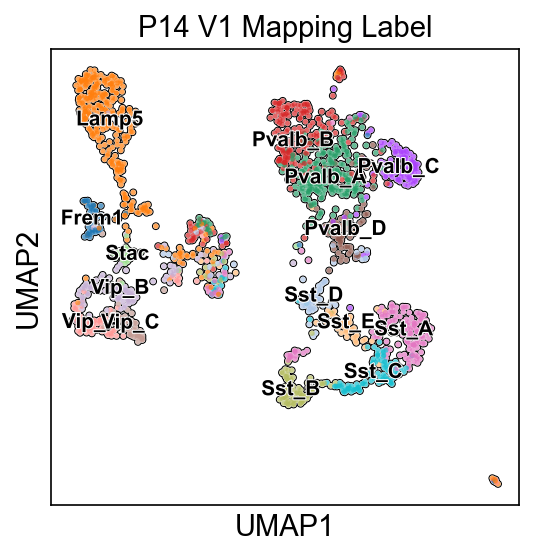

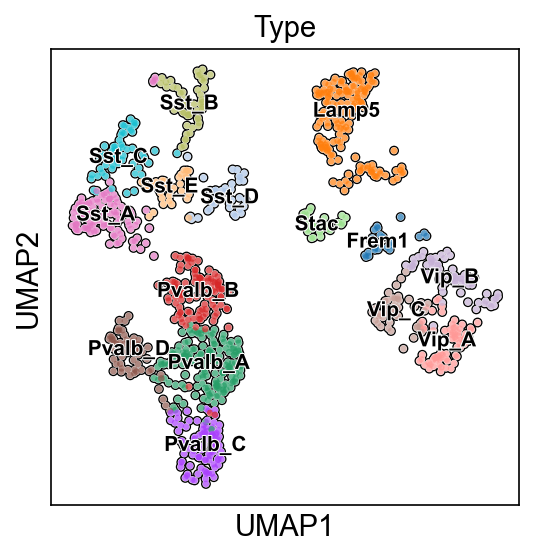

In [117]:
sc.pl.umap(P12_gaba, color=['P14 V1 Mapping Label'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=25 , legend_fontoutline=1, legend_fontweight='semibold')

sc.pl.umap(P14_V1g, color=['Type'], legend_loc='on data', legend_fontsize=10,
          add_outline=True,outline_width=(0.2,0.05), s=40 , legend_fontoutline=1, legend_fontweight='semibold')